# Data Gathering

## Library

In [109]:
!pip install emoji
!pip install textblob
!pip install contractions

In [ ]:
import pandas as pd
import numpy as np
import json
import re
import string
import emoji
import nltk
import unicodedata
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from textblob import TextBlob
import contractions
from collections import Counter, defaultdict
import matplotlib.pyplot as plt
from nltk import pos_tag
from nltk.corpus import wordnet
import seaborn as sns
from tqdm import tqdm
import os
tqdm.pandas()

In [111]:
nltk.download('punkt')
nltk.download('stopwords')
nltk.download('averaged_perceptron_tagger')
nltk.download('averaged_perceptron_tagger_eng')
nltk.download('wordnet')
nltk.download('omw-1.4')
nltk.download('punkt_tab')

[nltk_data] Downloading package punkt to C:\Users\Kelvin
[nltk_data]     Jonathan\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to C:\Users\Kelvin
[nltk_data]     Jonathan\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     C:\Users\Kelvin Jonathan\AppData\Roaming\nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!
[nltk_data] Downloading package averaged_perceptron_tagger_eng to
[nltk_data]     C:\Users\Kelvin Jonathan\AppData\Roaming\nltk_data...
[nltk_data]   Package averaged_perceptron_tagger_eng is already up-to-
[nltk_data]       date!
[nltk_data] Downloading package wordnet to C:\Users\Kelvin
[nltk_data]     Jonathan\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package omw-1.4 to C:\Us

True

## Load Data

In [112]:
print("File dalam directory saat ini:")
for file in os.listdir('.'):
    if file.endswith('.json'):
        print(f"📁 {file}")

File dalam directory saat ini:
📁 yelp_academic_dataset_business.json
📁 yelp_academic_dataset_review.json


In [113]:
def load_business_data(business_file_path):
    """
    Memuat data business dari file JSON
    """
    print("📁 Memuat data business...")
    
    business_data = []
    
    if not os.path.exists(business_file_path):
        print(f"❌ File {business_file_path} tidak ditemukan!")
        return pd.DataFrame()
    
    with open(business_file_path, 'r', encoding='utf-8') as f:
        for line in tqdm(f, desc="Loading business data"):
            try:
                business = json.loads(line)
                business_data.append({
                    'business_id': business['business_id'],
                    'business_name': business.get('name', 'Unknown Business'),
                    'address': business.get('address', ''),
                    'city': business.get('city', ''),
                    'state': business.get('state', ''),
                    'postal_code': business.get('postal code', ''),
                    'latitude': business.get('latitude', 0),
                    'longitude': business.get('longitude', 0),
                    'stars_business_average': business.get('stars', 0),
                    'review_count_business': business.get('review_count', 0),
                    'is_open': business.get('is_open', 0),
                    'categories': business.get('categories', []),
                    'attributes': business.get('attributes', {})
                })
            except json.JSONDecodeError:
                continue
    
    df_business = pd.DataFrame(business_data)
    print(f"✅ Loaded {len(df_business)} business records")
    return df_business

# %%
def load_review_data(review_file_path, sample_size=None):
    """
    Memuat data review dari file JSON
    """
    print("📁 Memuat data review...")
    
    review_data = []
    
    if not os.path.exists(review_file_path):
        print(f"❌ File {review_file_path} tidak ditemukan!")
        return pd.DataFrame()
    
    with open(review_file_path, 'r', encoding='utf-8') as f:
        for i, line in tqdm(enumerate(f), desc="Loading review data"):
            try:
                review = json.loads(line)
                review_data.append({
                    'review_id': review['review_id'],
                    'user_id': review['user_id'],
                    'business_id': review['business_id'],
                    'stars_review': review['stars'],
                    'date': review['date'],
                    'text': review['text']
                })
                
                # Jika sample_size ditentukan, berhenti setelah mencapai jumlah tersebut
                if sample_size and len(review_data) >= sample_size:
                    break
            except json.JSONDecodeError:
                continue
    
    df_review = pd.DataFrame(review_data)
    print(f"✅ Loaded {len(df_review)} review records")
    return df_review

In [114]:
def merge_business_review_data(df_business, df_review):
    """
    Menggabungkan data business dan review
    """
    print("🔄 Menggabungkan data business dan review...")
    
    # Merge data
    df_merged = df_review.merge(
        df_business[['business_id', 'business_name', 'stars_business_average', 'review_count_business', 'city', 'state', 'categories']],
        on='business_id',
        how='left'
    )
    
    # Handle missing business names
    missing_business_mask = df_merged['business_name'].isna()
    if missing_business_mask.sum() > 0:
        print(f"⚠️  {missing_business_mask.sum()} reviews tidak memiliki data business")
        df_merged.loc[missing_business_mask, 'business_name'] = 'Unknown Business'
        df_merged.loc[missing_business_mask, 'stars_business_average'] = 0
        df_merged.loc[missing_business_mask, 'review_count_business'] = 0
    
    print(f"✅ Data merged successfully!")
    print(f"   Total reviews after merge: {len(df_merged)}")
    
    return df_merged

# %%
def analyze_and_display_business_ranking(df_merged):
    """
    Menganalisis dan menampilkan ranking business berdasarkan review_count_business
    """
    print("\n🏆 BUSINESS RANKING BY REVIEW COUNT")
    print("=" * 120)
    
    # Group by business untuk mendapatkan unique businesses dengan info lengkap
    business_summary = df_merged.groupby('business_id').agg({
        'business_name': 'first',
        'review_count_business': 'first',
        'stars_business_average': 'first',
        'city': 'first',
        'state': 'first',
        'categories': 'first',
        'review_id': 'count'  # Jumlah review yang actually ada di dataset
    }).reset_index()
    
    business_summary = business_summary.rename(columns={'review_id': 'actual_reviews_in_dataset'})
    business_summary = business_summary.sort_values('review_count_business', ascending=False)
    
    # Tampilkan top businesses
    print(f"{'Rank':<4} {'Business Name':<40} {'City':<15} {'State':<5} {'Avg Stars':<10} {'Total Reviews':<12} {'In Dataset':<10} {'Categories'}")
    print("-" * 120)
    
    for i, row in business_summary.head(30).iterrows():
        # Potong nama business jika terlalu panjang
        name = row['business_name']
        if len(name) > 100:
            name = name[:60] + "..."
        
        # Ambil kategori utama
        categories = row['categories']
        if categories and len(categories) > 0:
            main_category = categories[0]
            if len(main_category) > 20:
                main_category = main_category[:17] + "..."
        else:
            main_category = "No Category"
        
        print(f"{i+1:<4} {name:<40} {str(row['city'])[:14]:<15} {str(row['state'])[:4]:<5} "
              f"{row['stars_business_average']:<10.1f} {row['review_count_business']:<12} "
              f"{row['actual_reviews_in_dataset']:<10} {main_category:<20}")
    
    return business_summary

# %%
def select_top_businesses_interactive(business_summary):
    """
    Memilih top businesses secara interaktif berdasarkan input user
    """
    print(f"\n🎯 BUSINESS SELECTION")
    print("=" * 80)
    
    total_businesses = len(business_summary)
    total_reviews_available = business_summary['actual_reviews_in_dataset'].sum()
    
    print(f"📊 SUMMARY:")
    print(f"   - Total unique businesses: {total_businesses}")
    print(f"   - Total reviews available: {total_reviews_available}")
    print(f"   - Business dengan review terbanyak: {business_summary['review_count_business'].max()} reviews")
    print(f"   - Business dengan review tersedikit: {business_summary['review_count_business'].min()} reviews")
    
    # Hitung cumulative reviews
    cumulative_reviews = business_summary['actual_reviews_in_dataset'].cumsum()
    
    # Tampilkan suggestions
    print(f"\n💡 SUGGESTIONS:")
    for n in [5, 10, 15, 20]:
        if n <= len(business_summary):
            cum_reviews = cumulative_reviews.iloc[n-1]
            coverage = (cum_reviews / total_reviews_available) * 100
            print(f"   - Top {n} businesses: {cum_reviews} reviews ({coverage:.1f}% coverage)")
    
    # User input
    while True:
        try:
            print(f"\n👉 Pilih jumlah top businesses yang ingin diambil (1-{total_businesses}):")
            user_input = input("   Jumlah: ").strip()
            
            num_businesses = int(user_input)
            if 1 <= num_businesses <= total_businesses:
                break
            else:
                print(f"❌ Masukkan angka antara 1 dan {total_businesses}")
        except ValueError:
            print("❌ Masukkan angka yang valid")
    
    # Pilih business_ids
    selected_businesses = business_summary.head(num_businesses)['business_id'].tolist()
    selected_business_info = business_summary.head(num_businesses)
    
    total_selected_reviews = selected_business_info['actual_reviews_in_dataset'].sum()
    
    print(f"\n✅ SELECTED BUSINESSES:")
    print(f"   - Jumlah business: {num_businesses}")
    print(f"   - Total reviews yang akan diambil: {total_selected_reviews}")
    
    # Tampilkan detail businesses terpilih
    print(f"\n📋 DETAIL BUSINESSES TERPILIH:")
    print("-" * 80)
    for i, row in selected_business_info.head(10).iterrows():  # Tampilkan 10 pertama
        print(f"   {i+1}. {row['business_name']}")
        print(f"      📍 {row['city']}, {row['state']}")
        print(f"      ⭐ {row['stars_business_average']} | 📝 {row['actual_reviews_in_dataset']} reviews (total: {row['review_count_business']})")
        if row['categories']:
            print(f"      🏷️  {', '.join(row['categories'][:2])}")
        print()
    
    if len(selected_business_info) > 10:
        print(f"   ... dan {len(selected_business_info) - 10} business lainnya")
    
    return selected_businesses, selected_business_info

# %%
def create_final_dataset(df_merged, selected_businesses):
    """
    Membuat dataset final hanya dengan businesses yang terpilih
    """
    print(f"\n🔧 Membuat dataset final...")
    
    # Filter hanya reviews dari businesses yang terpilih
    df_final = df_merged[df_merged['business_id'].isin(selected_businesses)].copy()
    
    # Urutkan berdasarkan review_count_business (descending) dan business_name
    df_final = df_final.sort_values(['review_count_business', 'business_name'], ascending=[False, True])
    
    # Reset index
    df_final = df_final.reset_index(drop=True)
    
    print(f"✅ Final dataset created!")
    print(f"   - Total reviews: {len(df_final)}")
    print(f"   - Unique businesses: {df_final['business_id'].nunique()}")
    print(f"   - Date range: {df_final['date'].min()} to {df_final['date'].max()}")
    
    return df_final

# %%
def visualize_business_selection(selected_business_info, df_final):
    """
    Visualisasi hasil seleksi business
    """
    print(f"\n📊 VISUALIZING SELECTION RESULTS...")
    
    plt.figure(figsize=(15, 10))
    
    # Plot 1: Top businesses by review count (selected vs available)
    plt.subplot(2, 2, 1)
    top_10_selected = selected_business_info.head(10)
    business_names = [name[:20] + "..." if len(name) > 20 else name 
                     for name in top_10_selected['business_name']]
    
    plt.barh(business_names, top_10_selected['actual_reviews_in_dataset'], 
             color='lightgreen', alpha=0.7, label='In Dataset')
    plt.barh(business_names, top_10_selected['review_count_business'],
             color='lightcoral', alpha=0.5, label='Total (Business Data)')
    plt.xlabel('Number of Reviews')
    plt.title('Top 10 Selected Businesses\n(Actual in Dataset vs Total)')
    plt.legend()
    plt.gca().invert_yaxis()
    
    # Plot 2: Star rating distribution
    plt.subplot(2, 2, 2)
    plt.hist(selected_business_info['stars_business_average'], bins=15, 
             color='skyblue', alpha=0.7, edgecolor='black')
    plt.axvline(selected_business_info['stars_business_average'].mean(), 
                color='red', linestyle='--', label=f'Mean: {selected_business_info["stars_business_average"].mean():.2f}')
    plt.xlabel('Average Star Rating')
    plt.ylabel('Number of Businesses')
    plt.title('Star Rating Distribution\n(Selected Businesses)')
    plt.legend()
    
    # Plot 3: Review count distribution
    plt.subplot(2, 2, 3)
    plt.hist(selected_business_info['actual_reviews_in_dataset'], bins=15,
             color='orange', alpha=0.7, edgecolor='black')
    plt.axvline(selected_business_info['actual_reviews_in_dataset'].mean(),
                color='red', linestyle='--', label=f'Mean: {selected_business_info["actual_reviews_in_dataset"].mean():.1f}')
    plt.xlabel('Reviews in Dataset')
    plt.ylabel('Number of Businesses')
    plt.title('Review Count Distribution\n(Selected Businesses)')
    plt.legend()
    
    # Plot 4: Cumulative coverage
    plt.subplot(2, 2, 4)
    cumulative_reviews = selected_business_info['actual_reviews_in_dataset'].cumsum()
    total_reviews = selected_business_info['actual_reviews_in_dataset'].sum()
    cumulative_percentage = (cumulative_reviews / total_reviews) * 100
    
    plt.plot(range(1, len(cumulative_percentage) + 1), cumulative_percentage, 
             marker='o', color='purple', linewidth=2)
    plt.xlabel('Number of Businesses')
    plt.ylabel('Cumulative % of Reviews')
    plt.title('Cumulative Review Coverage\n(Selected Businesses)')
    plt.grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.show()

🚀 STARTING BUSINESS + REVIEW DATA INTEGRATION
📁 Memuat data business...


Loading business data: 150346it [00:01, 100590.74it/s]


✅ Loaded 150346 business records
📁 Memuat data review...


Loading review data: 6990280it [00:40, 173156.70it/s]


✅ Loaded 6990280 review records
🔄 Menggabungkan data business dan review...
✅ Data merged successfully!
   Total reviews after merge: 6990280

🏆 BUSINESS RANKING BY REVIEW COUNT
Rank Business Name                            City            State Avg Stars  Total Reviews In Dataset Categories
------------------------------------------------------------------------------------------------------------------------
88203 Acme Oyster House                        New Orleans     LA    4.0        7568         7673       L                   
90485 Oceana Grill                             New Orleans     LA    4.0        7400         7516       R                   
41310 Hattie B’s Hot Chicken - Nashville       Nashville       TN    4.5        6093         6160       A                   
147783 Reading Terminal Market                  Philadelphia    PA    4.5        5721         5778       C                   
122424 Ruby Slipper - New Orleans               New Orleans     LA    4.5        5193

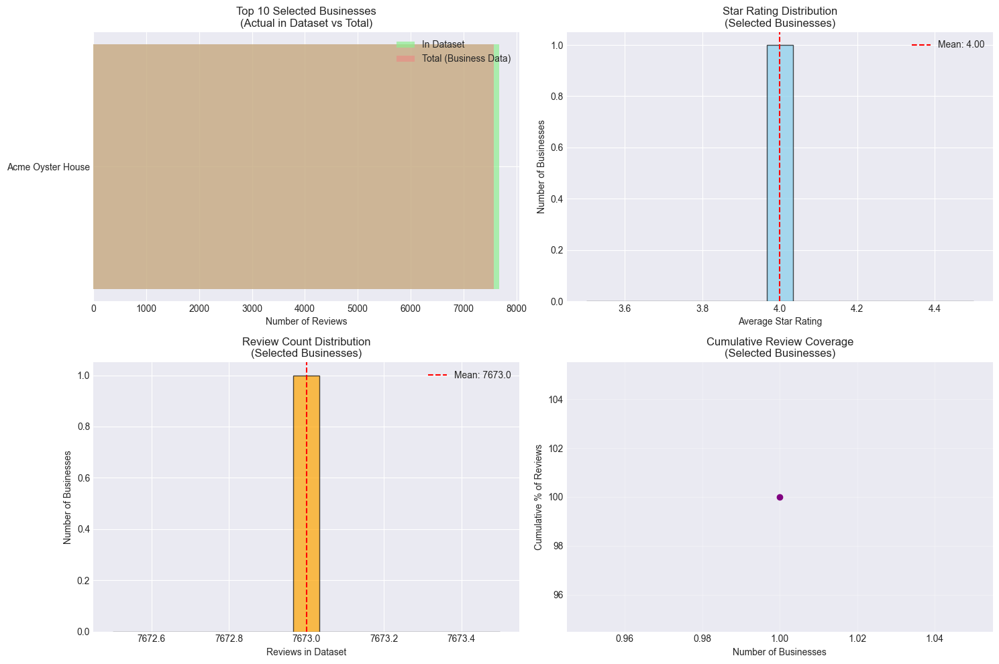


💾 SAVING RESULTS...
✅ Final dataset disimpan: yelp_business_review_merged.csv
✅ Business summary disimpan: business_selection_summary.csv

👀 SAMPLE FINAL DATASET:
    business_name  stars_review  stars_business_average  review_count_business        city state                date                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                

In [115]:
business_file_path = 'yelp_academic_dataset_business.json'
review_file_path = 'yelp_academic_dataset_review.json'

print("🚀 STARTING BUSINESS + REVIEW DATA INTEGRATION")
print("=" * 80)

# Step 1: Load business data
df_business = load_business_data(business_file_path)

if df_business.empty:
    print("❌ Tidak bisa melanjutkan tanpa data business")
else:
    # Step 2: Load review data (with sampling untuk efisiensi)
    sample_size = 1000000000  # Adjust sesuai kebutuhan
    df_review = load_review_data(review_file_path, sample_size=sample_size)
    
    if df_review.empty:
        print("❌ Tidak bisa melanjutkan tanpa data review")
    else:
        # Step 3: Merge data
        df_merged = merge_business_review_data(df_business, df_review)
        
        # Step 4: Analyze dan tampilkan ranking
        business_summary = analyze_and_display_business_ranking(df_merged)
        
        # Step 5: Pilih top businesses secara interaktif
        selected_businesses, selected_business_info = select_top_businesses_interactive(business_summary)
        
        # Step 6: Buat dataset final
        df_final = create_final_dataset(df_merged, selected_businesses)
        
        # Step 7: Visualisasi hasil
        visualize_business_selection(selected_business_info, df_final)
        
        # Step 8: Simpan hasil
        print(f"\n💾 SAVING RESULTS...")
        
        # Simpan dataset final
        output_filename = 'yelp_business_review_merged.csv'
        df_final.to_csv(output_filename, index=False, encoding='utf-8')
        print(f"✅ Final dataset disimpan: {output_filename}")
        
        # Simpan business summary
        business_summary_filename = 'business_selection_summary.csv'
        selected_business_info.to_csv(business_summary_filename, index=False)
        print(f"✅ Business summary disimpan: {business_summary_filename}")
        
        # Step 9: Tampilkan sample final dataset
        print(f"\n👀 SAMPLE FINAL DATASET:")
        print("=" * 100)
        
        sample_columns = ['business_name', 'stars_review', 'stars_business_average', 
                         'review_count_business', 'city', 'state', 'date', 'text']
        sample_data = df_final[sample_columns].head(10)
        
        pd.set_option('display.max_colwidth', 50)
        print(sample_data.to_string(index=False))
        
        # Final summary
        print(f"\n🎉 FINAL SUMMARY:")
        print("=" * 50)
        print(f"📊 Dataset Shape: {df_final.shape}")
        print(f"🏢 Unique Businesses: {df_final['business_id'].nunique()}")
        print(f"📝 Total Reviews: {len(df_final)}")
        print(f"⭐ Average Business Rating: {df_final['stars_business_average'].mean():.2f}")
        print(f"📅 Date Range: {df_final['date'].min()} to {df_final['date'].max()}")
        
        # Business distribution in final dataset
        business_dist = df_final['business_name'].value_counts()
        print(f"\n📈 BUSINESS DISTRIBUTION IN FINAL DATASET:")
        for i, (name, count) in enumerate(business_dist.head().items()):
            print(f"   {i+1}. {name}: {count} reviews")


In [116]:
df_final.head()

,review_id,user_id,business_id,stars_review,date,text,business_name,stars_business_average,review_count_business,city,state,categories
0,vHLTOsdILT7xgTu7TAWTUQ,417HF4q8ynnWtuJrkNax_g,_ab50qdWOk0DdB6XOrBitw,5.0,2016-07-25 04:34:34,This place has amazing oysters and the BEST bl...,Acme Oyster House,4.0,7568,New Orleans,LA,"Live/Raw Food, Seafood, Restaurants, Cajun/Creole"
1,I90lP6oPICTkrhCFGQt5tA,1UAb3zZQeGX6fzZax5DY1A,_ab50qdWOk0DdB6XOrBitw,5.0,2016-12-19 20:27:16,OH MY!! A must try. We had no idea there would...,Acme Oyster House,4.0,7568,New Orleans,LA,"Live/Raw Food, Seafood, Restaurants, Cajun/Creole"
2,469eAl2fB069YTF_B5zW7w,p2kXD3gNu3N776C0WrmBjA,_ab50qdWOk0DdB6XOrBitw,5.0,2018-08-23 20:58:39,The fried seafood was extremely hot. Very nice...,Acme Oyster House,4.0,7568,New Orleans,LA,"Live/Raw Food, Seafood, Restaurants, Cajun/Creole"
3,aPpHBDs7Jiiq0sb9YutOhQ,7cDhfvTSH1wTxEmXMj_ChQ,_ab50qdWOk0DdB6XOrBitw,5.0,2013-06-24 18:07:12,I love this place. I wish my stay was longer s...,Acme Oyster House,4.0,7568,New Orleans,LA,"Live/Raw Food, Seafood, Restaurants, Cajun/Creole"
4,k9OG5kA5ebruSx_f1T-P-A,7QTh-fkw9Nr2lO10-PV8yw,_ab50qdWOk0DdB6XOrBitw,3.0,2010-10-06 08:03:20,"Loved the chargrilled oysters! I mean, seriou...",Acme Oyster House,4.0,7568,New Orleans,LA,"Live/Raw Food, Seafood, Restaurants, Cajun/Creole"


In [117]:
df_final.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7673 entries, 0 to 7672
Data columns (total 12 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   review_id               7673 non-null   object 
 1   user_id                 7673 non-null   object 
 2   business_id             7673 non-null   object 
 3   stars_review            7673 non-null   float64
 4   date                    7673 non-null   object 
 5   text                    7673 non-null   object 
 6   business_name           7673 non-null   object 
 7   stars_business_average  7673 non-null   float64
 8   review_count_business   7673 non-null   int64  
 9   city                    7673 non-null   object 
 10  state                   7673 non-null   object 
 11  categories              7673 non-null   object 
dtypes: float64(2), int64(1), object(9)
memory usage: 719.5+ KB


In [118]:
df = df_final.copy()

In [119]:
print("Data loaded successfully!")
print(f"Shape: {df.shape}")
print("\nFirst 5 rows:")
df.head()

Data loaded successfully!
Shape: (7673, 12)

First 5 rows:


,review_id,user_id,business_id,stars_review,date,text,business_name,stars_business_average,review_count_business,city,state,categories
0,vHLTOsdILT7xgTu7TAWTUQ,417HF4q8ynnWtuJrkNax_g,_ab50qdWOk0DdB6XOrBitw,5.0,2016-07-25 04:34:34,This place has amazing oysters and the BEST bl...,Acme Oyster House,4.0,7568,New Orleans,LA,"Live/Raw Food, Seafood, Restaurants, Cajun/Creole"
1,I90lP6oPICTkrhCFGQt5tA,1UAb3zZQeGX6fzZax5DY1A,_ab50qdWOk0DdB6XOrBitw,5.0,2016-12-19 20:27:16,OH MY!! A must try. We had no idea there would...,Acme Oyster House,4.0,7568,New Orleans,LA,"Live/Raw Food, Seafood, Restaurants, Cajun/Creole"
2,469eAl2fB069YTF_B5zW7w,p2kXD3gNu3N776C0WrmBjA,_ab50qdWOk0DdB6XOrBitw,5.0,2018-08-23 20:58:39,The fried seafood was extremely hot. Very nice...,Acme Oyster House,4.0,7568,New Orleans,LA,"Live/Raw Food, Seafood, Restaurants, Cajun/Creole"
3,aPpHBDs7Jiiq0sb9YutOhQ,7cDhfvTSH1wTxEmXMj_ChQ,_ab50qdWOk0DdB6XOrBitw,5.0,2013-06-24 18:07:12,I love this place. I wish my stay was longer s...,Acme Oyster House,4.0,7568,New Orleans,LA,"Live/Raw Food, Seafood, Restaurants, Cajun/Creole"
4,k9OG5kA5ebruSx_f1T-P-A,7QTh-fkw9Nr2lO10-PV8yw,_ab50qdWOk0DdB6XOrBitw,3.0,2010-10-06 08:03:20,"Loved the chargrilled oysters! I mean, seriou...",Acme Oyster House,4.0,7568,New Orleans,LA,"Live/Raw Food, Seafood, Restaurants, Cajun/Creole"


# EDA

In [120]:
import json

# Path ke file (ganti sesuai lokasi file kamu)
file_path = "yelp_academic_dataset_business.json"

# Baca file JSON baris demi baris (karena dataset Yelp sangat besar)
with open(file_path, 'r', encoding='utf-8') as f:
    for line in f:
        business = json.loads(line)
        if business.get('name') == "Acme Oyster House":
            print(json.dumps(business, indent=4))


{
    "business_id": "Ppy-UN5RptIog4AvNnAM-g",
    "name": "Acme Oyster House",
    "address": "3000 Veterans Blvd",
    "city": "Metairie",
    "state": "LA",
    "postal_code": "70002",
    "latitude": 30.002567,
    "longitude": -90.1530120373,
    "stars": 4.0,
    "review_count": 775,
    "is_open": 1,
    "attributes": {
        "RestaurantsPriceRange2": "2",
        "Caters": "True",
        "BusinessAcceptsCreditCards": "True",
        "RestaurantsGoodForGroups": "True",
        "GoodForKids": "True",
        "RestaurantsTakeOut": "True",
        "BusinessParking": "{'garage': False, 'street': False, 'validated': False, 'lot': True, 'valet': False}",
        "NoiseLevel": "u'average'",
        "HasTV": "True",
        "Alcohol": "u'full_bar'",
        "RestaurantsReservations": "False",
        "RestaurantsAttire": "'casual'",
        "GoodForMeal": "{u'breakfast': False, u'brunch': None, u'lunch': True, u'dinner': True, u'latenight': False, u'dessert': None}",
        "BikePar

In [121]:
print(f"Jumlah data: {len(df)}")
print(f"Kolom yang ada: {df.columns.tolist()}")
print("\nInfo dataset:")
df.info()
print("\nStatistik deskriptif:")
df.describe(include='all')

Jumlah data: 7673
Kolom yang ada: ['review_id', 'user_id', 'business_id', 'stars_review', 'date', 'text', 'business_name', 'stars_business_average', 'review_count_business', 'city', 'state', 'categories']

Info dataset:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7673 entries, 0 to 7672
Data columns (total 12 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   review_id               7673 non-null   object 
 1   user_id                 7673 non-null   object 
 2   business_id             7673 non-null   object 
 3   stars_review            7673 non-null   float64
 4   date                    7673 non-null   object 
 5   text                    7673 non-null   object 
 6   business_name           7673 non-null   object 
 7   stars_business_average  7673 non-null   float64
 8   review_count_business   7673 non-null   int64  
 9   city                    7673 non-null   object 
 10  state                   7673 non

,review_id,user_id,business_id,stars_review,date,text,business_name,stars_business_average,review_count_business,city,state,categories
count,7673,7673,7673,7673.000000,7673,7673,7673,7673.0,7673.0,7673,7673,7673
unique,7673,7568,1,NaN,7673,7662,1,NaN,NaN,1,1,1
top,3ZITpVsXpm8saiCRJyQv0A,eZGoPMRfq2hw5LfwJg0uTA,_ab50qdWOk0DdB6XOrBitw,NaN,2015-11-08 04:58:48,"I've never been more disrespected in my life, ...",Acme Oyster House,NaN,NaN,New Orleans,LA,"Live/Raw Food, Seafood, Restaurants, Cajun/Creole"
freq,1,3,7673,NaN,1,3,7673,NaN,NaN,7673,7673,7673
mean,NaN,NaN,NaN,4.124984,NaN,NaN,NaN,4.0,7568.0,NaN,NaN,NaN
std,NaN,NaN,NaN,1.067773,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN
min,NaN,NaN,NaN,1.000000,NaN,NaN,NaN,4.0,7568.0,NaN,NaN,NaN
25%,NaN,NaN,NaN,4.000000,NaN,NaN,NaN,4.0,7568.0,NaN,NaN,NaN
50%,NaN,NaN,NaN,4.000000,NaN,NaN,NaN,4.0,7568.0,NaN,NaN,NaN
75%,NaN,NaN,NaN,5.000000,NaN,NaN,NaN,4.0,7568.0,NaN,NaN,NaN


yang ga kepake lagi:
- business_id
- review_count_business
- city
- state
- categories

=== DISTRIBUSI RATING ===


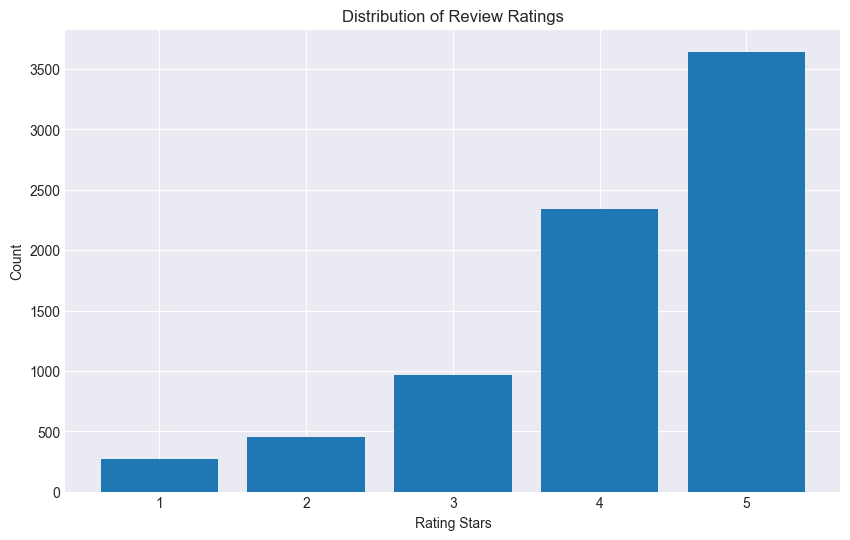

Count per rating:
⭐ 1.0: 273 reviews (3.56%)
⭐ 2.0: 449 reviews (5.85%)
⭐ 3.0: 969 reviews (12.63%)
⭐ 4.0: 2337 reviews (30.46%)
⭐ 5.0: 3645 reviews (47.50%)


In [122]:
print("=== DISTRIBUSI RATING ===")
plt.figure(figsize=(10, 6))
rating_counts = df['stars_review'].value_counts().sort_index()
plt.bar(rating_counts.index, rating_counts.values)
plt.xlabel('Rating Stars')
plt.ylabel('Count')
plt.title('Distribution of Review Ratings')
plt.show()

print("Count per rating:")
for star, count in rating_counts.items():
    print(f"⭐ {star}: {count} reviews ({count/len(df)*100:.2f}%)")

In [123]:
# Gabungkan semua teks jadi satu string besar
all_words = " ".join(df['text']).split()

# Hitung frekuensi kata
word_freq = Counter(all_words)

common_words= word_freq.most_common(10)

print("10 Kata Paling Umum:")
for word, freq in common_words:
    print(f"{word}: {freq}")


10 Kata Paling Umum:
the: 30633
and: 22564
a: 15978
was: 14216
I: 14156
to: 14003
of: 9646
in: 8407
oysters: 7629
The: 7611


Banyak kata kata yang tidak bermakna untuk kasus ini, sehingga akan dilakukan sejumlah preprocessing

In [124]:
def extract_emojis(text):
    return [char for char in str(text) if char in emoji.EMOJI_DATA]

# Gabungkan semua emoji dari seluruh teks
all_emojis = df['text'].apply(extract_emojis).sum()  # flatten list

# Hitung frekuensi kemunculan emoji
from collections import Counter
emoji_freq = Counter(all_emojis)

# Tampilkan 20 emoji paling sering
print("🔍 20 emoji yang paling sering muncul:")
for e, c in emoji_freq.most_common(20):
    print(f"{e}  →  {c} kali")


🔍 20 emoji yang paling sering muncul:
‼  →  3 kali
™  →  1 kali
®  →  1 kali


# Data Pre-processing

## Remove Unnecessary Column

In [125]:
# Hapus kolom yang tidak diperlukan
drop_cols = ['business_id', 'review_count_business', 'city', 'state', 'categories']

# Pastikan hanya kolom yang ada dihapus (biar aman)
df = df.drop(columns=[col for col in drop_cols if col in df.columns], errors='ignore')

print("✅ Columns dropped successfully!")
print("Remaining columns:")
print(df.columns.tolist())

✅ Columns dropped successfully!
Remaining columns:
['review_id', 'user_id', 'stars_review', 'date', 'text', 'business_name', 'stars_business_average']


In [126]:
new_order = [
    'business_name',
    'review_id',
    'user_id',
    'date',
    'text',
    'stars_review',
    'stars_business_average'
]

# Pastikan semua kolom itu ada di dataframe
existing_cols = [col for col in new_order if col in df.columns]

# Ubah urutan kolom
df = df[existing_cols]

print("✅ Columns reordered successfully!")
df.head()

✅ Columns reordered successfully!


,business_name,review_id,user_id,date,text,stars_review,stars_business_average
0,Acme Oyster House,vHLTOsdILT7xgTu7TAWTUQ,417HF4q8ynnWtuJrkNax_g,2016-07-25 04:34:34,This place has amazing oysters and the BEST bl...,5.0,4.0
1,Acme Oyster House,I90lP6oPICTkrhCFGQt5tA,1UAb3zZQeGX6fzZax5DY1A,2016-12-19 20:27:16,OH MY!! A must try. We had no idea there would...,5.0,4.0
2,Acme Oyster House,469eAl2fB069YTF_B5zW7w,p2kXD3gNu3N776C0WrmBjA,2018-08-23 20:58:39,The fried seafood was extremely hot. Very nice...,5.0,4.0
3,Acme Oyster House,aPpHBDs7Jiiq0sb9YutOhQ,7cDhfvTSH1wTxEmXMj_ChQ,2013-06-24 18:07:12,I love this place. I wish my stay was longer s...,5.0,4.0
4,Acme Oyster House,k9OG5kA5ebruSx_f1T-P-A,7QTh-fkw9Nr2lO10-PV8yw,2010-10-06 08:03:20,"Loved the chargrilled oysters! I mean, seriou...",3.0,4.0


## Handling Missing Values

In [127]:
missing_data = df.isnull().sum()
missing_percent = (df.isnull().sum() / len(df)) * 100
missing_info = pd.DataFrame({
    'Missing Count': missing_data,
    'Missing Percentage': missing_percent
})
print(missing_info)

                        Missing Count  Missing Percentage
business_name                       0                 0.0
review_id                           0                 0.0
user_id                             0                 0.0
date                                0                 0.0
text                                0                 0.0
stars_review                        0                 0.0
stars_business_average              0                 0.0


## Cleaning Text & Text Normalization That Have Number or Punctuation

In [128]:
def clean_text(text):
    # Simpan text asli untuk perbandingan
    original_text = str(text)

    # 0️⃣ Custom replacements (bisa kamu tambah terus)
    custom_replacements = {
        'B/C': 'because',
        'R2L': 'reading to learn',
        'AFAIK': 'as far as i know'
    }

    # Terapkan penggantian sebelum hapus angka/punctuation
    for pattern, replacement in custom_replacements.items():
        text = re.sub(pattern, replacement, text)

    # 1️⃣ Convert emoji to text
    text = emoji.demojize(text, delimiters=(" ", " "))

    # 2️⃣ Normalize unicode accents (ñ -> n, é -> e, etc.)
    text = unicodedata.normalize('NFKD', text).encode('ascii', 'ignore').decode('utf-8')

    # 3️⃣ Remove URLs
    text = re.sub(r'http\S+|www\S+|https\S+', '', text, flags=re.MULTILINE)

    # 4️⃣ Remove HTML tags
    text = re.sub(r'<.*?>', '', text)

    # 5️⃣ Expand contractions (I'm -> I am)
    text = contractions.fix(text)

    # 6️⃣ Remove punctuation dan special characters (keep letters + spaces)
    text = re.sub(r'[^a-zA-Z\s]', ' ', text)

    # 7️⃣ Remove extra whitespaces
    text = re.sub(r'\s+', ' ', text).strip()

    # Debug print untuk beberapa sample acak
    if np.random.random() < 0.001:
        print(f"\nOriginal: {original_text[:120]}...")
        print(f"Cleaned:  {text[:120]}...")
        print("---")

    return text

In [129]:
sample_texts = df['text'].head(5).tolist()

for i, text in enumerate(sample_texts):
    print(f"\n--- Sample {i+1} ---")
    print(f"SEBELUM: {text}")
    cleaned = clean_text(text)
    print(f"SESUDAH: {cleaned}")


--- Sample 1 ---
SEBELUM: This place has amazing oysters and the BEST bloody mary during my stay in NOLA. The wait wasn't too long. It went by fairly quick but I do recommend having a drink in hand while you wait. We sat at the bar in front of Hollywood, the Master Shucker, and he was great! Super focused on his work but attentive enough to not keep us waiting on anything. We tried both the fresh oysters and the chargrilled and boy, were those phenomenal. My colleague and I had oysters at each restaurant we dined at to truly see who offered the best and Acme wins, hands down.
SESUDAH: This place has amazing oysters and the BEST bloody mary during my stay in NOLA The wait was not too long It went by fairly quick but I do recommend having a drink in hand while you wait We sat at the bar in front of Hollywood the Master Shucker and he was great Super focused on his work but attentive enough to not keep us waiting on anything We tried both the fresh oysters and the chargrilled and boy wer

In [130]:
print("Memulai proses cleaning text...")
df['cleaned_text'] = df['text'].progress_apply(clean_text)
print("Cleaning text selesai!")

Memulai proses cleaning text...


  0%|          | 0/7673 [00:00<?, ?it/s]


Original: I'm not quite sure what the big deal is with the chargrilled oysters... to me, they're for people that don't like oyster...
Cleaned:  I am not quite sure what the big deal is with the chargrilled oysters to me they are for people that do not like oysters...
---


 25%|██▍       | 1918/7673 [00:00<00:01, 4243.29it/s]


Original: The chargrilled oysters are amazing and the 30 minute wait was well worth it. Pam, the bartender, was awesome!

Side not...
Cleaned:  The chargrilled oysters are amazing and the minute wait was well worth it Pam the bartender was awesome Side note I vent...
---


 49%|████▉     | 3792/7673 [00:00<00:00, 4618.89it/s]


Original: Long wait so get a beer for the line. Grilled oysters are AMAZING!!! And waitstaff is friendly and quick!...
Cleaned:  Long wait so get a beer for the line Grilled oysters are AMAZING And waitstaff is friendly and quick...
---


 68%|██████▊   | 5232/7673 [00:01<00:00, 4730.03it/s]


Original: ACME is okay.  It's reputation precedes and most make a stop here, but if you partake of oysters around, you'll likely f...
Cleaned:  ACME is okay It is reputation precedes and most make a stop here but if you partake of oysters around you will likely fi...
---

Original: The service was decent enough. Took a long while to get our orders and drinks. Food was decent. Worst party about it was...
Cleaned:  The service was decent enough Took a long while to get our orders and drinks Food was decent Worst party about it was th...
---


 87%|████████▋ | 6640/7673 [00:01<00:00, 4579.73it/s]


Original: I was in New Orleans and Acme Oyster House was the best place I went to our of all the restaurants...
Cleaned:  I was in New Orleans and Acme Oyster House was the best place I went to our of all the restaurants...
---

Original: Ate there today. Waited in line, but if you're waiting for people to join you, they won't seat you unless the whole part...
Cleaned:  Ate there today Waited in line but if you are waiting for people to join you they will not seat you unless the whole par...
---

Original: I absolutely love the charbroiled oysters have not had a restaurant yet to compare to their oysters. I'm a fan of  the g...
Cleaned:  I absolutely love the charbroiled oysters have not had a restaurant yet to compare to their oysters I am a fan of the gu...
---


 93%|█████████▎| 7099/7673 [00:01<00:00, 4507.70it/s]


Original: In Nola for NYE 2020 and was told by both a friend and the Uber driver to try this place. First let me say there will be...
Cleaned:  In Nola for NYE and was told by both a friend and the Uber driver to try this place First let me say there will be a wai...
---


100%|██████████| 7673/7673 [00:01<00:00, 4454.08it/s]

Cleaning text selesai!


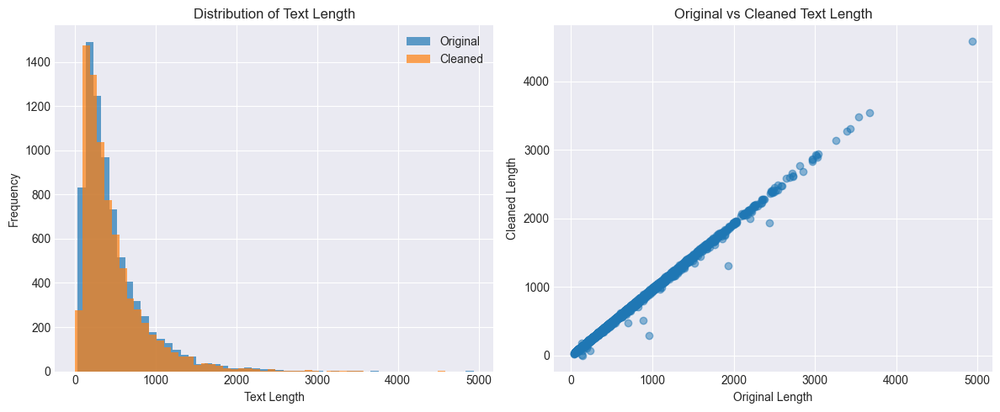

Rata-rata panjang text asli: 478.19
Rata-rata panjang text cleaned: 461.65


In [131]:
df['original_length'] = df['text'].str.len()
df['cleaned_length'] = df['cleaned_text'].str.len()

plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.hist(df['original_length'], bins=50, alpha=0.7, label='Original')
plt.hist(df['cleaned_length'], bins=50, alpha=0.7, label='Cleaned')
plt.xlabel('Text Length')
plt.ylabel('Frequency')
plt.legend()
plt.title('Distribution of Text Length')

plt.subplot(1, 2, 2)
plt.scatter(df['original_length'], df['cleaned_length'], alpha=0.5)
plt.xlabel('Original Length')
plt.ylabel('Cleaned Length')
plt.title('Original vs Cleaned Text Length')
plt.tight_layout()
plt.show()

print(f"Rata-rata panjang text asli: {df['original_length'].mean():.2f}")
print(f"Rata-rata panjang text cleaned: {df['cleaned_length'].mean():.2f}")

## Text Normalization

In [132]:
def normalize_text_with_context(row):

    text = row['cleaned_text']

    slang_dict = {
        'brb': 'be right back',
        'ttyl': 'talk to you later',
        'gr8': 'great',
        'lol': '',
        'omg': 'oh my god',
        'wtf': 'what the fuck',
        'idk': 'i do not know',
        'imo': 'in my opinion',
        'imho': 'in my humble opinion',
        'smh': 'shaking my head',
        'tbh': 'to be honest',
        'afaik': 'as far as i know',
        'irl': 'in real life',
        'btw': 'by the way',
        'b4': 'before',
        'bday': 'birthday',
        'bff': 'best friend forever',
        'lmao': '',
        'rofl': '',
        'np': 'no problem',
        'pls': 'please',
        'plz': 'please',
        'u': 'you',
        'ur': 'your',
        'r': 'are',
        'ya': 'you',
        'tho': 'though',
        'thx': 'thanks',
        'ty': 'thank you',
        'gud': 'good',
        'luv': 'love',
        'coz': 'because',
        'bc': 'because',
        'bcoz': 'because',
        'gonna': 'going to',
        'wanna': 'want to',
        'gotta': 'got to',
        'kinda': 'kind of',
        'sorta': 'sort of',
        'aint': 'is not',
        'w/': 'with',
        'w/o': 'without',
        '2': 'to',
        '4': 'for',
        'y': 'why',
        'cuz': 'because',
        'sry': 'sorry',
        'omw': 'on my way',
        'ikr': 'i know right',
        'idc': 'i do not care',
        'fyi': 'for your information',
        'allll':'all',
        'untill':'until',
        'pics':'pictures',
        'ppl':'people'
    }

    words = text.split()
    normalized_words = []
    changes = []

    for word in words:
        low = word.lower()
        if low in slang_dict:
            new_word = slang_dict[low]
            if new_word != word:
                changes.append((word, new_word))
            normalized_words.append(new_word)
        else:
            normalized_words.append(word)

    normalized_text = ' '.join(normalized_words)

    # hanya print kalau ada perubahan
    if changes:
        print("────────────────────────────────────────────")
        print(f"🆔 Review ID: {row['review_id']}")
        print("📄 Original text:")
        print(row['text'])
        print("\n🧹 Cleaned text:")
        print(row['cleaned_text'])
        print("\n✨ Normalized text:")
        print(normalized_text)
        print("\n🔄 Changes:", ", ".join([f"{old}->{new}" for old, new in changes]))
        print("────────────────────────────────────────────\n")

    return normalized_text


In [133]:
df['normalized_text'] = df.apply(normalize_text_with_context, axis=1)

────────────────────────────────────────────
🆔 Review ID: Ck6CucWHn3Ra8X9rNw9P5g
📄 Original text:
The very best oysters if you are there and the month ends in a r you will taste salty sweet oysters! Wish I was there today- the guys at the bar are amazing shucking the oysters and laughing at life in general! Grab a beer and season your beauty the way you like it!

🧹 Cleaned text:
The very best oysters if you are there and the month ends in a r you will taste salty sweet oysters Wish I was there today the guys at the bar are amazing shucking the oysters and laughing at life in general Grab a beer and season your beauty the way you like it

✨ Normalized text:
The very best oysters if you are there and the month ends in a are you will taste salty sweet oysters Wish I was there today the guys at the bar are amazing shucking the oysters and laughing at life in general Grab a beer and season your beauty the way you like it

🔄 Changes: r->are
────────────────────────────────────────────

─────

In [134]:
def remove_extra_spaces(text):
    cleaned = re.sub(r'\s+', ' ', text).strip()
    if text != cleaned:
        print("Before:", repr(text[:]))
        print("After: ", repr(cleaned[:]))
        print("───────────────────────────────")
    return cleaned

df['normalized_text'] = df['normalized_text'].apply(remove_extra_spaces)

Before: 'This was the best oyster bar in town And I do not even eat oysters  HOWEVER Hollywood got me to try both raw and charbroiled and let me tell you those charbroiled oysters were AMAZING'
After:  'This was the best oyster bar in town And I do not even eat oysters HOWEVER Hollywood got me to try both raw and charbroiled and let me tell you those charbroiled oysters were AMAZING'
───────────────────────────────
Before: 'Came here with my boyfriend and a friend of his honestly I was not expecting much from an oyster house but it was everything and more The grilled oysters with garlic sauce were amazing We had that for the table I order the crab cake entree that came with hush puppies and jambalaya and baby let me tell you it was EVERYTHING Everyone at the table enjoyed there meal My boyfriend and I decided to share a banana foster cheesecake and my only complaint was that I had to share it with him  I have had banana foster and I have had cheesecake but never together and it was hea

## Case folding (convert to lowercase)

In [135]:
df['case_folded_text'] = df['normalized_text'].str.lower()

In [136]:
print(f"Before: {df['normalized_text'].iloc[0]}")
print(f"After: {df['case_folded_text'].iloc[0]}")

Before: This place has amazing oysters and the BEST bloody mary during my stay in NOLA The wait was not too long It went by fairly quick but I do recommend having a drink in hand while you wait We sat at the bar in front of Hollywood the Master Shucker and he was great Super focused on his work but attentive enough to not keep us waiting on anything We tried both the fresh oysters and the chargrilled and boy were those phenomenal My colleague and I had oysters at each restaurant we dined at to truly see who offered the best and Acme wins hands down
After: this place has amazing oysters and the best bloody mary during my stay in nola the wait was not too long it went by fairly quick but i do recommend having a drink in hand while you wait we sat at the bar in front of hollywood the master shucker and he was great super focused on his work but attentive enough to not keep us waiting on anything we tried both the fresh oysters and the chargrilled and boy were those phenomenal my colleague

## Tokenizing

In [137]:
df['tokens'] = df['case_folded_text'].apply(word_tokenize)

In [138]:
for i in range(3):
    print(f"\nSample {i+1}:")
    print(f"Text: {df['case_folded_text'].iloc[i]}")
    print(f"Tokens: {df['tokens'].iloc[i]}")


Sample 1:
Text: this place has amazing oysters and the best bloody mary during my stay in nola the wait was not too long it went by fairly quick but i do recommend having a drink in hand while you wait we sat at the bar in front of hollywood the master shucker and he was great super focused on his work but attentive enough to not keep us waiting on anything we tried both the fresh oysters and the chargrilled and boy were those phenomenal my colleague and i had oysters at each restaurant we dined at to truly see who offered the best and acme wins hands down
Tokens: ['this', 'place', 'has', 'amazing', 'oysters', 'and', 'the', 'best', 'bloody', 'mary', 'during', 'my', 'stay', 'in', 'nola', 'the', 'wait', 'was', 'not', 'too', 'long', 'it', 'went', 'by', 'fairly', 'quick', 'but', 'i', 'do', 'recommend', 'having', 'a', 'drink', 'in', 'hand', 'while', 'you', 'wait', 'we', 'sat', 'at', 'the', 'bar', 'in', 'front', 'of', 'hollywood', 'the', 'master', 'shucker', 'and', 'he', 'was', 'great', 'su

## Remove Stopwords

In [159]:
stop_words = set(stopwords.words('english'))

important_words = {'not', 'no', 'nor', 'never', 'very', 'too', 'but', 'against', 'down', 'off', 'under', 'up', "very", "too", "so", "really", "extremely", "highly", "absolutely", "totally", "completely", "perfectly", "particularly", "utterly", "incredibly", "super", "amazingly", "remarkably", "especially", "but", "however", "although", "though", "whereas", "yet", "nevertheless", "still", "nonetheless", "because", "since", "unless", "if", "when", "while", "before", "after", "until", "once", "just", "even", "only", "almost", "probably", "maybe", "perhaps", "surely", "clearly", "actually", "basically", "literally", "definitely"}

custom_remove_words = {'oyster', 'food', 'chargrilled', 'oysters', 'foods'}

# Versi ML
def remove_stopwords_ml(tokens):
    return [
        token for token in tokens
        if token.lower() not in stop_words and token.lower() not in custom_remove_words
    ]

# Versi Deep Learning
def remove_stopwords_dl(tokens):
    return [
        token for token in tokens
        if (token.lower() not in stop_words or token.lower() in important_words)
        and token.lower() not in custom_remove_words
    ]

def keep_all_tokens_bert(tokens): 
    return tokens

In [160]:
df['tokens_ml'] = df['tokens'].apply(remove_stopwords_ml)
df['tokens_dl'] = df['tokens'].apply(remove_stopwords_dl)
df['tokens_bert'] = df['tokens'].apply(keep_all_tokens_bert)

In [161]:
for i in range(50):
    print(f"\n🧩 Sample {i+1}:")
    print(f"📑Original: {df['tokens'].iloc[i][:]}...")
    print(f"1️⃣ML:       {df['tokens_ml'].iloc[i][:]}...")
    print(f"2️⃣DL:       {df['tokens_dl'].iloc[i][:]}...")
    print(f"3️⃣BERT:     {df['tokens_bert'].iloc[i][:]}...")

# Hitung rata-rata panjang token di tiap versi
avg_before = df['tokens'].apply(len).mean()
avg_ml = df['tokens_ml'].apply(len).mean()
avg_dl = df['tokens_dl'].apply(len).mean()
avg_bert = df['tokens_bert'].apply(len).mean()

print("\n📊 Statistik panjang token rata-rata:")
print(f"Asli  : {avg_before:.2f}")
print(f"ML    : {avg_ml:.2f}  → Stopwords dihapus semua")
print(f"DL    : {avg_dl:.2f}  → Stopwords penting dipertahankan")
print(f"BERT  : {avg_bert:.2f}  → Tidak dihapus sama sekali")


🧩 Sample 1:
📑Original: ['this', 'place', 'has', 'amazing', 'oysters', 'and', 'the', 'best', 'bloody', 'mary', 'during', 'my', 'stay', 'in', 'nola', 'the', 'wait', 'was', 'not', 'too', 'long', 'it', 'went', 'by', 'fairly', 'quick', 'but', 'i', 'do', 'recommend', 'having', 'a', 'drink', 'in', 'hand', 'while', 'you', 'wait', 'we', 'sat', 'at', 'the', 'bar', 'in', 'front', 'of', 'hollywood', 'the', 'master', 'shucker', 'and', 'he', 'was', 'great', 'super', 'focused', 'on', 'his', 'work', 'but', 'attentive', 'enough', 'to', 'not', 'keep', 'us', 'waiting', 'on', 'anything', 'we', 'tried', 'both', 'the', 'fresh', 'oysters', 'and', 'the', 'chargrilled', 'and', 'boy', 'were', 'those', 'phenomenal', 'my', 'colleague', 'and', 'i', 'had', 'oysters', 'at', 'each', 'restaurant', 'we', 'dined', 'at', 'to', 'truly', 'see', 'who', 'offered', 'the', 'best', 'and', 'acme', 'wins', 'hands', 'down']...
1️⃣ML:       ['place', 'amazing', 'best', 'bloody', 'mary', 'stay', 'nola', 'wait', 'long', 'went', 'fai

## POS Tag & Lemmatization

In [162]:
lemmatizer = WordNetLemmatizer()

def get_wordnet_pos(treebank_tag):
    if treebank_tag.startswith('J'):
        return wordnet.ADJ
    elif treebank_tag.startswith('V'):
        return wordnet.VERB
    elif treebank_tag.startswith('N'):
        return wordnet.NOUN
    elif treebank_tag.startswith('R'):
        return wordnet.ADV
    else:
        return wordnet.NOUN

def lemmatize_with_pos_debug(tokens, show_changes=True):
    tagged = pos_tag(tokens)
    lemmatized_tokens = []
    changes = []

    for word, pos in tagged:
        wn_pos = get_wordnet_pos(pos)
        lemma = lemmatizer.lemmatize(word, pos=wn_pos)
        lemmatized_tokens.append(lemma)
        if show_changes and lemma != word:
            changes.append((word, lemma, pos, wn_pos))

    if show_changes and changes:
        print("🔍 Lemmatization changes with POS tagging:")
        for old, new, pos, wn_pos in changes:
            print(f"   {old:>12} ({pos:>4} → {wn_pos}) → {new}")
        print(f"Total changes: {len(changes)}")
        print("───────────────────────────────────────────────\n")

    return lemmatized_tokens

df['lemmatized_ml'] = df['tokens_ml'].progress_apply(lemmatize_with_pos_debug)

  2%|▏         | 121/7673 [00:00<00:12, 597.76it/s]

🔍 Lemmatization changes with POS tagging:
        amazing ( VBG → v) → amaze
           went ( VBD → v) → go
            sat ( VBD → v) → sit
        focused ( VBD → v) → focus
             us ( PRP → n) → u
        waiting ( VBG → v) → wait
          dined ( VBD → v) → din
        offered ( VBN → v) → offer
           wins ( VBZ → v) → win
          hands ( NNS → n) → hand
Total changes: 10
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
        amazing ( VBG → v) → amaze
          comes ( VBZ → v) → come
        puppies ( NNS → n) → puppy
         tables ( NNS → n) → table
Total changes: 4
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
          fried ( VBN → v) → fry
         seated ( VBD → v) → seat
             us ( PRP → n) → u
         prices ( NNS → n) → price
    restaurants ( NNS → n) → restaurant
        minutes ( NNS → n) → minute
    restaurants ( NNS → n) → restaurant
Total changes: 7
─

  2%|▏         | 188/7673 [00:00<00:11, 628.31it/s]

🔍 Lemmatization changes with POS tagging:
        friends ( NNS → n) → friend
        visited ( VBD → v) → visit
           days ( NNS → n) → day
           went ( VBD → v) → go
            got ( VBD → v) → get
         prices ( NNS → n) → price
         waited ( VBD → v) → wait
        minutes ( NNS → n) → minute
         waited ( VBD → v) → wait
        minutes ( NNS → n) → minute
         places ( NNS → n) → place
Total changes: 11
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
          lived ( VBN → v) → live
         places ( NNS → n) → place
Total changes: 2
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
         checks ( NNS → n) → check
            got ( VBD → v) → get
      including ( VBG → v) → include
          tried ( VBN → v) → try
            got ( VBD → v) → get
          comes ( VBZ → v) → come
        puppies ( NNS → n) → puppy
        amazing ( VBG → v) → amaze
            sat ( 

  4%|▍         | 309/7673 [00:00<00:13, 541.84it/s]

🔍 Lemmatization changes with POS tagging:
        amazing ( VBG → v) → amaze
          drove ( VBP → v) → drive
         looked ( VBD → v) → look
         places ( NNS → n) → place
       visiting ( VBG → v) → visit
          dying ( VBG → v) → die
          found ( VBD → v) → find
        settled ( VBD → v) → settle
         eating ( VBG → v) → eat
        started ( VBD → v) → start
        reviews ( NNS → n) → review
        decided ( VBD → v) → decide
         parked ( VBD → v) → park
       standing ( VBG → v) → stand
          stood ( VBD → v) → stand
             us ( PRP → n) → u
         seated ( VBN → v) → seat
         agreed ( VBD → v) → agree
         coming ( VBG → v) → come
        ordered ( VBN → v) → order
         shared ( VBD → v) → share
        crowded ( VBD → v) → crowd
          makes ( VBZ → v) → make
         bigger ( JJR → a) → big
           pass (  NN → n) → pas
         waters ( NNS → n) → water
      bathrooms ( NNS → n) → bathroom
        amazing ( VBG → v

  5%|▌         | 418/7673 [00:00<00:14, 508.59it/s]

🔍 Lemmatization changes with POS tagging:
         places ( NNS → n) → place
       visiting ( VBG → v) → visit
         seeing ( VBG → v) → see
       arriving ( VBG → v) → arrive
          ended ( VBD → v) → end
        sitting ( VBG → v) → sit
       chatting ( VBG → v) → chat
           knew ( VBD → v) → know
         wanted ( VBN → v) → want
         wanted ( VBD → v) → want
           came ( VBD → v) → come
        covered ( VBD → v) → cover
         served ( VBD → v) → serve
         slices ( NNS → n) → slice
         seeing ( VBG → v) → see
         looked ( VBD → v) → look
          items ( NNS → n) → item
Total changes: 17
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
           came ( VBD → v) → come
Total changes: 1
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
        grilled ( VBD → v) → grill
          fried ( VBD → v) → fry
         places ( NNS → n) → place
Total changes: 3
──────

  6%|▌         | 474/7673 [00:00<00:13, 522.89it/s]

🔍 Lemmatization changes with POS tagging:
        grilled ( VBD → v) → grill
      imagining ( VBG → v) → imagine
             us ( PRP → n) → u
          drove ( VBD → v) → drive
             us ( PRP → n) → u
          loved ( VBD → v) → love
          signs ( NNS → n) → sign
          worst ( JJS → a) → bad
        amazing ( VBG → v) → amaze
Total changes: 9
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
         drinks ( NNS → n) → drink
      cocktails ( NNS → n) → cocktail
        located ( VBN → v) → locate
         passed ( VBN → v) → pass
    experiences ( NNS → n) → experience
          stars ( NNS → n) → star
      locations ( NNS → n) → location
          makes ( VBZ → v) → make
Total changes: 8
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
           guys ( NNS → n) → guy
       shucking ( VBG → v) → shuck
Total changes: 2
───────────────────────────────────────────────

🔍 Lemmatizatio

  9%|▉         | 672/7673 [00:01<00:12, 583.25it/s]

🔍 Lemmatization changes with POS tagging:
          rated ( VBN → v) → rat
       tourists ( NNS → n) → tourist
     sandwiches ( NNS → n) → sandwich
Total changes: 3
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
           went ( VBD → v) → go
    discouraged ( VBN → v) → discourage
           went ( VBD → v) → go
        decided ( VBD → v) → decide
         seated ( VBN → v) → seat
        minutes ( NNS → n) → minute
         seated ( VBN → v) → seat
         eating ( VBG → v) → eat
    experiences ( NNS → n) → experience
       realized ( VBN → v) → realize
        ordered ( VBD → v) → order
        grilled ( VBN → v) → grill
           went ( VBD → v) → go
         shared ( VBD → v) → share
        grilled ( VBD → v) → grill
Total changes: 15
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
       standing ( VBG → v) → stand
        waiting ( VBG → v) → wait
      corralled ( VBD → v) → corral
  

 10%|█         | 793/7673 [00:01<00:11, 579.28it/s]

🔍 Lemmatization changes with POS tagging:
           told ( VBD → v) → tell
          beans ( NNS → n) → bean
         served ( VBD → v) → serve
         filled ( VBN → v) → fill
       steroids ( NNS → n) → steroid
        offered ( VBN → v) → offer
     overcooked ( VBN → v) → overcook
         adding ( VBG → v) → add
        chopped ( VBD → v) → chop
      toughened ( VBD → v) → toughen
     resembling ( VBG → v) → resemble
         chunks ( NNS → n) → chunk
        chopped ( VBD → v) → chop
         pieces ( NNS → n) → piece
       flavored ( VBN → v) → flavor
          beans ( NNS → n) → bean
          beans ( NNS → n) → bean
         cooked ( VBD → v) → cook
          beans ( NNS → n) → bean
         softer (  JJ → a) → soft
        chopped ( VBD → v) → chop
         dishes ( NNS → n) → dish
         sliced ( VBD → v) → slice
        grilled ( VBD → v) → grill
         giving ( VBG → v) → give
           made ( VBD → v) → make
          liked ( VBD → v) → like
        smelled ( V

 13%|█▎        | 1011/7673 [00:01<00:08, 808.02it/s]

🔍 Lemmatization changes with POS tagging:
        planned ( VBN → v) → plan
         opened ( VBD → v) → open
          doors ( NNS → n) → door
       websites ( NNS → n) → website
          opens ( NNS → n) → open
       strolled ( VBN → v) → stroll
           done ( VBN → v) → do
        decided ( VBD → v) → decide
          comes ( VBZ → v) → come
          liked ( VBD → v) → like
           fans ( NNS → n) → fan
           ones ( NNS → n) → one
         wanted ( VBD → v) → want
         diving ( VBG → v) → dive
          makes ( VBZ → v) → make
           lots ( NNS → n) → lot
          years ( NNS → n) → year
         trying ( VBG → v) → try
         bigger ( JJR → a) → big
        looking ( VBG → v) → look
         tables ( NNS → n) → table
          loved (  VB → v) → love
          seats ( NNS → n) → seat
         coming ( VBG → v) → come
        dealing ( VBG → v) → deal
          lines ( NNS → n) → line
Total changes: 26
───────────────────────────────────────────────

🔍 Lemm

 15%|█▌        | 1176/7673 [00:01<00:08, 726.92it/s]

🔍 Lemmatization changes with POS tagging:
          fries ( NNS → n) → fry
       thinking ( VBG → v) → think
        missing ( VBG → v) → miss
           went ( VBD → v) → go
          times ( NNS → n) → time
        rolling ( VBG → v) → roll
   reservations ( NNS → n) → reservation
           went ( VBD → v) → go
         longer ( JJR → a) → long
         sucked ( VBD → v) → suck
      adjusting ( VBG → v) → adjust
       enduring ( VBG → v) → endure
          makes ( VBZ → v) → make
         seated ( VBN → v) → seat
         tended ( VBD → v) → tend
           kept ( VBN → v) → keep
         coming ( VBG → v) → come
           came ( VBD → v) → come
          beans ( NNS → n) → bean
       compared ( VBN → v) → compare
      following ( VBG → v) → follow
          fries ( NNS → n) → fry
          stars ( VBZ → v) → star
          fries ( NNS → n) → fry
       finished ( VBN → v) → finish
Total changes: 25
───────────────────────────────────────────────

🔍 Lemmatization changes with 

 17%|█▋        | 1321/7673 [00:02<00:10, 611.39it/s]

🔍 Lemmatization changes with POS tagging:
         waited ( VBD → v) → wait
         passed ( VBD → v) → pass
           made ( VBN → v) → make
        friends ( NNS → n) → friend
        amazing ( VBG → v) → amaze
Total changes: 5
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
         dozens ( NNS → n) → dozen
     appetizers ( NNS → n) → appetizer
        wanting ( VBG → v) → want
          stuck ( VBD → v) → stick
        waiting ( VBG → v) → wait
         better ( RBR → r) → well
        started ( VBD → v) → start
            got ( VBD → v) → get
        friends ( NNS → n) → friend
          liked ( VBD → v) → like
         bigger ( JJR → a) → big
       devoured (  VB → v) → devour
          marys (  NN → n) → mary
        amazing ( VBG → v) → amaze
Total changes: 14
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
          seems ( VBZ → v) → seem
          times ( NNS → n) → time
           ca

 19%|█▉        | 1449/7673 [00:02<00:10, 598.46it/s]

🔍 Lemmatization changes with POS tagging:
         shells ( NNS → n) → shell
           done ( VBN → v) → do
         slices ( NNS → n) → slice
           lots ( NNS → n) → lot
       watching ( VBG → v) → watch
         locals ( NNS → n) → local
       tourists ( NNS → n) → tourist
           moms ( NNS → n) → mom
           dads ( NNS → n) → dad
             us ( PRP → n) → u
        crazies ( NNS → n) → crazy
          goods ( NNS → n) → good
        seating ( VBG → v) → seat
       watching ( VBG → v) → watch
           made ( VBN → v) → make
Total changes: 15
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
         cooked ( VBD → v) → cook
Total changes: 1
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
          fried ( VBN → v) → fry
Total changes: 1
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
           bars ( NNS → n) → bar
Total changes: 1
─────

 21%|██        | 1577/7673 [00:02<00:09, 612.69it/s]

🔍 Lemmatization changes with POS tagging:
         pushed ( VBN → v) → push
            got ( VBD → v) → get
         groups ( NNS → n) → group
        brought ( VBD → v) → bring
             us ( PRP → n) → u
     complained (  VB → v) → complain
          asked ( VBD → v) → ask
          asked ( VBN → v) → ask
          seems ( VBZ → v) → seem
        getting ( VBG → v) → get
        waiting ( VBG → v) → wait
            sat ( VBD → v) → sit
         waited ( VBD → v) → wait
             us ( PRP → n) → u
Total changes: 14
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
           days ( NNS → n) → day
          loved ( VBD → v) → love
         shells ( NNS → n) → shell
           bits ( NNS → n) → bit
         joints ( NNS → n) → joint
          tried ( VBN → v) → try
          tried ( VBD → v) → try
       believed ( VBD → v) → believe
        waiting ( VBG → v) → wait
          moves ( NNS → n) → move
Total changes: 10
───────────────────

 23%|██▎       | 1740/7673 [00:02<00:08, 718.08it/s]

🔍 Lemmatization changes with POS tagging:
          loves ( NNS → n) → love
       insisted ( VBD → v) → insist
         waited ( VBD → v) → wait
        minutes ( NNS → n) → minute
          ended ( VBD → v) → end
        getting ( VBG → v) → get
             us ( PRP → n) → u
            got ( VBD → v) → get
       shucking ( VBG → v) → shuck
           ones ( NNS → n) → one
           says ( VBZ → v) → say
         tasted ( VBD → v) → taste
        getting ( VBG → v) → get
         eating ( VBG → v) → eat
         places ( NNS → n) → place
          tried ( VBD → v) → try
Total changes: 16
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
        grilled ( VBD → v) → grill
Total changes: 1
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
         coming ( VBG → v) → come
Total changes: 1
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
         coming ( VBG → 

 25%|██▌       | 1955/7673 [00:03<00:08, 651.50it/s]

       teaching ( VBG → v) → teach
        ordered ( VBN → v) → order
          worst ( JJS → a) → bad
         better ( RBR → r) → well
Total changes: 5
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
           made ( VBD → v) → make
         waited ( VBD → v) → wait
          going ( VBG → v) → go
Total changes: 3
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
           guys ( NNS → n) → guy
       shucking ( VBG → v) → shuck
      seasoning ( VBG → v) → season
Total changes: 3
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
           came ( VBD → v) → come
        excited ( VBN → v) → excite
   disappointed ( VBN → v) → disappoint
            got ( VBD → v) → get
      following ( VBG → v) → follow
       shooters ( NNS → n) → shooter
          sucks ( NNS → n) → suck
        amazing ( VBG → v) → amaze
        brought ( VBD → v) → bring
        suckers

 26%|██▋       | 2021/7673 [00:03<00:10, 554.40it/s]

🔍 Lemmatization changes with POS tagging:
    recommended ( VBD → v) → recommend
Total changes: 1
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
         coming ( VBG → v) → come
         seated ( VBN → v) → seat
            got ( VBD → v) → get
           came ( VBD → v) → come
         boiled ( VBD → v) → boil
       sizzling ( VBG → v) → sizzle
        arrived ( VBN → v) → arrive
         shared ( VBD → v) → share
         places ( NNS → n) → place
         ending ( VBG → v) → end
Total changes: 10
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
           made ( VBN → v) → make
          ended ( VBD → v) → end
          shots ( NNS → n) → shot
       tastiest ( JJS → a) → tasty
         coming ( VBG → v) → come
          going ( VBG → v) → go
Total changes: 6
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
        grilled ( VBD → v) → grill
          bea

 28%|██▊       | 2143/7673 [00:03<00:09, 568.81it/s]

🔍 Lemmatization changes with POS tagging:
            got ( VBD → v) → get
          moved ( VBD → v) → move
           told ( VBD → v) → tell
        grilled ( VBD → v) → grill
        decided ( VBD → v) → decide
        started ( VBN → v) → start
        tasting ( VBG → v) → taste
        ordered ( VBD → v) → order
           went ( VBD → v) → go
          fries ( NNS → n) → fry
       drenched ( VBN → v) → drench
        sampled ( VBD → v) → sample
            got ( VBD → v) → get
        puppies ( NNS → n) → puppy
       finished ( VBD → v) → finish
    experiences ( VBZ → v) → experience
         seemed ( VBN → v) → seem
           grew ( VBD → v) → grow
          later (  JJ → a) → late
            got ( VBD → v) → get
Total changes: 20
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
        shelled ( VBD → v) → shell
Total changes: 1
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
         tryi

 30%|███       | 2329/7673 [00:03<00:07, 725.19it/s]

🔍 Lemmatization changes with POS tagging:
       returned ( VBN → v) → return
          years ( NNS → n) → year
        enjoyed ( VBD → v) → enjoy
   personalities ( NNS → n) → personality
     interacted ( VBN → v) → interact
          jokes ( NNS → n) → joke
         waited ( VBD → v) → wait
            got ( VBD → v) → get
          women ( NNS → n) → woman
           bags ( NNS → n) → bag
           took ( VBD → v) → take
        watched ( VBD → v) → watch
         opened ( VBN → v) → open
           ones ( NNS → n) → one
         placed ( VBD → v) → place
       platters ( NNS → n) → platter
         served ( VBD → v) → serve
           used ( VBN → v) → use
           paid (  VB → v) → pay
         bigger ( JJR → a) → big
Total changes: 20
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
         places ( NNS → n) → place
         charts ( NNS → n) → chart
           used ( VBD → v) → use
        changed ( VBD → v) → change
         calle

 33%|███▎      | 2523/7673 [00:03<00:06, 835.46it/s]

🔍 Lemmatization changes with POS tagging:
         listed ( VBN → v) → list
          items ( NNS → n) → item
       covering ( VBG → v) → cover
          pages ( NNS → n) → page
     selections ( NNS → n) → selection
          tried ( VBD → v) → try
       included ( VBD → v) → include
          beans ( NNS → n) → bean
Total changes: 8
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
         seeing ( VBG → v) → see
       reviewed ( VBD → v) → review
        workers ( NNS → n) → worker
    encountered ( VBD → v) → encounter
          loved ( VBD → v) → love
          ended ( VBD → v) → end
         liking ( VBG → v) → like
          fries ( NNS → n) → fry
         topped ( VBD → v) → top
      surprised ( VBD → v) → surprise
         talked ( VBD → v) → talk
          fries ( NNS → n) → fry
         shared ( VBN → v) → share
      squirting ( VBG → v) → squirt
         juices ( NNS → n) → juice
          going ( VBG → v) → go
Total changes: 1

 35%|███▌      | 2691/7673 [00:04<00:06, 753.10it/s]

🔍 Lemmatization changes with POS tagging:
       happened ( VBN → v) → happen
          years ( NNS → n) → year
         tasted ( VBN → v) → taste
           came ( VBD → v) → come
         places ( NNS → n) → place
         blocks ( NNS → n) → block
Total changes: 6
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
            got ( VBD → v) → get
          moved ( VBN → v) → move
Total changes: 2
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
         places ( NNS → n) → place
        ordered ( VBD → v) → order
   disappointed ( VBD → v) → disappoint
      expecting ( VBG → v) → expect
        crowded ( VBN → v) → crowd
          going ( VBG → v) → go
Total changes: 6
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
      beginning ( VBG → v) → begin
         filled ( VBN → v) → fill
           lots ( NNS → n) → lot
         locals ( NNS → n) → local
        

 37%|███▋      | 2877/7673 [00:04<00:05, 838.27it/s]

🔍 Lemmatization changes with POS tagging:
         eating ( VBG → v) → eat
            got ( VBD → v) → get
         things ( NNS → n) → thing
        plucked ( VBD → v) → pluck
        shucked ( VBD → v) → shuck
        moments ( NNS → n) → moment
        slapped ( VBD → v) → slap
         served ( VBD → v) → serve
           done ( VBN → v) → do
            got ( VBD → v) → get
          beans ( NNS → n) → bean
         cooked ( VBD → v) → cook
          beans ( NNS → n) → bean
       overdone ( VBP → v) → overdo
             us ( PRP → n) → u
         dining ( VBG → v) → din
          drunk ( VBD → v) → drink
   institutions ( NNS → n) → institution
          given ( VBN → v) → give
          stars ( NNS → n) → star
          rocks ( NNS → n) → rock
          lined ( VBD → v) → line
        minutes ( NNS → n) → minute
         called ( VBD → v) → call
       wrapping ( VBG → v) → wrap
          going ( VBG → v) → go
        quicker ( JJR → a) → quick
        seating ( VBG → v) → sea

 40%|████      | 3071/7673 [00:04<00:05, 860.44it/s]

🔍 Lemmatization changes with POS tagging:
     satisfying ( VBG → v) → satisfy
       starving ( VBG → v) → starve
           went ( VBD → v) → go
       devoured ( VBD → v) → devour
        servers ( NNS → n) → server
         waited ( VBD → v) → wait
       starving ( VBG → v) → starve
            got ( VBD → v) → get
        amazing ( VBG → v) → amaze
          lined ( VBD → v) → line
Total changes: 10
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
          ended ( VBD → v) → end
          going ( VBG → v) → go
        minutes ( NNS → n) → minute
            got ( VBD → v) → get
       visiting ( VBG → v) → visit
Total changes: 5
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
        waiting ( VBG → v) → wait
          beers ( NNS → n) → beer
           took ( VBD → v) → take
             us ( PRP → n) → u
           went ( VBD → v) → go
Total changes: 5
─────────────────────────────────────────

 42%|████▏     | 3246/7673 [00:04<00:05, 853.12it/s]

🔍 Lemmatization changes with POS tagging:
       tourists ( NNS → n) → tourist
         locals ( NNS → n) → local
           gets ( VBZ → v) → get
Total changes: 3
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
          times ( NNS → n) → time
          tried ( VBN → v) → try
Total changes: 2
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
            got ( VBD → v) → get
         shreds ( VBZ → v) → shred
Total changes: 2
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
         walked ( VBD → v) → walk
           told ( VBN → v) → tell
          tried ( VBD → v) → try
           told ( VBD → v) → tell
           went ( VBD → v) → go
Total changes: 5
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
          asked ( VBN → v) → ask
      questions ( NNS → n) → question
         dishes ( NNS → n) → dish
         raise

 44%|████▍     | 3412/7673 [00:05<00:05, 741.29it/s]


        amazing ( VBG → v) → amaze
          stars ( NNS → n) → star
         waited ( VBD → v) → wait
        checked ( VBD → v) → check
         missed ( VBD → v) → miss
             us ( PRP → n) → u
         seated ( VBD → v) → seat
             us ( PRP → n) → u
        cleared ( VBD → v) → clear
             us ( PRP → n) → u
    frustrating ( VBG → v) → frustrate
        shelled ( VBD → v) → shell
Total changes: 12
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
         drinks ( NNS → n) → drink
        ordered ( VBD → v) → order
           sets ( NNS → n) → set
       puddings ( NNS → n) → pudding
Total changes: 4
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
           kept ( VBD → v) → keep
             us ( PRP → n) → u
        waiting ( VBG → v) → wait
     remembered ( VBD → v) → remember
          fried ( VBD → v) → fry
          tails ( NNS → n) → tail
          years ( NNS → n) → y

 45%|████▌     | 3488/7673 [00:05<00:06, 641.99it/s]

🔍 Lemmatization changes with POS tagging:
          stars ( NNS → n) → star
      overrated ( VBN → v) → overrate
        arrived ( VBN → v) → arrive
         waited ( VBD → v) → wait
        ordered ( VBD → v) → order
          fried ( VBD → v) → fry
        cleaned ( VBD → v) → clean
         eating ( VBG → v) → eat
      seasoning ( VBG → v) → season
         packed ( VBN → v) → pack
         seemed ( VBD → v) → seem
             us ( PRP → n) → u
             us ( PRP → n) → u
Total changes: 13
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
        visited ( VBD → v) → visit
        arrived ( VBD → v) → arrive
        evening ( VBG → v) → even
           left ( VBD → v) → leave
        earlier ( JJR → a) → early
        regards ( NNS → n) → regard
         suited ( VBN → v) → suit
       children ( NNS → n) → child
        sharing ( VBG → v) → share
       bringing ( VBG → v) → bring
       portions ( NNS → n) → portion
         shared ( 

 48%|████▊     | 3692/7673 [00:05<00:06, 620.87it/s]

🔍 Lemmatization changes with POS tagging:
          oiled ( VBN → v) → oil
          knows ( VBZ → v) → know
Total changes: 2
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
    recommended ( VBD → v) → recommend
    recommended ( VBD → v) → recommend
     encouraged ( VBD → v) → encourage
             us ( PRP → n) → u
       welcomed ( VBD → v) → welcome
         seated ( VBN → v) → seat
        ordered ( VBD → v) → order
          brews ( NNS → n) → brew
        brought ( VBD → v) → bring
             us ( PRP → n) → u
           cups ( NNS → n) → cup
        glasses ( NNS → n) → glass
         priced ( VBN → v) → price
        spilled ( VBD → v) → spill
         coming ( VBG → v) → come
        ordered ( VBD → v) → order
         served ( VBD → v) → serve
       assuming ( VBG → v) → assume
           gets ( VBZ → v) → get
         packed ( VBN → v) → pack
     overpriced ( VBD → v) → overprice
          fried ( VBD → v) → fry
       bread

 50%|█████     | 3837/7673 [00:05<00:05, 666.32it/s]

🔍 Lemmatization changes with POS tagging:
         tables ( NNS → n) → table
         tastes ( NNS → n) → taste
          lines ( NNS → n) → line
Total changes: 3
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
        ordered ( VBD → v) → order
        ordered ( VBD → v) → order
        puppies ( NNS → n) → puppy
          loved ( VBD → v) → love
        puppies ( NNS → n) → puppy
        ordered ( VBD → v) → order
      featuring ( VBG → v) → feature
          beans ( NNS → n) → bean
         videos (  NN → n) → video
Total changes: 9
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
          going ( VBG → v) → go
       freaking ( VBG → v) → freak
         rushed ( VBN → v) → rush
Total changes: 3
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
         trying ( VBG → v) → try
      depending ( VBG → v) → depend
          liked ( VBD → v) → like
        dip

 52%|█████▏    | 4002/7673 [00:05<00:04, 740.28it/s]

🔍 Lemmatization changes with POS tagging:
         stayed ( VBN → v) → stay
         nights ( NNS → n) → night
           came ( VBD → v) → come
          times ( NNS → n) → time
    friendliest ( JJS → a) → friendly
        biggest ( JJS → a) → big
         prices ( NNS → n) → price
          fried ( VBD → v) → fry
        puppies ( NNS → n) → puppy
          fried ( VBD → v) → fry
        puppies ( NNS → n) → puppy
Total changes: 11
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
          stars ( NNS → n) → star
        shining ( VBG → v) → shin
          stuck ( VBN → v) → stick
         moving ( VBG → v) → move
             us ( PRP → n) → u
           ones ( NNS → n) → one
             us ( PRP → n) → u
           kept ( VBD → v) → keep
      answering ( VBG → v) → answer
          calls ( VBZ → v) → call
        crowded ( VBD → v) → crowd
             us ( PRP → n) → u
       ordering ( VBG → v) → order
             us ( PRP → n) → u
  

 54%|█████▍    | 4164/7673 [00:06<00:04, 739.04it/s]

🔍 Lemmatization changes with POS tagging:
          stood ( VBD → v) → stand
        minutes ( NNS → n) → minute
         smells ( NNS → n) → smell
           took ( VBD → v) → take
        minutes ( NNS → n) → minute
         seated ( VBD → v) → seat
          fried ( VBN → v) → fry
     overcooked ( VBN → v) → overcook
         trying ( VBG → v) → try
         burned ( VBD → v) → burn
Total changes: 10
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
          stood ( VBD → v) → stand
         tables ( NNS → n) → table
         seated ( VBN → v) → seat
        cramped ( VBD → v) → cramp
     struggling ( VBG → v) → struggle
         tables ( VBZ → v) → table
         moving ( VBG → v) → move
           arms ( NNS → n) → arm
        excited ( VBD → v) → excite
             us ( PRP → n) → u
           took ( VBD → v) → take
         orders ( NNS → n) → order
           left ( VBD → v) → leave
           came ( VBD → v) → come
           gave (

 57%|█████▋    | 4338/7673 [00:06<00:04, 785.77it/s]

🔍 Lemmatization changes with POS tagging:
        stopped ( VBD → v) → stop
        evening ( VBG → v) → even
        figured ( VBN → v) → figure
          moved ( VBD → v) → move
        smaller ( JJR → a) → small
        parties ( NNS → n) → party
         seated ( VBN → v) → seat
             us ( PRP → n) → u
         waited ( VBD → v) → wait
        grilled ( VBD → v) → grill
            got ( VBD → v) → get
Total changes: 11
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
        amazing ( VBG → v) → amaze
           gets ( VBZ → v) → get
Total changes: 2
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
        grilled ( VBD → v) → grill
        shipped ( VBN → v) → ship
           made ( VBD → v) → make
         tasted ( VBN → v) → taste
Total changes: 4
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
       services ( NNS → n) → service
       checking

 59%|█████▉    | 4514/7673 [00:06<00:03, 814.57it/s]

🔍 Lemmatization changes with POS tagging:
         dishes ( NNS → n) → dish
    specialties ( NNS → n) → specialty
    recommended ( VBD → v) → recommend
             us ( PRP → n) → u
        reading ( VBG → v) → read
        reviews ( NNS → n) → review
        looking ( VBG → v) → look
         prices ( NNS → n) → price
        decided ( VBD → v) → decide
          hours ( NNS → n) → hour
            ate ( VBP → v) → eat
        arrived ( VBD → v) → arrive
         seated ( VBN → v) → seat
        greeted ( VBN → v) → greet
           gave ( VBD → v) → give
             us ( PRP → n) → u
   recommendations ( NNS → n) → recommendation
      including ( VBG → v) → include
        ordered ( VBD → v) → order
     hurricanes ( NNS → n) → hurricane
        amazing ( VBG → v) → amaze
      strangers ( NNS → n) → stranger
          crabs ( NNS → n) → crab
           knew ( VBD → v) → know
        beating ( VBG → v) → beat
      questions ( NNS → n) → question
        settled ( VBD → v) → set

 61%|██████▏   | 4710/7673 [00:06<00:03, 877.20it/s]

🔍 Lemmatization changes with POS tagging:
          stars ( NNS → n) → star
          tried ( VBN → v) → try
           adds ( VBZ → v) → add
        smaller ( JJR → a) → small
       expected ( VBN → v) → expect
        smaller ( JJR → a) → small
          tasks ( NNS → n) → task
Total changes: 7
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
          fried ( VBD → v) → fry
Total changes: 1
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
     shattering ( VBG → v) → shatter
            got ( VBD → v) → get
Total changes: 2
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
          raves ( VBZ → v) → rave
        grilled ( VBD → v) → grill
         shells ( NNS → n) → shell
       drenched ( VBD → v) → drench
        grilled ( VBN → v) → grill
        puppies ( NNS → n) → puppy
          fried ( VBD → v) → fry
         loaded ( VBD → v) → load
          frie

 65%|██████▌   | 5016/7673 [00:07<00:02, 977.13it/s]

🔍 Lemmatization changes with POS tagging:
         heeded ( VBN → v) → heed
        reviews ( VBZ → v) → review
          stuck ( VBN → v) → stick
        grilled ( VBD → v) → grill
        decided ( VBD → v) → decide
        grilled ( VBD → v) → grill
    girlfriends ( NNS → n) → girlfriend
           said ( VBD → v) → say
        piggies ( NNS → n) → piggy
        sharing ( VBG → v) → share
             us ( PRP → n) → u
         pearls ( NNS → n) → pearl
             us ( PRP → n) → u
          stars ( NNS → n) → star
            got ( VBD → v) → get
          fries ( NNS → n) → fry
       sampling ( VBG → v) → sample
          beans ( NNS → n) → bean
        grilled ( VBN → v) → grill
           pass (  NN → n) → pas
            got ( VBD → v) → get
        minutes ( NNS → n) → minute
        opening ( VBG → v) → open
            got ( VBD → v) → get
        seating ( VBG → v) → seat
         issues ( NNS → n) → issue
Total changes: 26
──────────────────────────────────────────────

 68%|██████▊   | 5228/7673 [00:07<00:02, 990.01it/s]

🔍 Lemmatization changes with POS tagging:
           went ( VBD → v) → go
        stopped ( VBD → v) → stop
           left ( VBD → v) → leave
        started ( VBD → v) → start
         drafts ( NNS → n) → draft
         needed ( VBN → v) → need
        decided ( VBD → v) → decide
        puppies ( NNS → n) → puppy
        puppies ( NNS → n) → puppy
         cooked ( VBD → v) → cook
          ended ( VBD → v) → end
          beers ( NNS → n) → beer
          going ( VBG → v) → go
        crowded ( VBN → v) → crowd
         timing ( VBG → v) → time
Total changes: 15
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
          going ( VBG → v) → go
       sections ( NNS → n) → section
        minutes ( NNS → n) → minute
           ones ( NNS → n) → one
           ones ( NNS → n) → one
        cleaned (  VB → v) → clean
         better ( JJR → a) → good
            got ( VBD → v) → get
           bits ( NNS → n) → bit
        smaller ( JJR → a) → s

 69%|██████▉   | 5330/7673 [00:07<00:02, 990.03it/s]

🔍 Lemmatization changes with POS tagging:
          fried ( VBN → v) → fry
       families ( NNS → n) → family
          dates ( VBZ → v) → date
        friends ( NNS → n) → friend
Total changes: 4
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
        amazing ( VBG → v) → amaze
          times ( NNS → n) → time
       compared ( VBN → v) → compare
        carried ( VBD → v) → carry
         drinks ( NNS → n) → drink
       reminded ( VBD → v) → remind
        allowed ( VBN → v) → allow
         drinks ( NNS → n) → drink
          hours ( NNS → n) → hour
        minutes ( NNS → n) → minute
Total changes: 10
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
      satisfied ( VBD → v) → satisfy
       aspiring ( VBG → v) → aspire
         larger ( JJR → a) → large
Total changes: 3
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
         chains ( NNS → n) → chain

 72%|███████▏  | 5539/7673 [00:07<00:02, 918.17it/s] 

🔍 Lemmatization changes with POS tagging:
   disappointed ( VBD → v) → disappoint
            got ( VBD → v) → get
            got ( VBD → v) → get
         starts ( VBZ → v) → start
            got ( VBD → v) → get
          beans ( NNS → n) → bean
        amazing ( VBG → v) → amaze
         priced ( VBN → v) → price
Total changes: 8
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
          tried ( VBD → v) → try
          rated ( VBN → v) → rat
        reviews ( NNS → n) → review
          found ( VBD → v) → find
            got ( VBD → v) → get
            sat ( VBD → v) → sit
           left ( VBD → v) → leave
           made ( VBD → v) → make
          terms ( NNS → n) → term
Total changes: 9
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
        amazing ( VBG → v) → amaze
          eaten (  VB → v) → eat
        friends ( NNS → n) → friend
         agreed ( VBD → v) → agree
Total changes: 4
───

 75%|███████▍  | 5719/7673 [00:07<00:02, 761.67it/s]

🔍 Lemmatization changes with POS tagging:
          tried ( VBN → v) → try
            sat ( VBD → v) → sit
        watched ( VBD → v) → watch
Total changes: 3
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
        amazing ( VBG → v) → amaze
         forums ( NNS → n) → forum
         better ( RBR → r) → well
          gives ( VBZ → v) → give
Total changes: 4
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
          lives ( VBZ → v) → live
         coming ( VBG → v) → come
          items ( NNS → n) → item
          tails ( NNS → n) → tail
            got ( VBD → v) → get
         seated ( VBN → v) → seat
            got ( VBD → v) → get
Total changes: 7
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
   disappointed ( VBN → v) → disappoint
          times ( NNS → n) → time
Total changes: 2
───────────────────────────────────────────────

🔍 Lemmatization cha

 76%|███████▌  | 5798/7673 [00:08<00:02, 693.98it/s]

🔍 Lemmatization changes with POS tagging:
          words ( NNS → n) → word
        amazing ( VBG → v) → amaze
          talks ( NNS → n) → talk
        decided ( VBD → v) → decide
           went ( VBD → v) → go
            got ( VBD → v) → get
        waiting ( VBG → v) → wait
            sat ( VBD → v) → sit
        ordered ( VBD → v) → order
             us ( PRP → n) → u
           fans ( NNS → n) → fan
           knew ( VBD → v) → know
        ordered ( VBD → v) → order
        ordered ( VBD → v) → order
        arrived ( VBD → v) → arrive
          herbs ( NNS → n) → herb
        grilled ( VBD → v) → grill
         served ( VBD → v) → serve
         chunks ( NNS → n) → chunk
        soaking ( VBG → v) → soak
       ordering ( VBG → v) → order
        ordered ( VBD → v) → order
    recommended ( VBD → v) → recommend
        putting ( VBG → v) → put
         smoked ( VBN → v) → smoke
       prepared ( VBD → v) → prepare
Total changes: 26
───────────────────────────────────────────

 77%|███████▋  | 5940/7673 [00:08<00:02, 634.48it/s]

🔍 Lemmatization changes with POS tagging:
        enjoyed ( VBN → v) → enjoy
        grilled ( VBD → v) → grill
Total changes: 2
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
           came ( VBD → v) → come
    vacationing ( VBG → v) → vacation
        reading ( VBG → v) → read
        reviews ( NNS → n) → review
        ordered ( VBD → v) → order
           boys ( NNS → n) → boy
           boys ( NNS → n) → boy
         boiled ( VBD → v) → boil
       provided ( VBN → v) → provide
          tried ( VBD → v) → try
          known ( VBN → v) → know
           ones ( NNS → n) → one
Total changes: 12
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
        enjoyed ( VBN → v) → enjoy
        looking ( VBG → v) → look
           went ( VBD → v) → go
          times ( NNS → n) → time
            got ( VBD → v) → get
         seated ( VBN → v) → seat
        reviews ( NNS → n) → review
          going ( V

 79%|███████▉  | 6069/7673 [00:08<00:02, 618.20it/s]

🔍 Lemmatization changes with POS tagging:
         serves ( NNS → n) → serf
         better ( RBR → r) → well
         drinks ( NNS → n) → drink
         drinks ( NNS → n) → drink
         places ( NNS → n) → place
         better ( RBR → r) → well
Total changes: 6
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
         things ( NNS → n) → thing
         ranted ( VBN → v) → rant
          raved ( VBN → v) → rave
        ordered ( VBN → v) → order
        ordered ( VBN → v) → order
         served ( VBD → v) → serve
          beans ( NNS → n) → bean
           left ( VBD → v) → leave
           said ( VBD → v) → say
        offered ( VBN → v) → offer
       visiting ( VBG → v) → visit
         lacked ( VBD → v) → lack
   recommendations ( NNS → n) → recommendation
       expected ( VBD → v) → expect
          asked ( VBD → v) → ask
         smiled ( VBD → v) → smile
        sitting ( VBG → v) → sit
Total changes: 17
───────────────────────────

 81%|████████  | 6199/7673 [00:08<00:02, 630.30it/s]

🔍 Lemmatization changes with POS tagging:
          brews (  NN → n) → brew
           ones ( NNS → n) → one
         pulled ( VBD → v) → pull
       checking ( VBG → v) → check
     acclimated ( VBN → v) → acclimate
      trappings ( NNS → n) → trapping
       expected ( VBN → v) → expect
          comes ( VBZ → v) → come
          seats ( NNS → n) → seat
          lines ( NNS → n) → line
        managed ( VBN → v) → manage
         washed ( VBD → v) → wash
         needed ( VBD → v) → need
   accompanying ( VBG → v) → accompany
        pumping ( VBG → v) → pump
       shucking ( VBG → v) → shuck
        sitting ( VBG → v) → sit
            got ( VBD → v) → get
         shells ( NNS → n) → shell
        shucked ( VBN → v) → shuck
           ones ( NNS → n) → one
       drenched ( VBD → v) → drench
           goes ( VBZ → v) → go
        sounded ( VBN → v) → sound
         better ( RBR → r) → well
            got ( VBD → v) → get
           days ( NNS → n) → day
           told ( VBD →

 85%|████████▍ | 6497/7673 [00:09<00:01, 852.12it/s]

🔍 Lemmatization changes with POS tagging:
           told ( VBD → v) → tell
             us ( PRP → n) → u
           came ( VBD → v) → come
          dried ( VBD → v) → dry
Total changes: 4
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
        ordered ( VBN → v) → order
         eating ( VBG → v) → eat
          tails ( NNS → n) → tail
         prices ( NNS → n) → price
Total changes: 4
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
        friends ( NNS → n) → friend
      welcoming ( VBG → v) → welcome
         guests ( NNS → n) → guest
Total changes: 3
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
          lines ( NNS → n) → line
          fried ( VBD → v) → fry
Total changes: 2
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
       ordering ( VBG → v) → order
    restaurants ( NNS → n) → restaurant
       

 86%|████████▌ | 6583/7673 [00:09<00:01, 854.41it/s]

🔍 Lemmatization changes with POS tagging:
        minutes ( NNS → n) → minute
          spent ( VBD → v) → spend
        grilled ( VBN → v) → grill
           told ( VBD → v) → tell
             us ( PRP → n) → u
         looked ( VBD → v) → look
      smothered ( VBN → v) → smother
            got ( VBD → v) → get
         things ( NNS → n) → thing
         seated ( VBN → v) → seat
   personalized ( VBN → v) → personalize
       shucking ( VBG → v) → shuck
      questions ( NNS → n) → question
    suggestions ( NNS → n) → suggestion
Total changes: 14
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
        minutes ( NNS → n) → minute
        evening ( VBG → v) → even
         groups ( NNS → n) → group
         seated ( VBN → v) → seat
      checkered ( VBN → v) → checker
         seemed ( VBD → v) → seem
          signs ( NNS → n) → sign
        ordered ( VBD → v) → order
          fried ( VBD → v) → fry
         needed ( VBN → v) → need
     

 88%|████████▊ | 6749/7673 [00:09<00:01, 719.47it/s]

🔍 Lemmatization changes with POS tagging:
         messed ( VBD → v) → mess
        couples ( NNS → n) → couple
          given ( VBN → v) → give
           told ( VBD → v) → tell
      protested ( VBN → v) → protest
         paying ( VBG → v) → pay
           came ( VBD → v) → come
           went ( VBD → v) → go
        putting ( VBG → v) → put
          faces ( VBZ → v) → face
         making ( VBG → v) → make
        threats ( NNS → n) → threat
Total changes: 12
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
      suggested ( VBD → v) → suggest
         headed ( VBN → v) → head
         seeing ( VBG → v) → see
        hunting ( VBG → v) → hunt
        decided ( VBD → v) → decide
        arrived ( VBN → v) → arrive
      stretched ( VBN → v) → stretch
           feet ( NNS → n) → foot
       thinking ( VBG → v) → think
          going ( VBG → v) → go
           went ( VBD → v) → go
        experts ( NNS → n) → expert
         moving ( VBG 

 90%|████████▉ | 6900/7673 [00:09<00:01, 689.82it/s]

🔍 Lemmatization changes with POS tagging:
            got ( VBD → v) → get
         picked ( VBD → v) → pick
         cooked ( VBD → v) → cook
          fried ( VBN → v) → fry
          bites ( NNS → n) → bite
      locations ( NNS → n) → location
Total changes: 6
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
         saying ( VBG → v) → say
         waited ( VBD → v) → wait
        minutes ( NNS → n) → minute
             us ( PRP → n) → u
           took ( VBD → v) → take
Total changes: 5
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
       veterans ( NNS → n) → veteran
        ordered ( VBN → v) → order
        looking ( VBG → v) → look
           buds ( NNS → n) → bud
Total changes: 4
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
          fried ( VBN → v) → fry
       avoiding ( VBG → v) → avoid
         tasted ( VBN → v) → taste
Total changes: 3
─

 91%|█████████ | 6971/7673 [00:09<00:01, 577.85it/s]

🔍 Lemmatization changes with POS tagging:
     sandwiches ( NNS → n) → sandwich
         paused ( VBN → v) → pause
        thought ( VBN → v) → think
          trips ( NNS → n) → trip
          found ( VBD → v) → find
        missing ( VBG → v) → miss
Total changes: 6
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
        waiting ( VBG → v) → wait
          years ( NNS → n) → year
      surprised ( VBD → v) → surprise
       memories ( NNS → n) → memory
          cakes ( NNS → n) → cake
    recommended ( VBD → v) → recommend
          tried ( VBD → v) → try
          going ( VBG → v) → go
Total changes: 8
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
        located ( VBN → v) → locate
        ignored ( VBD → v) → ignore
       reviewed ( VBD → v) → review
          liked ( VBN → v) → like
           seen ( VBN → v) → see
           days ( NNS → n) → day
         opened ( VBN → v) → open
          

 92%|█████████▏| 7090/7673 [00:10<00:01, 521.96it/s]

🔍 Lemmatization changes with POS tagging:
           came ( VBD → v) → come
         lovers ( NNS → n) → lover
            got ( VBD → v) → get
        reviews ( VBZ → v) → review
         better ( JJR → a) → good
     sandwiches ( NNS → n) → sandwich
      seasoning ( VBG → v) → season
         tasted ( VBN → v) → taste
        grilled ( VBN → v) → grill
          asked ( VBD → v) → ask
            got ( VBD → v) → get
         lovers ( NNS → n) → lover
     companions ( NNS → n) → companion
          loved ( VBD → v) → love
         posted ( VBD → v) → post
           came ( VBD → v) → come
          fries ( NNS → n) → fry
         wanted ( VBD → v) → want
       received ( VBD → v) → receive
         prices ( NNS → n) → price
        working ( VBG → v) → work
         tables ( VBZ → v) → table
     conditions ( NNS → n) → condition
        noticed ( VBD → v) → notice
         places ( NNS → n) → place
        dirtier (  JJ → a) → dirty
          needs ( VBZ → v) → need
         high

 94%|█████████▍| 7211/7673 [00:10<00:00, 542.41it/s]

🔍 Lemmatization changes with POS tagging:
           came ( VBD → v) → come
         walked ( VBD → v) → walk
        excited ( VBN → v) → excite
        grilled ( VBD → v) → grill
            got ( VBD → v) → get
         eating ( VBG → v) → eat
        covered ( VBD → v) → cover
        ordered ( VBD → v) → order
     hurricanes ( NNS → n) → hurricane
       includes ( VBZ → v) → include
        tasting ( VBG → v) → taste
       portions ( NNS → n) → portion
          beans ( NNS → n) → bean
        grilled ( VBD → v) → grill
          going ( VBG → v) → go
Total changes: 15
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
         missed ( VBD → v) → miss
          bites ( VBZ → v) → bite
          fries ( NNS → n) → fry
       grenades ( NNS → n) → grenade
      scorpions ( NNS → n) → scorpion
       watching ( VBG → v) → watch
   opportunities ( NNS → n) → opportunity
Total changes: 7
───────────────────────────────────────────────

🔍 Lemm

 97%|█████████▋| 7473/7673 [00:10<00:00, 634.14it/s]

🔍 Lemmatization changes with POS tagging:
           came ( VBD → v) → come
        enjoyed ( VBD → v) → enjoy
   recommendations ( NNS → n) → recommendation
        puppies ( NNS → n) → puppy
           came ( VBD → v) → come
Total changes: 5
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
         seated ( VBN → v) → seat
Total changes: 1
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
         served ( VBD → v) → serve
          beans ( NNS → n) → bean
         served ( VBD → v) → serve
           cons ( NNS → n) → con
          lines ( NNS → n) → line
       portions ( NNS → n) → portion
    overcrowded ( VBD → v) → overcrowd
          takes ( VBZ → v) → take
Total changes: 8
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
      welcoming ( VBG → v) → welcome
Total changes: 1
───────────────────────────────────────────────

🔍 Lemmatization changes with PO

 98%|█████████▊| 7540/7673 [00:10<00:00, 627.74it/s]

🔍 Lemmatization changes with POS tagging:
       ordering ( VBG → v) → order
       deciding ( VBG → v) → decide
        biggest ( JJS → a) → big
Total changes: 3
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
    restaurants ( NNS → n) → restaurant
        grilled ( VBD → v) → grill
Total changes: 2
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
        planned ( VBN → v) → plan
           came ( VBD → v) → come
       drooling ( VBG → v) → drool
       thinking ( VBG → v) → think
       seasoned ( VBN → v) → season
          loved ( VBD → v) → love
Total changes: 6
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
        learned ( VBN → v) → learn
          years ( NNS → n) → year
         hooked ( VBD → v) → hook
        amazing ( VBG → v) → amaze
   entertaining ( VBG → v) → entertain
          cooks ( NNS → n) → cook
Total changes: 6
───────────────────

100%|██████████| 7673/7673 [00:11<00:00, 689.41it/s]

🔍 Lemmatization changes with POS tagging:
           made ( VBN → v) → make
            got ( VBN → v) → get
     disgusting ( VBG → v) → disgust
          loved ( VBD → v) → love
            got ( VBD → v) → get
           went ( VBD → v) → go
        started ( VBN → v) → start
         waited ( VBN → v) → wait
         gotten ( VBN → v) → get
         drinks ( NNS → n) → drink
            got ( VBD → v) → get
        greeted ( VBN → v) → greet
        carried ( VBN → v) → carry
             us ( PRP → n) → u
           ones ( NNS → n) → one
            met ( VBD → v) → meet
   recommendations ( NNS → n) → recommendation
        ordered ( VBN → v) → order
       seasoned ( VBD → v) → season
          bites ( NNS → n) → bite
           left ( VBN → v) → leave
Total changes: 21
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
         wanted ( VBD → v) → want
         shells ( NNS → n) → shell
        licking ( VBG → v) → lick
         melted ( 

In [163]:
df['lemmatized_dl'] = df['tokens_dl'].progress_apply(lemmatize_with_pos_debug)

  0%|          | 0/7673 [00:00<?, ?it/s]

🔍 Lemmatization changes with POS tagging:
        amazing ( VBG → v) → amaze
           went ( VBD → v) → go
            sat ( VBD → v) → sit
        focused ( VBD → v) → focus
             us ( PRP → n) → u
        waiting ( VBG → v) → wait
          dined ( VBD → v) → din
        offered ( VBN → v) → offer
           wins ( VBZ → v) → win
          hands ( NNS → n) → hand
Total changes: 10
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
        amazing ( VBG → v) → amaze
          comes ( VBZ → v) → come
        puppies ( NNS → n) → puppy
         rushed ( VBN → v) → rush
         tables ( NNS → n) → table
Total changes: 5
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
          fried ( VBN → v) → fry
         seated ( VBD → v) → seat
             us ( PRP → n) → u
         prices ( NNS → n) → price
    restaurants ( NNS → n) → restaurant
        minutes ( NNS → n) → minute
    restaurants ( NNS → 

  1%|          | 79/7673 [00:00<00:09, 769.83it/s]

🔍 Lemmatization changes with POS tagging:
       greatest ( JJS → a) → great
         seated ( VBN → v) → seat
          moved ( VBD → v) → move
        amazing ( VBG → v) → amaze
        ordered ( VBD → v) → order
          fries ( NNS → n) → fry
           made ( VBD → v) → make
Total changes: 7
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
        grilled ( VBD → v) → grill
         better ( RBR → r) → well
    restaurants ( NNS → n) → restaurant
        grilled ( VBD → v) → grill
          fried ( VBD → v) → fry
        sloshed ( VBD → v) → slosh
        glasses ( NNS → n) → glass
         better ( JJR → a) → good
     companions ( NNS → n) → companion
       reviewed ( VBD → v) → review
Total changes: 10
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
            sat ( VBD → v) → sit
            sat ( VBD → v) → sit
     privileged ( VBD → v) → privilege
   entertaining ( VBG → v) → entertain
 

  2%|▏         | 156/7673 [00:00<00:10, 690.83it/s]

🔍 Lemmatization changes with POS tagging:
       returned ( VBD → v) → return
         visits ( NNS → n) → visit
           went ( VBD → v) → go
           lots ( NNS → n) → lot
         served ( VBD → v) → serve
       shucking ( VBG → v) → shuck
        keeping ( VBG → v) → keep
             us ( PRP → n) → u
Total changes: 8
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
         passed ( VBD → v) → pass
Total changes: 1
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
         seated ( VBN → v) → seat
           kept ( VBD → v) → keep
        seating ( VBG → v) → seat
        smaller ( JJR → a) → small
         groups ( NNS → n) → group
         tables ( NNS → n) → table
          fried ( VBD → v) → fry
          fried ( VBN → v) → fry
Total changes: 8
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
    recommended ( VBD → v) → recommend
        grilled (

  3%|▎         | 226/7673 [00:00<00:12, 594.47it/s]

🔍 Lemmatization changes with POS tagging:
       broached ( VBD → v) → broach
         wanted ( VBD → v) → want
          fries ( NNS → n) → fry
        enjoyed ( VBN → v) → enjoy
        ordered ( VBD → v) → order
             us ( PRP → n) → u
Total changes: 6
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
        waiting ( VBG → v) → wait
            got ( VBD → v) → get
           goes ( VBZ → v) → go
        waiting ( VBG → v) → wait
         stinks ( NNS → n) → stink
          hands ( VBZ → v) → hand
         giving ( VBG → v) → give
Total changes: 7
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
        amazing ( VBG → v) → amaze
           went ( VBD → v) → go
        opening ( VBG → v) → open
Total changes: 3
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
          based ( VBN → v) → base
        reviews ( NNS → n) → review
        stopped ( VBD →

  4%|▎         | 287/7673 [00:00<00:13, 531.70it/s]

🔍 Lemmatization changes with POS tagging:
        amazing ( VBG → v) → amaze
        amazing ( VBG → v) → amaze
            got ( VBD → v) → get
         shells ( NNS → n) → shell
    restaurants ( NNS → n) → restaurant
    considering ( VBG → v) → consider
         better ( JJR → a) → good
           ones ( NNS → n) → one
Total changes: 8
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
       sizzling ( VBG → v) → sizzle
         topped ( VBD → v) → top
         served ( VBD → v) → serve
         slices ( NNS → n) → slice
Total changes: 4
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
           went ( VBD → v) → go
            got ( VBD → v) → get
           left ( VBD → v) → leave
Total changes: 3
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
          times ( NNS → n) → time
        drawing ( VBG → v) → draw
           said ( VBD → v) → say
          t

  4%|▍         | 342/7673 [00:00<00:14, 501.81it/s]

🔍 Lemmatization changes with POS tagging:
         wanted ( VBD → v) → want
        puppies ( NNS → n) → puppy
        broiled ( VBD → v) → broil
         wanted ( VBD → v) → want
           came ( VBD → v) → come
        broiled ( VBD → v) → broil
          times ( NNS → n) → time
Total changes: 7
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
         wanted ( VBD → v) → want
Total changes: 1
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
           boys ( NNS → n) → boy
         better ( RBR → r) → well
          worse ( JJR → a) → bad
       expected ( VBN → v) → expect
Total changes: 4
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
        enjoyed ( VBN → v) → enjoy
        ordered ( VBD → v) → order
       cheating ( VBG → v) → cheat
          makes ( VBZ → v) → make
        amazing ( VBG → v) → amaze
       sizzling ( VBG → v) → sizzle
         plac

  5%|▌         | 393/7673 [00:00<00:15, 464.84it/s]

🔍 Lemmatization changes with POS tagging:
           made ( VBN → v) → make
     sandwiches ( NNS → n) → sandwich
          fries ( NNS → n) → fry
          fries ( NNS → n) → fry
           made ( VBD → v) → make
         taking ( VBG → v) → take
     sandwiches ( NNS → n) → sandwich
Total changes: 7
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
           went ( VBD → v) → go
             vs (  FW → n) → v
Total changes: 2
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
          fried ( VBD → v) → fry
         crowed ( VBN → v) → crow
Total changes: 2
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
      standards ( NNS → n) → standard
         higher ( JJR → a) → high
       darkened (  VB → v) → darken
      traveling ( VBG → v) → travel
        assumed ( VBD → v) → assume
          going ( VBG → v) → go
          makes ( VBZ → v) → make
         table

  6%|▌         | 440/7673 [00:00<00:15, 459.13it/s]

🔍 Lemmatization changes with POS tagging:
    restaurants ( NNS → n) → restaurant
        arrived ( VBN → v) → arrive
        minutes ( NNS → n) → minute
        ordered ( VBD → v) → order
        grilled ( VBD → v) → grill
         cooked ( VBD → v) → cook
           used ( VBN → v) → use
        amazing ( VBG → v) → amaze
        ordered ( VBD → v) → order
         forgot ( VBD → v) → forget
           made ( VBD → v) → make
        likings ( NNS → n) → liking
            got ( VBD → v) → get
          beans ( NNS → n) → bean
           told ( VBD → v) → tell
      preferred (  VB → v) → prefer
        charred ( VBD → v) → char
     waitresses ( VBZ → v) → waitress
Total changes: 18
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
         eaters ( NNS → n) → eater
          loved ( VBN → v) → love
Total changes: 2
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
         served ( VBD → v) → serve
Tot

  7%|▋         | 550/7673 [00:01<00:15, 462.78it/s]

🔍 Lemmatization changes with POS tagging:
        engaged ( VBD → v) → engage
        learned ( VBD → v) → learn
        amazing ( VBG → v) → amaze
           made ( VBD → v) → make
           boys ( NNS → n) → boy
Total changes: 5
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
          fried ( VBD → v) → fry
         cooked ( VBN → v) → cook
           gets ( VBZ → v) → get
         packed ( VBD → v) → pack
         elbows ( VBZ → v) → elbow
           went ( VBD → v) → go
        friends ( NNS → n) → friend
         shared ( VBN → v) → share
          found ( VBD → v) → find
        servers ( NNS → n) → server
      occasions ( NNS → n) → occasion
          shows ( VBZ → v) → show
         counts ( NNS → n) → count
Total changes: 13
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
        thought ( VBD → v) → think
    hushpuppies ( NNS → n) → hushpuppy
            sat ( VBD → v) → sit
           m

  9%|▊         | 659/7673 [00:01<00:14, 490.85it/s]


        reviews ( NNS → n) → review
          beans ( NNS → n) → bean
           boys ( NNS → n) → boy
          fries ( NNS → n) → fry
          hours ( NNS → n) → hour
        shorter ( JJR → a) → short
        evening ( VBG → v) → even
        waiting ( VBG → v) → wait
       thinking ( VBG → v) → think
Total changes: 9
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
        grilled ( VBD → v) → grill
       pictured ( VBD → v) → picture
Total changes: 2
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
       received ( VBN → v) → receive
        visited ( VBD → v) → visit
          books ( NNS → n) → book
          asked ( VBD → v) → ask
          lives ( VBZ → v) → live
    recommended ( VBD → v) → recommend
         locals ( NNS → n) → local
        enjoyed ( VBN → v) → enjoy
        watched ( VBN → v) → watch
         snaked ( VBD → v) → snake
        grilled ( VBD → v) → grill
         bigger 

 10%|█         | 769/7673 [00:01<00:13, 502.99it/s]


           went ( VBD → v) → go
         walked ( VBD → v) → walk
        waiting ( VBG → v) → wait
         waited ( VBD → v) → wait
        minutes ( NNS → n) → minute
          fried ( VBD → v) → fry
          tails ( NNS → n) → tail
         liking ( VBG → v) → like
Total changes: 8
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
        ordered ( VBD → v) → order
           came ( VBD → v) → come
       sizzling ( VBG → v) → sizzle
       assigned ( VBN → v) → assign
         walked ( VBD → v) → walk
       crackers ( NNS → n) → cracker
         helped ( VBD → v) → help
        walking ( VBG → v) → walk
        puppies ( NNS → n) → puppy
          beans ( NNS → n) → bean
        ordered ( VBD → v) → order
Total changes: 11
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
          takes ( VBZ → v) → take
        minutes ( NNS → n) → minute
Total changes: 2
────────────────────────────────────────

 11%|█▏        | 869/7673 [00:01<00:14, 475.34it/s]


        minutes ( NNS → n) → minute
Total changes: 1
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
          seems ( VBZ → v) → seem
          fried ( VBN → v) → fry
         eating ( VBG → v) → eat
        crawled ( VBD → v) → crawl
       scurried ( VBN → v) → scurry
        washing ( VBG → v) → wash
          edges ( NNS → n) → edge
          tried ( VBN → v) → try
           hits ( VBZ → v) → hit
     surrounded ( VBD → v) → surround
          fries ( NNS → n) → fry
Total changes: 11
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
          fries ( NNS → n) → fry
           made ( VBD → v) → make
        patrons ( NNS → n) → patron
       ordering ( VBG → v) → order
         looked ( VBD → v) → look
        smelled ( VBN → v) → smell
Total changes: 6
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
         drinks ( NNS → n) → drink
Total changes: 1
───

 14%|█▎        | 1038/7673 [00:02<00:12, 530.51it/s]

🔍 Lemmatization changes with POS tagging:
          fried ( VBD → v) → fry
          fried ( VBN → v) → fry
Total changes: 2
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
        looking ( VBG → v) → look
          terms ( NNS → n) → term
Total changes: 2
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
          rated ( VBN → v) → rat
Total changes: 1
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
        amazing ( VBG → v) → amaze
          moved ( VBN → v) → move
         shared ( VBD → v) → share
         tables ( NNS → n) → table
        servers ( NNS → n) → server
          beans ( NNS → n) → bean
Total changes: 6
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
         places ( NNS → n) → place
          lines ( NNS → n) → line
Total changes: 2
───────────────────────────────────────────────

🔍 Lemmatization

 15%|█▍        | 1142/7673 [00:02<00:13, 474.67it/s]

🔍 Lemmatization changes with POS tagging:
        reviews ( NNS → n) → review
Total changes: 1
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
          lines ( NNS → n) → line
            got ( VBD → v) → get
           made ( VBD → v) → make
         better ( RBR → r) → well
Total changes: 4
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
        ordered ( VBN → v) → order
        friends ( NNS → n) → friend
        ordered ( VBN → v) → order
          items ( NNS → n) → item
   discouraging ( VBG → v) → discourage
          moves ( NNS → n) → move
           took ( VBD → v) → take
             us ( PRP → n) → u
          stays ( VBZ → v) → stay
Total changes: 9
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
          times ( NNS → n) → time
Total changes: 1
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
        

 16%|█▌        | 1236/7673 [00:02<00:14, 451.05it/s]

🔍 Lemmatization changes with POS tagging:
           told ( VBD → v) → tell
       visiting ( VBG → v) → visit
        judging ( VBG → v) → judge
           told ( VBD → v) → tell
          hyped ( VBD → v) → hype
         places ( NNS → n) → place
        derived (  VB → v) → derive
       freezing ( VBG → v) → freeze
          temps ( NNS → n) → temp
       expected ( VBN → v) → expect
        topping ( VBG → v) → top
         smoked ( VBD → v) → smoke
Total changes: 12
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
        amazing ( VBG → v) → amaze
         coming ( VBG → v) → come
          opens ( NNS → n) → open
            got ( VBD → v) → get
         seated ( VBN → v) → seat
           left ( VBN → v) → leave
         formed ( VBD → v) → form
            got ( VBD → v) → get
          fried ( VBD → v) → fry
        infused ( VBD → v) → infuse
          loved ( VBN → v) → love
     supporting ( VBG → v) → support
        toasted ( VB

 17%|█▋        | 1328/7673 [00:02<00:14, 451.02it/s]

🔍 Lemmatization changes with POS tagging:
          meals ( NNS → n) → meal
        planned ( VBD → v) → plan
           left ( VBD → v) → leave
       shooters ( NNS → n) → shooter
          fried ( VBD → v) → fry
        wrapped ( VBD → v) → wrap
       thinking ( VBG → v) → think
   accommodating ( VBG → v) → accommodate
         rushed ( VBN → v) → rush
         stayed (  VB → v) → stay
         longer ( JJR → a) → long
Total changes: 11
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
         caught ( VBN → v) → catch
        minutes ( NNS → n) → minute
            got ( VBD → v) → get
        ordered ( VBN → v) → order
          going ( VBG → v) → go
         bigger ( JJR → a) → big
        crowded ( VBN → v) → crowd
Total changes: 7
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
        crowded ( VBD → v) → crowd
          seats ( NNS → n) → seat
            got ( VBD → v) → get
            go

 19%|█▉        | 1467/7673 [00:02<00:10, 575.05it/s]

🔍 Lemmatization changes with POS tagging:
           went ( VBD → v) → go
    surrounding ( VBG → v) → surround
          areas ( NNS → n) → area
           said ( VBD → v) → say
          beans ( NNS → n) → bean
          stars ( NNS → n) → star
Total changes: 6
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
         wanted ( VBD → v) → want
             us ( PRP → n) → u
        minutes ( NNS → n) → minute
       arriving ( VBG → v) → arrive
        jazzing ( VBG → v) → jazz
       happened ( VBD → v) → happen
         kicked ( VBD → v) → kick
           took ( VBD → v) → take
           done ( VBN → v) → do
         worked ( VBD → v) → work
           took ( VBD → v) → take
         washed ( VBD → v) → wash
         messed ( VBD → v) → mess
        ordered ( VBD → v) → order
         halves ( NNS → n) → half
        looking ( VBG → v) → look
           came ( VBD → v) → come
        sitting ( VBG → v) → sit
       watching ( VBG → v) → wat

 21%|██        | 1602/7673 [00:03<00:09, 613.80it/s]

🔍 Lemmatization changes with POS tagging:
        grilled ( VBD → v) → grill
          fries ( VBZ → v) → fry
      including ( VBG → v) → include
          beans ( NNS → n) → bean
          beans ( NNS → n) → bean
          beans ( NNS → n) → bean
           came ( VBD → v) → come
Total changes: 7
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
       visiting ( VBG → v) → visit
          seems ( VBZ → v) → seem
          moves ( NNS → n) → move
        grilled ( VBD → v) → grill
          tried ( VBD → v) → try
         dishes ( NNS → n) → dish
          seems ( VBZ → v) → seem
         giving ( VBG → v) → give
Total changes: 8
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
         seated ( VBN → v) → seat
        towners ( NNS → n) → towner
      suggested ( VBD → v) → suggest
             us ( PRP → n) → u
           ones ( NNS → n) → one
           ones ( NNS → n) → one
           told ( VBD → 

 23%|██▎       | 1732/7673 [00:03<00:09, 610.35it/s]

🔍 Lemmatization changes with POS tagging:
          beans ( NNS → n) → bean
         dishes ( NNS → n) → dish
          fried ( VBD → v) → fry
         begins ( VBZ → v) → begin
         filled ( VBN → v) → fill
        options ( NNS → n) → option
          loved ( VBN → v) → love
        waiting ( VBG → v) → wait
        minutes ( NNS → n) → minute
         seated ( VBN → v) → seat
       watching ( VBG → v) → watch
      checkered ( VBN → v) → checker
         cloths ( NNS → n) → cloth
         lights ( NNS → n) → light
        checked ( VBD → v) → check
        calling ( VBG → v) → call
         turned ( VBD → v) → turn
         filled ( VBD → v) → fill
          beans ( NNS → n) → bean
        enjoyed ( VBN → v) → enjoy
          loved ( VBD → v) → love
          beans ( NNS → n) → bean
         smoked ( VBN → v) → smoke
         wanted ( VBD → v) → want
      including ( VBG → v) → include
         tipped ( VBD → v) → tip
         seemed ( VBN → v) → seem
        enjoyed ( VBN → v

 24%|██▍       | 1873/7673 [00:03<00:09, 642.98it/s]

🔍 Lemmatization changes with POS tagging:
           came ( VBD → v) → come
        grilled ( VBD → v) → grill
          ended ( VBD → v) → end
         adding ( VBG → v) → add
       shooters ( NNS → n) → shooter
            sat ( VBD → v) → sit
             us ( PRP → n) → u
         drinks ( NNS → n) → drink
        watered ( VBD → v) → water
        tongues ( NNS → n) → tongue
        grilled ( VBN → v) → grill
        shucked ( VBN → v) → shuck
        picking ( VBG → v) → pick
         ruined ( VBD → v) → ruin
           wins ( VBZ → v) → win
          hands ( NNS → n) → hand
        grilled ( VBD → v) → grill
Total changes: 17
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
        amazing ( VBG → v) → amaze
           came ( VBD → v) → come
          crabs ( NNS → n) → crab
Total changes: 3
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
         priced ( VBN → v) → price
        started ( VBN

 26%|██▌       | 2005/7673 [00:03<00:08, 635.78it/s]

🔍 Lemmatization changes with POS tagging:
           went ( VBD → v) → go
            got ( VBD → v) → get
Total changes: 2
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
        ordered ( VBN → v) → order
           done ( VBN → v) → do
     vegetables ( NNS → n) → vegetable
Total changes: 3
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
           went ( VBD → v) → go
    recommended ( VBN → v) → recommend
         locals ( NNS → n) → local
          eaten (  VB → v) → eat
        buggers ( NNS → n) → bugger
          fried ( VBD → v) → fry
         boiled ( VBN → v) → boil
          tried ( VBN → v) → try
        waiting ( VBG → v) → wait
        minutes ( NNS → n) → minute
Total changes: 10
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
        amazing ( VBG → v) → amaze
     crawfishes ( NNS → n) → crawfish
Total changes: 2
───────────────────────────

 28%|██▊       | 2143/7673 [00:03<00:08, 630.33it/s]

🔍 Lemmatization changes with POS tagging:
        grilled ( VBD → v) → grill
          hands ( NNS → n) → hand
         coming ( VBG → v) → come
Total changes: 3
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
            got ( VBD → v) → get
        heading ( VBG → v) → head
           took ( VBD → v) → take
         places ( NNS → n) → place
           went ( VBD → v) → go
       compares ( NNS → n) → compare
      seasoning ( VBG → v) → season
           days ( NNS → n) → day
        looking ( VBG → v) → look
          going ( VBG → v) → go
           went ( VBD → v) → go
        ordered ( VBD → v) → order
         things ( NNS → n) → thing
        largest ( JJS → a) → large
           seen ( VBN → v) → see
        breaded ( VBN → v) → bread
           lots ( NNS → n) → lot
      seasoning ( VBG → v) → season
         better ( JJR → a) → good
         better ( RBR → r) → well
       bubbling ( VBG → v) → bubble
        brought ( VBN → v) → 

 30%|██▉       | 2294/7673 [00:04<00:07, 683.67it/s]


         shared ( VBD → v) → share
        bananas ( NNS → n) → banana
Total changes: 2
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
           went ( VBD → v) → go
        ratings ( NNS → n) → rating
        reviews ( NNS → n) → review
            sat ( VBD → v) → sit
           told ( VBD → v) → tell
         shells ( NNS → n) → shell
        ordered ( VBD → v) → order
Total changes: 7
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
          stars ( NNS → n) → star
         better ( JJR → a) → good
         places ( NNS → n) → place
Total changes: 3
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
         waited ( VBD → v) → wait
          fried ( VBD → v) → fry
           paid ( VBN → v) → pay
         better ( JJR → a) → good
        dousing ( VBG → v) → douse
         things ( NNS → n) → thing
Total changes: 6
───────────────────────────────────────

 33%|███▎      | 2538/7673 [00:04<00:06, 768.08it/s]

🔍 Lemmatization changes with POS tagging:
        decided ( VBD → v) → decide
        thought ( VBN → v) → think
        thought ( VBD → v) → think
         spiced ( VBN → v) → spice
Total changes: 4
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
       consists ( VBZ → v) → consist
       seasoned ( VBD → v) → season
        infused ( VBD → v) → infuse
Total changes: 3
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
      overrated ( VBN → v) → overrate
           made ( VBD → v) → make
        grilled ( VBD → v) → grill
         better ( JJR → a) → good
      processed ( VBN → v) → process
        cleaned ( VBD → v) → clean
             us ( PRP → n) → u
        arrived ( VBD → v) → arrive
            got ( VBD → v) → get
            got ( VBD → v) → get
         seated ( VBN → v) → seat
        waiting ( VBG → v) → wait
Total changes: 12
───────────────────────────────────────────────

🔍 Lemmatiza

 34%|███▍      | 2615/7673 [00:04<00:07, 683.11it/s]

🔍 Lemmatization changes with POS tagging:
        planned ( VBN → v) → plan
     researched ( VBD → v) → research
           came ( VBD → v) → come
       daunting ( VBG → v) → daunt
        talking ( VBG → v) → talk
        friends ( NNS → n) → friend
            got ( VBD → v) → get
         seated ( VBN → v) → seat
        minutes ( NNS → n) → minute
            got ( VBD → v) → get
         things ( NNS → n) → thing
           boys ( NNS → n) → boy
          opted ( VBD → v) → opt
          hoped ( VBD → v) → hop
          fried ( VBN → v) → fry
         things ( NNS → n) → thing
Total changes: 16
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
           done ( VBN → v) → do
         things ( NNS → n) → thing
          lines ( NNS → n) → line
            got ( VBD → v) → get
          stood ( VBD → v) → stand
       dreaming ( VBG → v) → dream
          eaten (  VB → v) → eat
         failed ( VBD → v) → fail
     remembered ( VBN → v) → 

 36%|███▌      | 2768/7673 [00:04<00:07, 686.86it/s]

🔍 Lemmatization changes with POS tagging:
         wanted ( VBD → v) → want
        visited ( VBD → v) → visit
           went ( VBD → v) → go
          years ( NNS → n) → year
         cooked ( VBN → v) → cook
        grilled ( VBD → v) → grill
        getting ( VBG → v) → get
          loved ( VBD → v) → love
         gulped ( VBD → v) → gulp
Total changes: 9
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
       deserved ( VBN → v) → deserve
         prices ( NNS → n) → price
          going ( VBG → v) → go
           came ( VBD → v) → come
       sizzling ( VBG → v) → sizzle
           went ( VBD → v) → go
Total changes: 6
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
            got ( VBD → v) → get
        minutes ( NNS → n) → minute
        parties ( NNS → n) → party
         shared ( VBD → v) → share
           boys ( NNS → n) → boy
          beans ( NNS → n) → bean
         drinks ( NNS → n

 37%|███▋      | 2845/7673 [00:04<00:06, 707.57it/s]

🔍 Lemmatization changes with POS tagging:
         places ( NNS → n) → place
       visiting ( VBG → v) → visit
           went ( VBD → v) → go
         waited ( VBD → v) → wait
           tops ( NNS → n) → top
         seated ( VBN → v) → seat
        parties ( NNS → n) → party
             us ( PRP → n) → u
        sitting ( VBG → v) → sit
       breaking ( VBG → v) → break
           guys (  NN → n) → guy
           took ( VBD → v) → take
          acted ( VBD → v) → act
           made ( VBD → v) → make
          taken ( VBN → v) → take
         better ( RBR → r) → well
         sports ( NNS → n) → sport
           said ( VBD → v) → say
         drinks ( NNS → n) → drink
         tasted ( VBN → v) → taste
             us ( PRP → n) → u
         higher ( JJR → a) → high
   expectations ( NNS → n) → expectation
      returning ( VBG → v) → return
Total changes: 24
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
        waiters ( NNS → n) → w

 39%|███▉      | 3017/7673 [00:05<00:06, 688.31it/s]

🔍 Lemmatization changes with POS tagging:
         eating ( VBG → v) → eat
           went ( VBD → v) → go
        evening ( VBG → v) → even
          makes ( VBZ → v) → make
       replaced ( VBD → v) → replace
         piping ( VBG → v) → pip
         cooked ( VBN → v) → cook
     apologized ( VBN → v) → apologize
        evening ( VBG → v) → even
         walked ( VBD → v) → walk
         smiles ( NNS → n) → smile
        looking ( VBG → v) → look
        charred ( VBD → v) → char
         walked ( VBD → v) → walk
        ordered ( VBD → v) → order
        dropped ( VBD → v) → drop
        ignored ( VBD → v) → ignore
             us ( PRP → n) → u
            got ( VBD → v) → get
        napkins ( NNS → n) → napkin
        grabbed ( VBD → v) → grab
        refills ( NNS → n) → refill
    experienced ( VBD → v) → experience
       expected ( VBN → v) → expect
           days ( NNS → n) → day
      magnified ( VBN → v) → magnify
         sucked ( VBD → v) → suck
           told ( VBD 

 42%|████▏     | 3192/7673 [00:05<00:06, 725.83it/s]

🔍 Lemmatization changes with POS tagging:
            got ( VBD → v) → get
   reservations ( NNS → n) → reservation
        minutes ( NNS → n) → minute
         places ( NNS → n) → place
         eating ( VBG → v) → eat
            got ( VBD → v) → get
           knew ( VBD → v) → know
         wanted ( VBN → v) → want
            got ( VBD → v) → get
           used ( VBD → v) → use
        steamed ( VBN → v) → steam
         melted ( VBN → v) → melt
       crackers ( NNS → n) → cracker
      expecting ( VBG → v) → expect
            got ( VBN → v) → get
         melted ( VBN → v) → melt
           tons ( NNS → n) → ton
         melted ( VBD → v) → melt
         minced ( VBD → v) → mince
    complaining ( VBG → v) → complain
         warned ( VBD → v) → warn
          asked ( VBD → v) → ask
          comes ( VBZ → v) → come
           tons ( NNS → n) → ton
         better ( RBR → r) → well
         melted ( VBN → v) → melt
          flows ( VBZ → v) → flow
          comes ( VBZ → v) →

 44%|████▍     | 3386/7673 [00:05<00:05, 826.57it/s]

🔍 Lemmatization changes with POS tagging:
        grilled ( VBD → v) → grill
Total changes: 1
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
        amazing ( VBG → v) → amaze
           lost ( VBD → v) → lose
         locals ( NNS → n) → local
       tourists ( NNS → n) → tourist
       reviewed ( VBN → v) → review
        grilled ( VBD → v) → grill
Total changes: 6
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
        hitting ( VBG → v) → hit
Total changes: 1
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
         raised ( VBN → v) → raise
         worlds ( NNS → n) → world
         steaks ( NNS → n) → steak
          grown ( VBN → v) → grow
        reviews ( NNS → n) → review
        written ( VBN → v) → write
          years ( NNS → n) → year
          hands ( NNS → n) → hand
       visiting ( VBG → v) → visit
         begins ( VBZ → v) → begin
      

 46%|████▋     | 3555/7673 [00:05<00:05, 762.71it/s]

🔍 Lemmatization changes with POS tagging:
        grilled ( VBD → v) → grill
        ordered ( VBN → v) → order
Total changes: 2
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
          moved ( VBD → v) → move
         prices ( NNS → n) → price
Total changes: 2
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
        enjoyed ( VBD → v) → enjoy
          moves ( NNS → n) → move
Total changes: 2
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
       drooling ( VBG → v) → drool
        writing ( VBG → v) → write
            sat ( VBD → v) → sit
          taken ( VBN → v) → take
           guys ( VBZ → v) → guy
        working ( VBG → v) → work
         drinks ( NNS → n) → drink
           born ( VBN → v) → bear
           bred ( VBN → v) → breed
           told ( VBD → v) → tell
             us ( PRP → n) → u
        stories ( NNS → n) → story
        stuffed ( 

 48%|████▊     | 3712/7673 [00:06<00:05, 740.67it/s]

🔍 Lemmatization changes with POS tagging:
            sat ( VBD → v) → sit
        seating ( VBG → v) → seat
             us ( PRP → n) → u
     complained ( VBN → v) → complain
           made ( VBD → v) → make
             us ( PRP → n) → u
            sat ( VBD → v) → sit
             us ( PRP → n) → u
          seats ( NNS → n) → seat
        seating ( VBG → v) → seat
        sitting ( VBG → v) → sit
          worst ( JJS → a) → bad
         coming ( VBG → v) → come
Total changes: 13
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
          stars ( NNS → n) → star
          stars ( NNS → n) → star
        grilled ( VBN → v) → grill
          found ( VBN → v) → find
           went ( VBD → v) → go
           went ( VBD → v) → go
         helped ( VBD → v) → help
             us ( PRP → n) → u
        getting ( VBG → v) → get
         seated ( VBN → v) → seat
        looking ( VBG → v) → look
         dining ( VBG → v) → din
           said 

 50%|█████     | 3862/7673 [00:06<00:05, 704.37it/s]

🔍 Lemmatization changes with POS tagging:
           came ( VBD → v) → come
         waited (  VB → v) → wait
         drinks ( NNS → n) → drink
           knew ( VBD → v) → know
           iced ( VBD → v) → ice
        ordered ( VBN → v) → order
          claws ( NNS → n) → claw
           boys (  NN → n) → boy
          ended ( VBD → v) → end
       ordering ( VBG → v) → order
           iced ( VBD → v) → ice
     overcooked ( VBD → v) → overcook
       freaking ( VBG → v) → freak
             us ( PRP → n) → u
           left ( VBD → v) → leave
          claws ( VBP → v) → claw
        friends ( NNS → n) → friend
         wanted ( VBD → v) → want
Total changes: 18
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
          fries ( NNS → n) → fry
        amazing ( VBG → v) → amaze
          moves ( NNS → n) → move
Total changes: 3
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
          hands ( NNS →

 52%|█████▏    | 4017/7673 [00:06<00:04, 732.09it/s]

🔍 Lemmatization changes with POS tagging:
        decided ( VBD → v) → decide
       observed ( VBN → v) → observe
          steps ( NNS → n) → step
        grilled ( VBD → v) → grill
       expected ( VBN → v) → expect
         better ( RBR → r) → well
           said ( VBD → v) → say
         needed ( VBN → v) → need
         drinks ( NNS → n) → drink
         better ( JJR → a) → good
        choices ( NNS → n) → choice
Total changes: 11
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
          going ( VBG → v) → go
        grilled ( VBD → v) → grill
         better ( RBR → r) → well
        farther (  RB → r) → far
Total changes: 4
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
         tasted ( VBD → v) → taste
          beans ( NNS → n) → bean
          fried ( VBD → v) → fry
          claws (  NN → n) → claw
           took ( VBD → v) → take
          bites ( NNS → n) → bite
           came ( V

 54%|█████▍    | 4177/7673 [00:06<00:05, 694.35it/s]

🔍 Lemmatization changes with POS tagging:
         waited ( VBN → v) → wait
        minutes ( NNS → n) → minute
          fried ( VBD → v) → fry
          fried ( VBD → v) → fry
         shared ( VBD → v) → share
         lovers ( NNS → n) → lover
       visiting ( VBG → v) → visit
Total changes: 7
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
          lives ( VBZ → v) → live
         better ( RBR → r) → well
        grilled ( VBD → v) → grill
            got ( VBD → v) → get
            got ( VBD → v) → get
          loved ( VBD → v) → love
        puppies ( NNS → n) → puppy
Total changes: 7
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
          stars ( NNS → n) → star
         topped ( VBD → v) → top
    substituted ( VBN → v) → substitute
          fried ( VBN → v) → fry
        ordered ( VBD → v) → order
        ordered ( VBD → v) → order
         better ( JJR → a) → good
        options ( N

 56%|█████▋    | 4335/7673 [00:06<00:04, 706.22it/s]

🔍 Lemmatization changes with POS tagging:
      reviewers ( NNS → n) → reviewer
           goes ( VBZ → v) → go
         dining ( VBG → v) → din
           done ( VBN → v) → do
         eating ( VBG → v) → eat
       portions ( NNS → n) → portion
         prices ( NNS → n) → price
            got ( VBD → v) → get
            got ( VBD → v) → get
        grilled ( VBN → v) → grill
         loaded ( VBD → v) → load
          baked ( VBN → v) → bake
        puppies ( NNS → n) → puppy
          gives ( VBZ → v) → give
        feeling ( VBG → v) → feel
        getting ( VBG → v) → get
         eating ( VBG → v) → eat
         eating ( VBG → v) → eat
          comes ( VBZ → v) → come
       stations ( NNS → n) → station
         dining ( VBG → v) → din
           gets ( VBZ → v) → get
    considering ( VBG → v) → consider
     overpriced ( VBD → v) → overprice
Total changes: 24
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
            ate ( VBD → 

 59%|█████▉    | 4513/7673 [00:07<00:04, 771.53it/s]

🔍 Lemmatization changes with POS tagging:
    restaurants ( NNS → n) → restaurant
         better ( RBR → r) → well
        lighter (  JJ → a) → light
       breading ( VBG → v) → bread
           left ( VBD → v) → leave
        wanting ( VBG → v) → want
        enjoyed ( VBN → v) → enjoy
          dined ( VBN → v) → din
         better ( RBR → r) → well
     struggling ( VBG → v) → struggle
Total changes: 10
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
   disappointed ( VBN → v) → disappoint
         lacked ( VBD → v) → lack
      gentlemen ( NNS → n) → gentleman
       shucking ( VBG → v) → shuck
         poured ( VBD → v) → pour
         better ( RBR → r) → well
         cooked ( VBN → v) → cook
Total changes: 7
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
         dishes ( NNS → n) → dish
    specialties ( NNS → n) → specialty
    recommended ( VBD → v) → recommend
             us ( PRP → n)

 61%|██████▏   | 4702/7673 [00:07<00:03, 854.47it/s]

🔍 Lemmatization changes with POS tagging:
        waiting ( VBG → v) → wait
     overpriced ( VBD → v) → overprice
   expectations ( NNS → n) → expectation
         things ( NNS → n) → thing
          named ( VBN → v) → name
         dining ( VBG → v) → din
          means (NNPS → n) → mean
           made ( VBN → v) → make
           boys ( NNS → n) → boy
          stars ( NNS → n) → star
      splitting ( VBG → v) → split
          cards ( NNS → n) → card
Total changes: 12
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
           came ( VBD → v) → come
          tried ( VBD → v) → try
Total changes: 2
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
          parts ( NNS → n) → part
        fucking ( VBG → v) → fuck
         coming ( VBG → v) → come
        changed ( VBN → v) → change
         noting ( VBG → v) → note
        viewing ( VBG → v) → view
       shucking ( VBG → v) → shuck
          fol

 64%|██████▎   | 4882/7673 [00:07<00:03, 789.77it/s]

🔍 Lemmatization changes with POS tagging:
         waited ( VBD → v) → wait
           mins ( NNS → n) → min
            got ( VBD → v) → get
        reading ( VBG → v) → read
       pictures ( NNS → n) → picture
         waited ( VBD → v) → wait
      locations ( NNS → n) → location
        ordered ( VBD → v) → order
           caws (  NN → n) → caw
          fried ( VBD → v) → fry
          fries ( NNS → n) → fry
        grilled ( VBD → v) → grill
           boys ( NNS → n) → boy
Total changes: 13
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
        grilled ( VBN → v) → grill
         better ( JJR → a) → good
          liked ( VBN → v) → like
          seems ( VBZ → v) → seem
          lines ( NNS → n) → line
      extending ( VBG → v) → extend
       wrapping ( VBG → v) → wrap
            got ( VBD → v) → get
       enforced ( VBD → v) → enforce
          feels ( NNS → n) → feel
Total changes: 10
─────────────────────────────────────────

 66%|██████▋   | 5097/7673 [00:07<00:02, 901.63it/s]

🔍 Lemmatization changes with POS tagging:
          moved ( VBD → v) → move
             us ( PRP → n) → u
          moved ( VBD → v) → move
        servers ( NNS → n) → server
        patrons ( NNS → n) → patron
         seemed ( VBD → v) → seem
          miles ( NNS → n) → mile
        ordered ( VBD → v) → order
         eating ( VBG → v) → eat
          blobs ( NNS → n) → blob
        ordered ( VBD → v) → order
          fried ( VBN → v) → fry
          fried ( VBD → v) → fry
Total changes: 13
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
          tried ( VBN → v) → try
          fried ( VBN → v) → fry
      offerings ( NNS → n) → offering
Total changes: 3
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
       potatoes ( NNS → n) → potato
          fries ( NNS → n) → fry
         drinks ( NNS → n) → drink
Total changes: 3
───────────────────────────────────────────────

🔍 Lemmatization changes w

 69%|██████▉   | 5321/7673 [00:08<00:02, 972.49it/s]

🔍 Lemmatization changes with POS tagging:
      specified ( VBN → v) → specify
          comes ( VBZ → v) → come
           boys ( NNS → n) → boy
      concerned ( VBN → v) → concern
         packed ( VBD → v) → pack
           taps ( NNS → n) → tap
          beers ( NNS → n) → beer
      nationals ( NNS → n) → national
Total changes: 8
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
        amazing ( VBG → v) → amaze
          fried ( VBD → v) → fry
         issues ( NNS → n) → issue
      consuming ( VBG → v) → consume
         hoping ( VBG → v) → hop
        yelping ( VBG → v) → yelp
Total changes: 6
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
       visiting ( VBG → v) → visit
Total changes: 1
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
        shucked ( VBD → v) → shuck
         better ( RBR → r) → well
Total changes: 2
──────────────────────────

 72%|███████▏  | 5515/7673 [00:08<00:02, 913.25it/s]

🔍 Lemmatization changes with POS tagging:
         scared ( VBN → v) → scar
         tables ( NNS → n) → table
           goes ( VBZ → v) → go
          fries ( NNS → n) → fry
         cooked ( VBD → v) → cook
          fried ( VBN → v) → fry
          tails ( NNS → n) → tail
          tried ( VBD → v) → try
      preferred ( VBD → v) → prefer
          known ( VBN → v) → know
           boys ( NNS → n) → boy
        bananas ( NNS → n) → banana
         tasted ( VBN → v) → taste
       tourists ( NNS → n) → tourist
Total changes: 14
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
         things ( NNS → n) → thing
        ordered ( VBD → v) → order
        ordered ( VBD → v) → order
         eating ( VBG → v) → eat
      crunching ( VBG → v) → crunch
            got ( VBD → v) → get
           done ( VBN → v) → do
            got ( VBD → v) → get
          added ( VBD → v) → add
        thought ( VBD → v) → think
           came ( VBD → v) → c

 75%|███████▌  | 5790/7673 [00:08<00:02, 896.13it/s]

🔍 Lemmatization changes with POS tagging:
         coming ( VBG → v) → come
         wanted ( VBD → v) → want
          going ( VBG → v) → go
       floating ( VBG → v) → float
             us ( PRP → n) → u
        ordered ( VBD → v) → order
         shared ( VBN → v) → share
        enjoyed ( VBN → v) → enjoy
          types ( NNS → n) → type
           ones ( NNS → n) → one
         better ( RBR → r) → well
          fries ( NNS → n) → fry
        craving ( VBG → v) → crave
         better ( RBR → r) → well
         tasted ( VBD → v) → taste
           done ( VBN → v) → do
Total changes: 16
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
        thought ( VBD → v) → think
          baked ( VBN → v) → bake
           ones ( NNS → n) → one
        suckers ( NNS → n) → sucker
        cheaper ( JJR → a) → cheap
          stars ( NNS → n) → star
Total changes: 6
───────────────────────────────────────────────

🔍 Lemmatization changes with POS ta

 78%|███████▊  | 5969/7673 [00:08<00:01, 876.13it/s]

🔍 Lemmatization changes with POS tagging:
        hosting ( VBG → v) → host
        amazing ( VBG → v) → amaze
        allowed ( VBD → v) → allow
       happened ( VBD → v) → happen
        shucked ( VBD → v) → shuck
        enjoyed ( VBN → v) → enjoy
        grilled ( VBN → v) → grill
        friends ( NNS → n) → friend
Total changes: 8
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
        looking ( VBG → v) → look
         better ( RBR → r) → well
         places ( NNS → n) → place
Total changes: 3
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
          tried ( VBD → v) → try
         wanted ( VBD → v) → want
         waited ( VBD → v) → wait
           came ( VBD → v) → come
Total changes: 4
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
        grilled ( VBD → v) → grill
Total changes: 1
───────────────────────────────────────────────

🔍 Lemmatizatio

 80%|████████  | 6149/7673 [00:09<00:01, 860.26it/s]

🔍 Lemmatization changes with POS tagging:
           came ( VBD → v) → come
        friends ( NNS → n) → friend
         tucked ( VBD → v) → tuck
          signs ( NNS → n) → sign
        waiting ( VBG → v) → wait
           mins ( NNS → n) → min
       securing ( VBG → v) → secure
           gave ( VBD → v) → give
             us ( PRP → n) → u
   recommendations ( NNS → n) → recommendation
        started ( VBD → v) → start
        grilled ( VBD → v) → grill
            got ( VBD → v) → get
       includes ( VBZ → v) → include
         drinks ( NNS → n) → drink
         priced ( VBN → v) → price
        cheaper ( JJR → a) → cheap
       premises ( NNS → n) → premise
        advised ( VBD → v) → advise
             us ( PRP → n) → u
     connecting ( VBG → v) → connect
        staring ( VBG → v) → star
       drooling ( VBG → v) → drool
        eatings ( NNS → n) → eating
Total changes: 24
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
     

 83%|████████▎ | 6349/7673 [00:09<00:01, 892.79it/s]

🔍 Lemmatization changes with POS tagging:
        shucked ( VBN → v) → shuck
       planning ( VBG → v) → plan
         buying ( VBG → v) → buy
          eaten (  VB → v) → eat
       thinking ( VBG → v) → think
   miscalculated ( VBN → v) → miscalculate
         eating ( VBG → v) → eat
        shucked ( VBD → v) → shuck
       finished ( VBD → v) → finish
       realized ( VBN → v) → realize
       starving ( VBG → v) → starve
          spent ( VBD → v) → spend
          comes ( VBZ → v) → come
         melted ( VBD → v) → melt
         pieces ( NNS → n) → piece
    restaurants ( NNS → n) → restaurant
           went ( VBD → v) → go
         waited ( VBD → v) → wait
        minutes ( NNS → n) → minute
        pricier ( JJR → a) → pricy
Total changes: 20
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
           went ( VBD → v) → go
          based ( VBN → v) → base
            got ( VBD → v) → get
Total changes: 3
────────────────────────────

 85%|████████▌ | 6528/7673 [00:09<00:01, 784.95it/s]

🔍 Lemmatization changes with POS tagging:
        visited ( VBN → v) → visit
         walked ( VBD → v) → walk
           made ( VBN → v) → make
           went ( VBD → v) → go
        ordered ( VBN → v) → order
           ones ( NNS → n) → one
         tasted ( VBN → v) → taste
           took ( VBD → v) → take
         sauces ( NNS → n) → sauce
        telling ( VBG → v) → tell
             us ( PRP → n) → u
         taking ( VBG → v) → take
         asking ( VBG → v) → ask
          found ( VBN → v) → find
         ending ( VBG → v) → end
           left ( VBN → v) → leave
Total changes: 16
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
          hands ( NNS → n) → hand
           guys ( NNS → n) → guy
Total changes: 2
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
          slaps ( NNS → n) → slap
        ordered ( VBD → v) → order
          fries ( NNS → n) → fry
Total changes: 3
──────────────

 86%|████████▌ | 6609/7673 [00:09<00:01, 633.80it/s]

🔍 Lemmatization changes with POS tagging:
    restaurants ( NNS → n) → restaurant
          bites ( NNS → n) → bite
        biggest ( JJS → a) → big
        nuggets ( NNS → n) → nugget
       shooters ( NNS → n) → shooter
         dishes ( NNS → n) → dish
          comes ( VBZ → v) → come
Total changes: 7
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
      overrated ( VBD → v) → overrate
         eating ( VBG → v) → eat
         places ( VBZ → v) → place
         better ( RBR → r) → well
Total changes: 4
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
            got ( VBD → v) → get
        puppies ( NNS → n) → puppy
           took ( VBD → v) → take
             us ( PRP → n) → u
          years ( NNS → n) → year
Total changes: 5
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
         coming ( VBG → v) → come
         places ( NNS → n) → place
         b

 88%|████████▊ | 6741/7673 [00:09<00:01, 550.68it/s]

🔍 Lemmatization changes with POS tagging:
         queues ( VBZ → v) → queue
          seems ( VBZ → v) → seem
          times ( NNS → n) → time
            got ( VBD → v) → get
       escorted (  VB → v) → escort
        minutes ( NNS → n) → minute
       bubbling ( VBG → v) → bubble
           gets ( VBZ → v) → get
        waiters ( NNS → n) → waiter
     waitresses ( VBZ → v) → waitress
Total changes: 10
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
         places ( NNS → n) → place
          beans ( NNS → n) → bean
         paired ( VBN → v) → pair
          fried ( VBN → v) → fry
Total changes: 4
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
         things ( NNS → n) → thing
         wanted ( VBD → v) → want
        looking ( VBG → v) → look
        waiting ( VBG → v) → wait
        minutes ( NNS → n) → minute
           said ( VBD → v) → say
         places ( NNS → n) → place
        settl

 89%|████████▉ | 6855/7673 [00:10<00:01, 526.97it/s]

🔍 Lemmatization changes with POS tagging:
           said ( VBD → v) → say
       watering ( VBG → v) → water
         shared ( VBN → v) → share
        worried ( VBD → v) → worry
       calories ( NNS → n) → calorie
Total changes: 5
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
        amazing ( VBG → v) → amaze
           went ( VBD → v) → go
       obsessed ( VBN → v) → obsess
Total changes: 3
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
            got ( VBD → v) → get
          clams ( NNS → n) → clam
Total changes: 2
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
          rated ( VBN → v) → rat
          looks ( NNS → n) → look
          faces ( VBZ → v) → face
Total changes: 3
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
          years ( NNS → n) → year
             vs (  NN → n) → v
         tigers

 91%|█████████ | 6960/7673 [00:10<00:01, 467.05it/s]

🔍 Lemmatization changes with POS tagging:
          times ( NNS → n) → time
        looking ( VBG → v) → look
        thought ( VBD → v) → think
          asked ( VBD → v) → ask
         orders ( NNS → n) → order
           told ( VBD → v) → tell
           gave ( VBD → v) → give
            got ( VBD → v) → get
           gone ( VBN → v) → go
           made ( VBD → v) → make
        missing ( VBG → v) → miss
         places ( VBZ → v) → place
          peeps ( NNS → n) → peep
          fried ( VBD → v) → fry
          bites ( NNS → n) → bite
       ordering ( VBG → v) → order
        minutes ( NNS → n) → minute
        steamed ( VBD → v) → steam
          added ( VBD → v) → add
Total changes: 19
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
        grilled ( VBD → v) → grill
           boys ( NNS → n) → boy
Total changes: 2
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
          hands ( NNS → n)

 92%|█████████▏| 7061/7673 [00:10<00:01, 471.78it/s]

🔍 Lemmatization changes with POS tagging:
        thought ( VBN → v) → think
          choux (  NN → n) → chou
            got ( VBD → v) → get
        fosters ( NNS → n) → foster
           made ( VBN → v) → make
Total changes: 5
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
         showed ( VBD → v) → show
         served ( VBD → v) → serve
             us ( PRP → n) → u
         helped ( VBD → v) → help
             us ( PRP → n) → u
Total changes: 5
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
          fried ( VBD → v) → fry
Total changes: 1
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
        lacking ( VBG → v) → lack
         drinks ( NNS → n) → drink
        arrived ( VBN → v) → arrive
          fries ( NNS → n) → fry
Total changes: 4
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
        grilled ( 

 93%|█████████▎| 7154/7673 [00:10<00:01, 426.03it/s]

🔍 Lemmatization changes with POS tagging:
            got ( VBD → v) → get
          knows ( VBZ → v) → know
          means ( VBZ → v) → mean
         stayed (  VB → v) → stay
         seated ( VBN → v) → seat
          lives ( VBZ → v) → live
     introduced ( VBD → v) → introduce
             us ( PRP → n) → u
    encountered ( VBD → v) → encounter
        amazing ( VBG → v) → amaze
         stayed (  VB → v) → stay
          opted ( VBD → v) → opt
          fries ( NNS → n) → fry
          fries ( NNS → n) → fry
         topped ( VBD → v) → top
          looks ( NNS → n) → look
     disgusting ( VBG → v) → disgust
          fried ( VBD → v) → fry
          signs ( NNS → n) → sign
          tiled ( VBD → v) → tile
         floors ( NNS → n) → floor
      welcoming ( VBG → v) → welcome
          lived ( VBD → v) → live
        checked ( VBD → v) → check
Total changes: 24
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
          going ( VBG →

 94%|█████████▍| 7247/7673 [00:11<00:00, 438.02it/s]

🔍 Lemmatization changes with POS tagging:
           came ( VBD → v) → come
         raving ( VBG → v) → rave
Total changes: 2
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
        depends ( VBZ → v) → depend
Total changes: 1
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
          seems ( VBZ → v) → seem
          going ( VBG → v) → go
         drinks ( NNS → n) → drink
        setting ( VBG → v) → set
             us ( PRP → n) → u
        started ( VBD → v) → start
          liked ( VBD → v) → like
           ones ( NNS → n) → one
         drinks ( NNS → n) → drink
         losing ( VBG → v) → lose
    experiences ( NNS → n) → experience
Total changes: 11
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
       shucking ( VBG → v) → shuck
          loved ( VBD → v) → love
           ones ( NNS → n) → one
         basics ( NNS → n) → basic
          beans 

 95%|█████████▌| 7299/7673 [00:11<00:00, 457.54it/s]

🔍 Lemmatization changes with POS tagging:
         lovers ( NNS → n) → lover
          tears ( NNS → n) → tear
Total changes: 2
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
         prices ( NNS → n) → price
       crystals ( NNS → n) → crystal
         franks ( VBP → v) → frank
          based ( VBN → v) → base
           laid ( VBN → v) → lay
Total changes: 5
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
       visiting ( VBG → v) → visit
         things ( NNS → n) → thing
         ladies ( NNS → n) → lady
        working ( VBG → v) → work
        evening ( VBG → v) → even
       expected ( VBN → v) → expect
           took ( VBD → v) → take
        minutes ( NNS → n) → minute
         seated ( VBN → v) → seat
         kisses ( NNS → n) → kiss
Total changes: 10
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
        looking ( VBG → v) → look
          

 96%|█████████▋| 7400/7673 [00:11<00:00, 462.18it/s]

🔍 Lemmatization changes with POS tagging:
         speaks ( VBZ → v) → speak
           told ( VBD → v) → tell
             us ( PRP → n) → u
        biggest ( JJS → a) → big
           seen ( VBN → v) → see
          beans ( NNS → n) → bean
         needed ( VBN → v) → need
           made ( VBN → v) → make
           made ( VBD → v) → make
         needed ( VBD → v) → need
         better ( JJR → a) → good
        puppies ( NNS → n) → puppy
Total changes: 12
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
          tried ( VBD → v) → try
     appetizers ( NNS → n) → appetizer
    specialties ( NNS → n) → specialty
          loved ( VBD → v) → love
Total changes: 4
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
          known ( VBN → v) → know
          lines ( NNS → n) → line
         seated ( VBN → v) → seat
        waiting ( VBG → v) → wait
         wanted ( VBD → v) → want
           came ( VBD

 98%|█████████▊| 7502/7673 [00:11<00:00, 444.54it/s]

🔍 Lemmatization changes with POS tagging:
          hands ( NNS → n) → hand
          bites ( VBZ → v) → bite
    restaurants ( NNS → n) → restaurant
         dining ( VBG → v) → din
          years ( NNS → n) → year
         visits ( NNS → n) → visit
Total changes: 6
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
        ordered ( VBD → v) → order
          burnt ( VBZ → v) → burn
            sat ( VBD → v) → sit
        enjoyed ( VBD → v) → enjoy
    interacting ( VBG → v) → interact
Total changes: 5
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
        grilled ( VBD → v) → grill
         cooked ( VBN → v) → cook
          known ( VBN → v) → know
          eaten (  VB → v) → eat
Total changes: 4
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
         prices ( NNS → n) → price
           went ( VBD → v) → go
           lost ( VBD → v) → lose
Total change

 99%|█████████▉| 7591/7673 [00:11<00:00, 384.41it/s]

🔍 Lemmatization changes with POS tagging:
        streets ( NNS → n) → street
         sports ( NNS → n) → sport
        waiters ( NNS → n) → waiter
Total changes: 3
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
            got ( VBD → v) → get
        minutes ( NNS → n) → minute
        ordered ( VBD → v) → order
           came ( VBD → v) → come
         tasted ( VBD → v) → taste
        amazing ( VBG → v) → amaze
        grilled ( VBN → v) → grill
      slathered ( VBD → v) → slather
           gave ( VBD → v) → give
         slices ( NNS → n) → slice
      remaining ( VBG → v) → remain
         juices ( NNS → n) → juice
     satisfying ( VBG → v) → satisfy
           left ( VBN → v) → leave
       shelling ( VBG → v) → shell
Total changes: 15
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
        reviews ( NNS → n) → review
           mins ( NNS → n) → min
            got ( VBD → v) → get
     

 99%|█████████▉| 7631/7673 [00:12<00:00, 363.49it/s]

🔍 Lemmatization changes with POS tagging:
        arrived ( VBN → v) → arrive
             us ( PRP → n) → u
        checked ( VBN → v) → check
          cards ( NNS → n) → card
         became ( VBD → v) → become
        earlier ( JJR → a) → early
         larger ( JJR → a) → large
         groups ( NNS → n) → group
             us ( PRP → n) → u
         waited ( VBD → v) → wait
        minutes ( NNS → n) → minute
        ordered ( VBN → v) → order
          based ( VBN → v) → base
        ordered ( VBD → v) → order
          fried ( VBD → v) → fry
      reviewers ( NNS → n) → reviewer
      mentioned ( VBN → v) → mention
          lives ( VBZ → v) → live
Total changes: 18
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
          tried ( VBN → v) → try
          items ( NNS → n) → item
Total changes: 2
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
        friends ( NNS → n) → friend
            go

100%|██████████| 7673/7673 [00:12<00:00, 630.26it/s]

🔍 Lemmatization changes with POS tagging:
        reviews ( NNS → n) → review
          tried ( VBD → v) → try
        cleaned (  VB → v) → clean
         better ( JJR → a) → good
      preferred ( VBN → v) → prefer
        skipped ( VBD → v) → skip
       ordering ( VBG → v) → order
         walked ( VBD → v) → walk
Total changes: 8
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
           came ( VBD → v) → come
         seated ( VBD → v) → seat
         walked ( VBD → v) → walk
            got ( VBD → v) → get
         seated ( VBN → v) → seat
             us ( PRP → n) → u
         seated ( VBN → v) → seat
          tried ( VBN → v) → try
           lots ( NNS → n) → lot
        puppies ( NNS → n) → puppy
          fried ( VBD → v) → fry
          claws ( NNS → n) → claw
Total changes: 12
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
         walked ( VBN → v) → walk
           knew ( VBD → v) →

In [164]:
df['lemmatized_bert'] = df['tokens_bert'].progress_apply(lemmatize_with_pos_debug)

  0%|          | 35/7673 [00:00<00:22, 345.94it/s]

🔍 Lemmatization changes with POS tagging:
            has ( VBZ → v) → have
        oysters ( NNS → n) → oyster
            was ( VBD → v) → be
           went ( VBD → v) → go
         having ( VBG → v) → have
            sat ( VBD → v) → sit
            was ( VBD → v) → be
        focused ( VBN → v) → focus
             us ( PRP → n) → u
        waiting ( VBG → v) → wait
          tried ( VBD → v) → try
        oysters ( NNS → n) → oyster
           were ( VBD → v) → be
            had ( VBD → v) → have
        oysters ( NNS → n) → oyster
          dined ( VBD → v) → din
        offered ( VBD → v) → offer
           wins ( NNS → n) → win
          hands ( VBZ → v) → hand
Total changes: 19
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
            had ( VBD → v) → have
             is ( VBZ → v) → be
        oysters ( NNS → n) → oyster
            are ( VBP → v) → be
        amazing ( VBG → v) → amaze
          comes ( VBZ → v) → come
       

  2%|▏         | 153/7673 [00:00<00:14, 521.09it/s]

🔍 Lemmatization changes with POS tagging:
            are ( VBP → v) → be
         places ( NNS → n) → place
        oysters ( NNS → n) → oyster
             is ( VBZ → v) → be
Total changes: 4
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
         drinks ( NNS → n) → drink
        oysters ( NNS → n) → oyster
     complaints ( NNS → n) → complaint
        oysters ( NNS → n) → oyster
             is ( VBZ → v) → be
             is ( VBZ → v) → be
Total changes: 6
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
            was ( VBD → v) → be
            was ( VBD → v) → be
        oysters ( NNS → n) → oyster
           were ( VBD → v) → be
         better ( JJR → a) → good
            was ( VBD → v) → be
        located ( VBN → v) → locate
Total changes: 7
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
            was ( VBD → v) → be
        oysters ( NNS →

  3%|▎         | 206/7673 [00:00<00:17, 432.06it/s]


            did ( VBD → v) → do
        stopped ( VBN → v) → stop
         seeing ( VBG → v) → see
            was ( VBD → v) → be
             is ( VBZ → v) → be
          dealt ( VBN → v) → deal
       visiting ( VBG → v) → visit
           were ( VBD → v) → be
        oysters ( NNS → n) → oyster
        getting ( VBG → v) → get
        oysters ( NNS → n) → oyster
          makes ( VBZ → v) → make
         things ( NNS → n) → thing
           were ( VBD → v) → be
            did ( VBD → v) → do
           were ( VBD → v) → be
      smothered ( VBN → v) → smother
         sapped ( VBD → v) → sap
            got ( VBD → v) → get
            was ( VBD → v) → be
            was ( VBD → v) → be
            was ( VBD → v) → be
            ate (  VB → v) → eat
          fried ( VBN → v) → fry
Total changes: 24
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
         wanted ( VBD → v) → want
           were ( VBD → v) → be
        thought ( VBD → v

  3%|▎         | 252/7673 [00:00<00:19, 381.37it/s]

🔍 Lemmatization changes with POS tagging:
             is ( VBZ → v) → be
        feeling ( VBG → v) → feel
        oysters ( NNS → n) → oyster
            are ( VBP → v) → be
        thought ( VBN → v) → think
        oysters ( NNS → n) → oyster
            had ( VBD → v) → have
          fries ( NNS → n) → fry
          fries ( NNS → n) → fry
       shredded ( VBN → v) → shred
            had ( VBD → v) → have
            was ( VBD → v) → be
         salted ( VBN → v) → salt
            did ( VBD → v) → do
            had ( VBD → v) → have
            was ( VBD → v) → be
           left ( VBD → v) → leave
          overs ( NNS → n) → over
            was ( VBD → v) → be
          added ( VBD → v) → add
            did ( VBD → v) → do
         quicks ( NNS → n) → quick
         having ( VBG → v) → have
      questions ( NNS → n) → question
            was ( VBD → v) → be
             us ( PRP → n) → u
           left ( VBD → v) → leave
           took ( VBD → v) → take
         serves

  4%|▍         | 292/7673 [00:00<00:20, 364.11it/s]

🔍 Lemmatization changes with POS tagging:
             is ( VBZ → v) → be
         places ( NNS → n) → place
          tells ( VBZ → v) → tell
            are ( VBP → v) → be
          going ( VBG → v) → go
             is ( VBZ → v) → be
       annoying ( VBG → v) → annoy
       tourists ( NNS → n) → tourist
         seated ( VBD → v) → seat
             is ( VBZ → v) → be
          traps (  NN → n) → trap
Total changes: 11
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
            got ( VBD → v) → get
           were ( VBD → v) → be
            was ( VBD → v) → be
          times ( VBZ → v) → time
         opened ( VBD → v) → open
             is ( VBZ → v) → be
            was ( VBD → v) → be
            was ( VBD → v) → be
             is ( VBZ → v) → be
        crowded ( VBN → v) → crowd
           kids ( NNS → n) → kid
           kids ( NNS → n) → kid
        oysters ( VBZ → v) → oyster
           were ( VBD → v) → be
             is ( 

  4%|▍         | 330/7673 [00:00<00:21, 347.79it/s]

🔍 Lemmatization changes with POS tagging:
             is ( VBZ → v) → be
      overrated ( VBN → v) → overrate
        oysters ( NNS → n) → oyster
         better ( JJR → a) → good
Total changes: 4
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
        ordered ( VBD → v) → order
         dozens ( NNS → n) → dozen
        oysters ( NNS → n) → oyster
        oysters ( NNS → n) → oyster
            are ( VBP → v) → be
Total changes: 5
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
            was ( VBD → v) → be
        worried ( VBN → v) → worry
            was ( VBD → v) → be
          going ( VBG → v) → go
            was ( VBD → v) → be
        oysters ( NNS → n) → oyster
         better ( RBR → r) → well
             is ( VBZ → v) → be
         having ( VBG → v) → have
            had ( VBD → v) → have
        oysters ( NNS → n) → oyster
            did ( VBD → v) → do
             is ( VBZ → v) 

  5%|▍         | 366/7673 [00:00<00:21, 339.84it/s]

🔍 Lemmatization changes with POS tagging:
             is ( VBZ → v) → be
      standards ( NNS → n) → standard
             am ( VBP → v) → be
         higher ( JJR → a) → high
       darkened ( VBN → v) → darken
            was ( VBD → v) → be
      traveling ( VBG → v) → travel
            has ( VBZ → v) → have
        assumed ( VBD → v) → assume
            was ( VBD → v) → be
          going ( VBG → v) → go
             is ( VBZ → v) → be
     misleading ( VBG → v) → mislead
          makes ( VBZ → v) → make
            are ( VBP → v) → be
         tables ( NNS → n) → table
             is ( VBZ → v) → be
            are ( VBP → v) → be
          hosts ( NNS → n) → host
        parties ( NNS → n) → party
             is ( VBZ → v) → be
       contains ( VBZ → v) → contain
      standards ( NNS → n) → standard
            had ( VBD → v) → have
        oysters ( NNS → n) → oyster
           were ( VBD → v) → be
        shucked ( VBN → v) → shuck
       remained ( VBD → v) → remain
 

  5%|▌         | 401/7673 [00:01<00:22, 327.26it/s]

🔍 Lemmatization changes with POS tagging:
             am ( VBP → v) → be
          sides ( NNS → n) → side
          going ( VBG → v) → go
             is ( VBZ → v) → be
        oysters ( NNS → n) → oyster
             is ( VBZ → v) → be
          packs ( NNS → n) → pack
          suits ( NNS → n) → suit
    restaurants ( NNS → n) → restaurant
         worked ( VBD → v) → work
          years ( NNS → n) → year
            had ( VBD → v) → have
        oysters ( NNS → n) → oyster
            are ( VBP → v) → be
Total changes: 14
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
             is ( VBZ → v) → be
        friends ( NNS → n) → friend
        oysters ( NNS → n) → oyster
Total changes: 3
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
             us ( PRP → n) → u
           left ( VBD → v) → leave
             us ( PRP → n) → u
        waiting ( VBG → v) → wait
        minutes ( NNS → n) → m

  6%|▌         | 434/7673 [00:01<00:22, 321.23it/s]

🔍 Lemmatization changes with POS tagging:
             is ( VBZ → v) → be
            got ( VBN → v) → get
        reviews ( NNS → n) → review
            had ( VBD → v) → have
        oysters ( NNS → n) → oyster
            are ( VBP → v) → be
        started ( VBN → v) → start
           were ( VBD → v) → be
          bites ( VBZ → v) → bite
        flagged ( VBD → v) → flag
            was ( VBD → v) → be
             am ( VBP → v) → be
             is ( VBZ → v) → be
         dishes ( NNS → n) → dish
        oysters ( NNS → n) → oyster
            was ( VBD → v) → be
            are ( VBP → v) → be
         waited ( VBD → v) → wait
           were ( VBD → v) → be
       declined ( VBN → v) → decline
           told ( VBD → v) → tell
             is ( VBZ → v) → be
        waiting ( VBG → v) → wait
       arriving ( VBG → v) → arrive
Total changes: 24
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
        oysters ( NNS → n) → oyster
      

  6%|▋         | 482/7673 [00:01<00:19, 363.29it/s]

🔍 Lemmatization changes with POS tagging:
           went ( VBD → v) → go
      locations ( NNS → n) → location
            was ( VBD → v) → be
            was ( VBD → v) → be
      fashioned ( VBN → v) → fashion
         sports ( NNS → n) → sport
            had ( VBD → v) → have
     bartenders ( NNS → n) → bartender
           bars ( NNS → n) → bar
    restaurants ( NNS → n) → restaurant
            had ( VBD → v) → have
           were ( VBD → v) → be
       sweetest ( JJS → a) → sweet
           ones ( NNS → n) → one
            met ( VBD → v) → meet
           made ( VBD → v) → make
            had ( VBD → v) → have
        oysters ( NNS → n) → oyster
         shared ( VBD → v) → share
            was ( VBD → v) → be
         needed ( VBD → v) → need
        ordered ( VBD → v) → order
     sandwiches ( VBZ → v) → sandwich
             us ( PRP → n) → u
Total changes: 24
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
             is ( VB

  7%|▋         | 520/7673 [00:01<00:19, 365.07it/s]

🔍 Lemmatization changes with POS tagging:
            was ( VBD → v) → be
           went ( VBD → v) → go
          stood ( VBD → v) → stand
            had ( VBD → v) → have
   conversations ( NNS → n) → conversation
        waiting ( VBG → v) → wait
      beverages ( NNS → n) → beverage
           were ( VBD → v) → be
         seated ( VBN → v) → seat
        greeted ( VBN → v) → greet
            was ( VBD → v) → be
           told ( VBD → v) → tell
             us ( PRP → n) → u
            are ( VBP → v) → be
        oysters ( NNS → n) → oyster
        ordered ( VBD → v) → order
        grilled ( VBD → v) → grill
          words ( NNS → n) → word
             as (  IN → n) → a
            had ( VBD → v) → have
        shelled ( VBD → v) → shell
            had ( VBD → v) → have
        decided ( VBN → v) → decide
            was ( VBD → v) → be
            had ( VBD → v) → have
          beans ( NNS → n) → bean
            had ( VBD → v) → have
            did ( VBD → v) → do
    

  7%|▋         | 557/7673 [00:01<00:19, 365.70it/s]

🔍 Lemmatization changes with POS tagging:
          lived ( VBD → v) → live
           went ( VBD → v) → go
         waited ( VBN → v) → wait
        oysters ( NNS → n) → oyster
            are ( VBP → v) → be
            had ( VBD → v) → have
      consisted ( VBD → v) → consist
          beans ( NNS → n) → bean
            was ( VBD → v) → be
            are ( VBP → v) → be
Total changes: 10
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
            was ( VBD → v) → be
          moved ( VBD → v) → move
          fried ( VBD → v) → fry
            was ( VBD → v) → be
Total changes: 4
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
         priced ( VBN → v) → price
             is ( VBZ → v) → be
        oysters ( NNS → n) → oyster
            are ( VBP → v) → be
         priced ( VBN → v) → price
           been ( VBN → v) → be
          times ( NNS → n) → time
        enjoyed ( VBD → v) → enjoy
  

  8%|▊         | 594/7673 [00:01<00:19, 358.86it/s]

🔍 Lemmatization changes with POS tagging:
         waited ( VBD → v) → wait
            got ( VBD → v) → get
            got ( VBD → v) → get
         seated ( VBN → v) → seat
        ordered ( VBD → v) → order
        oysters ( NNS → n) → oyster
           were ( VBD → v) → be
        oysters ( NNS → n) → oyster
         tasted ( VBN → v) → taste
           said ( VBD → v) → say
            was ( VBD → v) → be
          cared ( VBN → v) → care
        waiting ( VBG → v) → wait
             us ( PRP → n) → u
            had ( VBD → v) → have
          stars ( NNS → n) → star
        oysters ( NNS → n) → oyster
         sucked ( VBD → v) → suck
Total changes: 18
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
            was ( VBD → v) → be
          asked ( VBD → v) → ask
          lived ( VBD → v) → live
          years ( NNS → n) → year
            was ( VBD → v) → be
           were ( VBD → v) → be
       starving ( VBG → v) → starve
      

  8%|▊         | 641/7673 [00:01<00:18, 389.58it/s]

🔍 Lemmatization changes with POS tagging:
          stars ( NNS → n) → star
        checked ( VBD → v) → check
            was ( VBD → v) → be
            got ( VBD → v) → get
            was ( VBD → v) → be
            did ( VBD → v) → do
            was ( VBD → v) → be
       portions ( NNS → n) → portion
         wished ( VBN → v) → wish
            had ( VBD → v) → have
       foregone ( VBN → v) → forego
            got ( VBD → v) → get
            was ( VBD → v) → be
            had ( VBD → v) → have
         places ( NNS → n) → place
            was ( VBD → v) → be
            was ( VBD → v) → be
            was ( VBD → v) → be
            was ( VBD → v) → be
            was ( VBD → v) → be
           came ( VBD → v) → come
        enjoyed ( VBD → v) → enjoy
            was ( VBD → v) → be
            did ( VBD → v) → do
        oysters ( NNS → n) → oyster
          raves ( VBZ → v) → rave
Total changes: 26
───────────────────────────────────────────────

🔍 Lemmatization changes

  9%|▉         | 700/7673 [00:01<00:15, 445.63it/s]

🔍 Lemmatization changes with POS tagging:
            was ( VBD → v) → be
            did ( VBD → v) → do
          going ( VBG → v) → go
          times ( NNS → n) → time
        oysters ( NNS → n) → oyster
          tried ( VBD → v) → try
            was ( VBD → v) → be
             is ( VBZ → v) → be
         better ( RBR → r) → well
        oysters ( NNS → n) → oyster
        oysters ( NNS → n) → oyster
           were ( VBD → v) → be
         bigger ( JJR → a) → big
Total changes: 13
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
        oysters ( NNS → n) → oyster
         tasted ( VBD → v) → taste
            did ( VBD → v) → do
Total changes: 3
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
          loved ( VBN → v) → love
        flavors ( NNS → n) → flavor
            had ( VBD → v) → have
            was ( VBD → v) → be
            was ( VBD → v) → be
          beans ( NNS → n) → bean
  

 10%|▉         | 760/7673 [00:01<00:14, 489.67it/s]

🔍 Lemmatization changes with POS tagging:
          stood ( VBD → v) → stand
         months ( NNS → n) → month
            did ( VBD → v) → do
            was ( VBD → v) → be
       standing ( VBG → v) → stand
             is ( VBZ → v) → be
          terms ( NNS → n) → term
      fishermen ( NNS → n) → fisherman
             is ( VBZ → v) → be
Total changes: 9
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
            had ( VBD → v) → have
            had ( VBD → v) → have
          stuck ( VBN → v) → stick
        oysters ( NNS → n) → oyster
            did ( VBD → v) → do
        oysters ( NNS → n) → oyster
           were ( VBD → v) → be
       pancakes ( NNS → n) → pancake
          stuck ( VBN → v) → stick
        oysters ( NNS → n) → oyster
            was ( VBD → v) → be
            was ( VBD → v) → be
          fried ( VBN → v) → fry
        oysters ( NNS → n) → oyster
Total changes: 14
──────────────────────────────────────────────

 11%|█         | 810/7673 [00:02<00:15, 451.93it/s]

🔍 Lemmatization changes with POS tagging:
            was ( VBD → v) → be
           gets ( VBZ → v) → get
            had ( VBD → v) → have
          fries ( NNS → n) → fry
            are ( VBP → v) → be
          fries ( NNS → n) → fry
        covered ( VBN → v) → cover
            got ( VBD → v) → get
        oysters ( NNS → n) → oyster
           were ( VBD → v) → be
            had ( VBD → v) → have
            was ( VBD → v) → be
         seemed ( VBD → v) → seem
            had ( VBD → v) → have
            had ( VBD → v) → have
          asked ( VBD → v) → ask
            had ( VBD → v) → have
         gotten ( VBN → v) → get
         gotten ( VBN → v) → get
Total changes: 19
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
        oysters ( NNS → n) → oyster
             is ( VBZ → v) → be
Total changes: 2
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
            was ( VBD → v) → be
       

 11%|█         | 856/7673 [00:02<00:15, 437.29it/s]

🔍 Lemmatization changes with POS tagging:
             is ( VBZ → v) → be
        oysters ( NNS → n) → oyster
           were ( VBD → v) → be
            had ( VBN → v) → have
         giving ( VBG → v) → give
             is ( VBZ → v) → be
            are ( VBP → v) → be
         eating ( VBG → v) → eat
         diners ( NNS → n) → diner
Total changes: 9
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
        oysters ( NNS → n) → oyster
        amazing ( VBG → v) → amaze
        oysters ( NNS → n) → oyster
          loved ( VBD → v) → love
        oysters ( NNS → n) → oyster
            got ( VBD → v) → get
          needs ( NNS → n) → need
Total changes: 7
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
        oysters ( NNS → n) → oyster
           been ( VBN → v) → be
          liked ( VBN → v) → like
        oysters ( NNS → n) → oyster
        decided ( VBD → v) → decide
        friends ( NNS → 

 12%|█▏        | 901/7673 [00:02<00:15, 439.32it/s]

🔍 Lemmatization changes with POS tagging:
             am ( VBP → v) → be
            was ( VBD → v) → be
          going ( VBG → v) → go
         places ( NNS → n) → place
            got ( VBD → v) → get
        oysters ( NNS → n) → oyster
    recommended ( VBD → v) → recommend
            had ( VBD → v) → have
            was ( VBD → v) → be
            did ( VBD → v) → do
            was ( VBD → v) → be
           blew ( VBD → v) → blow
            was ( VBD → v) → be
Total changes: 13
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
             is ( VBZ → v) → be
            was ( VBD → v) → be
        enjoyed ( VBD → v) → enjoy
            had ( VBD → v) → have
        oysters ( NNS → n) → oyster
           were ( VBD → v) → be
        fingers ( NNS → n) → finger
           were ( VBD → v) → be
        ordered ( VBD → v) → order
          beans ( NNS → n) → bean
           were ( VBD → v) → be
         priced ( VBN → v) → price
         

 12%|█▏        | 946/7673 [00:02<00:15, 436.79it/s]

🔍 Lemmatization changes with POS tagging:
    approaching ( VBG → v) → approach
           were ( VBD → v) → be
            met ( VBN → v) → meet
        minutes ( NNS → n) → minute
        waiting ( VBG → v) → wait
           were ( VBD → v) → be
            led ( VBN → v) → lead
        couples ( NNS → n) → couple
           came ( VBD → v) → come
           took ( VBD → v) → take
         forgot ( VBD → v) → forget
            had ( VBD → v) → have
         wanted ( VBD → v) → want
            was ( VBD → v) → be
             is ( VBZ → v) → be
Total changes: 15
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
        oysters ( NNS → n) → oyster
            are ( VBP → v) → be
            are ( VBP → v) → be
            did ( VBD → v) → do
            had ( VBD → v) → have
          fried ( VBD → v) → fry
        oysters ( NNS → n) → oyster
        oysters ( NNS → n) → oyster
           were ( VBD → v) → be
             as (  IN → n) → a
   

 13%|█▎        | 990/7673 [00:02<00:15, 434.75it/s]

🔍 Lemmatization changes with POS tagging:
            had ( VBD → v) → have
         stayed ( VBD → v) → stay
         waited ( VBD → v) → wait
           were ( VBD → v) → be
        oysters ( NNS → n) → oyster
      varieties ( NNS → n) → variety
           were ( VBD → v) → be
       compared ( VBN → v) → compare
         places ( NNS → n) → place
            got ( VBD → v) → get
        breaded ( VBN → v) → bread
            was ( VBD → v) → be
            was ( VBD → v) → be
            was ( VBD → v) → be
             is ( VBZ → v) → be
Total changes: 15
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
        stopped ( VBD → v) → stop
            got ( VBD → v) → get
            was ( VBD → v) → be
         packed ( VBN → v) → pack
        oysters ( NNS → n) → oyster
           were ( VBD → v) → be
            was ( VBD → v) → be
Total changes: 7
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
 

 14%|█▎        | 1047/7673 [00:02<00:13, 473.62it/s]

🔍 Lemmatization changes with POS tagging:
        decided ( VBD → v) → decide
           were ( VBD → v) → be
   disappointed ( VBN → v) → disappoint
         dishes ( NNS → n) → dish
            are ( VBP → v) → be
          fried ( VBN → v) → fry
            did ( VBD → v) → do
        oysters ( NNS → n) → oyster
           gave ( VBD → v) → give
      cocktails ( NNS → n) → cocktail
           were ( VBD → v) → be
            got ( VBD → v) → get
            was ( VBD → v) → be
         quoted ( VBN → v) → quote
        minutes ( NNS → n) → minute
           were ( VBD → v) → be
         seated ( VBN → v) → seat
         agreed ( VBD → v) → agree
            had ( VBD → v) → have
          eaten ( VBN → v) → eat
         better ( JJR → a) → good
        dinners ( NNS → n) → dinner
         places ( NNS → n) → place
             as (  IN → n) → a
          rated ( VBN → v) → rat
Total changes: 25
───────────────────────────────────────────────

🔍 Lemmatization changes with POS taggin

 14%|█▍        | 1095/7673 [00:02<00:15, 421.17it/s]

🔍 Lemmatization changes with POS tagging:
            was ( VBD → v) → be
        ordered ( VBD → v) → order
       exceeded ( VBD → v) → exceed
   expectations ( NNS → n) → expectation
            was ( VBD → v) → be
            was ( VBD → v) → be
        falling ( VBG → v) → fall
          tried ( VBD → v) → try
            was ( VBD → v) → be
             as (  IN → n) → a
           were ( VBD → v) → be
       blasting ( VBG → v) → blast
             is ( VBZ → v) → be
            are ( VBP → v) → be
             is ( VBZ → v) → be
            had ( VBD → v) → have
           left ( VBD → v) → leave
            was ( VBD → v) → be
     stretching ( VBG → v) → stretch
Total changes: 19
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
        oysters ( NNS → n) → oyster
             is ( VBZ → v) → be
             is ( VBZ → v) → be
      continues ( VBZ → v) → continue
            its (PRP$ → n) → it
          years ( NNS → n) → year
      

 15%|█▍        | 1139/7673 [00:02<00:17, 379.53it/s]

🔍 Lemmatization changes with POS tagging:
         closes ( NNS → n) → close
            had ( VBD → v) → have
            was ( VBD → v) → be
        flavors ( NNS → n) → flavor
            had ( VBD → v) → have
          wings ( NNS → n) → wing
           were ( VBD → v) → be
           made ( VBD → v) → make
             is ( VBZ → v) → be
            was ( VBD → v) → be
Total changes: 10
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
        oysters ( NNS → n) → oyster
             is ( VBZ → v) → be
            got ( VBD → v) → get
         dishes ( NNS → n) → dish
         shared ( VBD → v) → share
             as (  IN → n) → a
             is ( VBZ → v) → be
         better ( RBR → r) → well
         seated ( VBN → v) → seat
             as (  IN → n) → a
             is ( VBZ → v) → be
        seating ( VBG → v) → seat
             is ( VBZ → v) → be
Total changes: 13
───────────────────────────────────────────────

🔍 Lemmatization c

 16%|█▌        | 1215/7673 [00:03<00:18, 343.26it/s]

🔍 Lemmatization changes with POS tagging:
             is ( VBZ → v) → be
        oysters ( NNS → n) → oyster
          stars ( NNS → n) → star
            are ( VBP → v) → be
        oysters ( NNS → n) → oyster
          tried ( VBN → v) → try
        oysters ( NNS → n) → oyster
           came ( VBD → v) → come
         waited ( VBD → v) → wait
        minutes ( NNS → n) → minute
             us ( PRP → n) → u
            was ( VBD → v) → be
      expecting ( VBG → v) → expect
        reviews (  NN → n) → review
            had ( VBD → v) → have
            was ( VBD → v) → be
   recommending ( VBG → v) → recommend
       visiting ( VBG → v) → visit
Total changes: 18
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
        oysters ( NNS → n) → oyster
   conversations ( NNS → n) → conversation
Total changes: 2
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
        oysters ( NNS → n) → oyster
        

 17%|█▋        | 1290/7673 [00:03<00:18, 349.02it/s]

🔍 Lemmatization changes with POS tagging:
            was ( VBD → v) → be
           were ( VBD → v) → be
            sat ( VBN → v) → sit
        minutes ( NNS → n) → minute
            was ( VBD → v) → be
        oysters ( NNS → n) → oyster
           were ( VBD → v) → be
        oysters ( NNS → n) → oyster
           were ( VBD → v) → be
            had ( VBD → v) → have
            was ( VBD → v) → be
        ordered ( VBD → v) → order
            was ( VBD → v) → be
         better ( JJR → a) → good
             is ( VBZ → v) → be
           lots ( NNS → n) → lot
         crumbs ( NNS → n) → crumb
          takes ( VBZ → v) → take
            was ( VBD → v) → be
        amazing ( VBG → v) → amaze
       thinking ( VBG → v) → think
          going ( VBG → v) → go
Total changes: 22
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
        oysters ( NNS → n) → oyster
           were ( VBD → v) → be
             as (  IN → n) → a
         bette

 17%|█▋        | 1326/7673 [00:03<00:18, 342.33it/s]

🔍 Lemmatization changes with POS tagging:
            was ( VBD → v) → be
            are ( VBP → v) → be
           tons ( NNS → n) → ton
         places ( NNS → n) → place
             is ( VBZ → v) → be
            was ( VBD → v) → be
       freaking ( VBG → v) → freak
            did ( VBD → v) → do
       shooters ( NNS → n) → shooter
            are ( VBP → v) → be
          shots ( NNS → n) → shot
        thought ( VBD → v) → think
           came ( VBD → v) → come
        glasses ( NNS → n) → glass
        ordered ( VBN → v) → order
          ended ( VBD → v) → end
       shooting ( VBG → v) → shoot
           cons ( NNS → n) → con
           cups (  NN → n) → cup
        glasses ( NNS → n) → glass
             is ( VBZ → v) → be
            was ( VBD → v) → be
Total changes: 22
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
             is ( VBZ → v) → be
           were ( VBD → v) → be
            was ( VBD → v) → be
        oysters

 18%|█▊        | 1370/7673 [00:03<00:17, 366.13it/s]

🔍 Lemmatization changes with POS tagging:
            was ( VBD → v) → be
        amazing ( VBG → v) → amaze
            had ( VBD → v) → have
        oysters ( NNS → n) → oyster
           boys ( NNS → n) → boy
            was ( VBD → v) → be
       shooters ( NNS → n) → shooter
           were ( VBD → v) → be
           fans ( NNS → n) → fan
         turned ( VBD → v) → turn
            was ( VBD → v) → be
        refused ( VBD → v) → refuse
       insisted ( VBN → v) → insist
        handing ( VBG → v) → hand
             is ( VBZ → v) → be
             am ( VBP → v) → be
         things ( NNS → n) → thing
            are ( VBP → v) → be
        allowed ( VBN → v) → allow
Total changes: 19
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
           went ( VBD → v) → go
            was ( VBD → v) → be
Total changes: 2
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
        oysters ( NNS → n) → oyster

 18%|█▊        | 1408/7673 [00:03<00:17, 354.82it/s]

🔍 Lemmatization changes with POS tagging:
           went ( VBD → v) → go
             is ( VBZ → v) → be
             is ( VBZ → v) → be
             is ( VBZ → v) → be
        friends ( NNS → n) → friend
            had ( VBD → v) → have
        ordered ( VBD → v) → order
         things ( NNS → n) → thing
        shrimps ( NNS → n) → shrimp
           were ( VBD → v) → be
            was ( VBD → v) → be
          fries ( NNS → n) → fry
           were ( VBD → v) → be
           came ( VBD → v) → come
            was ( VBD → v) → be
        broiled ( VBD → v) → broil
        ordered ( VBD → v) → order
            did ( VBD → v) → do
            had ( VBD → v) → have
            was ( VBD → v) → be
          eaten ( VBN → v) → eat
           went ( VBD → v) → go
            was ( VBD → v) → be
         seated ( VBN → v) → seat
           went ( VBD → v) → go
            had ( VBD → v) → have
            was ( VBD → v) → be
           were ( VBD → v) → be
        waiting ( VBG → v) → w

 19%|█▉        | 1482/7673 [00:03<00:13, 459.29it/s]

🔍 Lemmatization changes with POS tagging:
        grilled ( VBD → v) → grill
        oysters ( NNS → n) → oyster
       followed ( VBN → v) → follow
         washed ( VBD → v) → wash
Total changes: 4
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
           went ( VBD → v) → go
         waited ( VBD → v) → wait
           said ( VBD → v) → say
            was ( VBD → v) → be
           mins ( NNS → n) → min
             us ( PRP → n) → u
           went ( VBD → v) → go
         drinks ( NNS → n) → drink
         stayed ( VBD → v) → stay
            had ( VBD → v) → have
           mins ( NNS → n) → min
        friends ( NNS → n) → friend
           were ( VBD → v) → be
           came ( VBD → v) → come
          beers ( NNS → n) → beer
            had ( VBD → v) → have
            did ( VBD → v) → do
         drinks ( NNS → n) → drink
            was ( VBD → v) → be
            did ( VBD → v) → do
         looked ( VBD → v) → look
         pi

 20%|██        | 1542/7673 [00:03<00:12, 494.88it/s]

🔍 Lemmatization changes with POS tagging:
           came ( VBD → v) → come
        evening ( VBG → v) → even
            got ( VBD → v) → get
        oysters ( NNS → n) → oyster
        oysters ( NNS → n) → oyster
        broiled ( VBN → v) → broil
        oysters ( NNS → n) → oyster
           were ( VBD → v) → be
        oysters ( NNS → n) → oyster
           were ( VBD → v) → be
        smaller ( JJR → a) → small
            did ( VBD → v) → do
        ordered ( VBD → v) → order
            was ( VBD → v) → be
     satisfying ( VBG → v) → satisfy
            was ( VBD → v) → be
             as (  IN → n) → a
         lacked ( VBD → v) → lack
            was ( VBD → v) → be
           came ( VBD → v) → come
             is ( VBZ → v) → be
             am ( VBP → v) → be
            got ( VBD → v) → get
Total changes: 23
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
        grilled ( VBD → v) → grill
        oysters ( NNS → n) → oyster
   

 21%|██        | 1598/7673 [00:03<00:11, 509.07it/s]

🔍 Lemmatization changes with POS tagging:
            was ( VBD → v) → be
            did ( VBD → v) → do
            was ( VBD → v) → be
      cancelled ( VBD → v) → cancel
            did ( VBD → v) → do
            was ( VBD → v) → be
         seated ( VBN → v) → seat
        ordered ( VBD → v) → order
        oysters ( NNS → n) → oyster
        oysters ( NNS → n) → oyster
           were ( VBD → v) → be
        oysters ( NNS → n) → oyster
            was ( VBD → v) → be
         dipped ( VBN → v) → dip
        oysters ( NNS → n) → oyster
           were ( VBD → v) → be
            had ( VBD → v) → have
            was ( VBD → v) → be
            was ( VBD → v) → be
           were ( VBD → v) → be
      cocktails ( NNS → n) → cocktail
            had ( VBD → v) → have
            was ( VBD → v) → be
            was ( VBD → v) → be
           came ( VBD → v) → come
         dishes ( NNS → n) → dish
            had ( VBD → v) → have
          fried ( VBN → v) → fry
          fried ( V

 22%|██▏       | 1650/7673 [00:04<00:13, 432.81it/s]

🔍 Lemmatization changes with POS tagging:
           says ( VBZ → v) → say
          opens ( VBZ → v) → open
            has ( VBZ → v) → have
        opening ( VBG → v) → open
             is ( VBZ → v) → be
           were ( VBD → v) → be
       finished ( VBN → v) → finish
          doors ( NNS → n) → door
            had ( VBD → v) → have
         opened ( VBN → v) → open
          means ( VBZ → v) → mean
             am ( VBP → v) → be
        looking ( VBG → v) → look
           were ( VBD → v) → be
         eating ( VBG → v) → eat
          means ( VBZ → v) → mean
           were ( VBD → v) → be
             is ( VBZ → v) → be
            was ( VBD → v) → be
          times ( NNS → n) → time
            did ( VBD → v) → do
            did ( VBD → v) → do
        oysters ( NNS → n) → oyster
          liked ( VBN → v) → like
        thought ( VBD → v) → think
          heard ( VBP → v) → hear
            had ( VBD → v) → have
            was ( VBD → v) → be
      appealing ( VBG →

 22%|██▏       | 1698/7673 [00:04<00:13, 433.45it/s]

🔍 Lemmatization changes with POS tagging:
          seems ( VBZ → v) → seem
        waiting ( VBG → v) → wait
         tables ( NNS → n) → table
        oysters ( NNS → n) → oyster
            are ( VBP → v) → be
        shucked ( VBN → v) → shuck
        grilled ( VBD → v) → grill
        oysters ( NNS → n) → oyster
           were ( VBD → v) → be
            was ( VBD → v) → be
        oysters ( NNS → n) → oyster
           were ( VBD → v) → be
            was ( VBD → v) → be
             as (  IN → n) → a
          lines ( NNS → n) → line
Total changes: 15
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
       exciting ( VBG → v) → excite
         prices ( NNS → n) → price
             is ( VBZ → v) → be
            was ( VBD → v) → be
Total changes: 4
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
        reviews ( NNS → n) → review
        decided ( VBD → v) → decide
           were ( VBD → v) →

 23%|██▎       | 1770/7673 [00:04<00:11, 504.62it/s]

🔍 Lemmatization changes with POS tagging:
           done ( VBN → v) → do
         lasted ( VBN → v) → last
             is ( VBZ → v) → be
             is ( VBZ → v) → be
           boys ( NNS → n) → boy
            are ( VBP → v) → be
             as (  IN → n) → a
           says ( VBZ → v) → say
        oysters ( NNS → n) → oyster
            are ( VBP → v) → be
        oysters ( NNS → n) → oyster
            are ( VBP → v) → be
        oysters ( NNS → n) → oyster
          lines ( NNS → n) → line
             is ( VBZ → v) → be
             is ( VBZ → v) → be
             is ( VBZ → v) → be
             am ( VBP → v) → be
         eating ( VBG → v) → eat
             am ( VBP → v) → be
        picking ( VBG → v) → pick
             is ( VBZ → v) → be
       hammered ( VBN → v) → hammer
Total changes: 23
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
            has ( VBZ → v) → have
        oysters ( NNS → n) → oyster
             is ( V

 24%|██▍       | 1874/7673 [00:04<00:11, 486.14it/s]

🔍 Lemmatization changes with POS tagging:
        oysters ( NNS → n) → oyster
             is ( VBZ → v) → be
        oysters ( NNS → n) → oyster
            are ( VBP → v) → be
             is ( VBZ → v) → be
             is ( VBZ → v) → be
        oysters ( NNS → n) → oyster
         topped ( VBD → v) → top
        oysters ( NNS → n) → oyster
            are ( VBP → v) → be
            had ( VBD → v) → have
        ordered ( VBN → v) → order
            was ( VBD → v) → be
            had ( VBD → v) → have
        oysters ( NNS → n) → oyster
           were ( VBD → v) → be
            had ( VBD → v) → have
            had ( VBD → v) → have
          heard ( VBN → v) → hear
       prepared ( VBN → v) → prepare
        thought ( VBD → v) → think
        getting ( VBG → v) → get
          ended ( VBD → v) → end
        waiting ( VBG → v) → wait
        minutes ( NNS → n) → minute
            was ( VBD → v) → be
         things ( NNS → n) → thing
     considered ( VBN → v) → consider
   

 26%|██▌       | 1980/7673 [00:04<00:11, 486.52it/s]

🔍 Lemmatization changes with POS tagging:
          stars ( NNS → n) → star
            are ( VBP → v) → be
        looking ( VBG → v) → look
        oysters ( NNS → n) → oyster
            are ( VBP → v) → be
             as (  IN → n) → a
            had ( VBD → v) → have
             is ( VBZ → v) → be
         seated ( VBN → v) → seat
        minutes ( NNS → n) → minute
             is ( VBZ → v) → be
       ordering ( VBG → v) → order
             is ( VBZ → v) → be
Total changes: 13
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
        amazing ( VBG → v) → amaze
        oysters ( NNS → n) → oyster
           said ( VBD → v) → say
        oysters ( NNS → n) → oyster
            was ( VBD → v) → be
           gave ( VBD → v) → give
            was ( VBD → v) → be
            had ( VBD → v) → have
           knew ( VBD → v) → know
            was ( VBD → v) → be
         taught ( VBD → v) → teach
             us ( PRP → n) → u
       visi

 27%|██▋       | 2105/7673 [00:04<00:10, 544.97it/s]

🔍 Lemmatization changes with POS tagging:
            was ( VBD → v) → be
         begins ( VBZ → v) → begin
             am ( VBP → v) → be
            are ( VBP → v) → be
          going ( VBG → v) → go
        seating ( VBG → v) → seat
            has ( VBZ → v) → have
      checkered ( VBN → v) → checker
         cloths ( NNS → n) → cloth
        ordered ( VBD → v) → order
            was ( VBD → v) → be
            was ( VBD → v) → be
         lacked ( VBD → v) → lack
            was ( VBD → v) → be
            did ( VBD → v) → do
        oysters ( NNS → n) → oyster
         looked ( VBD → v) → look
        amazing ( VBG → v) → amaze
          seems ( VBZ → v) → seem
             is ( VBZ → v) → be
            did ( VBD → v) → do
          based ( VBN → v) → base
            had ( VBD → v) → have
       expected ( VBN → v) → expect
         better ( RBR → r) → well
            was ( VBD → v) → be
            are ( VBP → v) → be
             is ( VBZ → v) → be
             is ( VBZ

 28%|██▊       | 2172/7673 [00:05<00:09, 580.13it/s]

🔍 Lemmatization changes with POS tagging:
            was ( VBD → v) → be
      schedules ( VBZ → v) → schedule
            was ( VBD → v) → be
           guys ( NNS → n) → guy
            had ( VBD → v) → have
        oysters ( NNS → n) → oyster
          added ( VBD → v) → add
           were ( VBD → v) → be
            was ( VBD → v) → be
            had ( VBD → v) → have
          found ( VBN → v) → find
           gone ( VBN → v) → go
          lines ( NNS → n) → line
          being ( VBG → v) → be
Total changes: 14
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
      finishing ( VBG → v) → finish
      traveling ( VBG → v) → travel
         needed ( VBD → v) → need
             is ( VBZ → v) → be
          hours ( NNS → n) → hour
         showed ( VBD → v) → show
        looking ( VBG → v) → look
            had ( VBD → v) → have
            had ( VBD → v) → have
           came ( VBD → v) → come
           days ( NNS → n) → day
      

 29%|██▉       | 2231/7673 [00:05<00:10, 526.47it/s]

🔍 Lemmatization changes with POS tagging:
          seems ( VBZ → v) → seem
      reviewers ( NNS → n) → reviewer
       praising ( VBG → v) → praise
      reviewers ( NNS → n) → reviewer
           came ( VBD → v) → come
        ordered ( VBD → v) → order
        oysters ( NNS → n) → oyster
        oysters ( NNS → n) → oyster
        oysters ( NNS → n) → oyster
           were ( VBD → v) → be
            was ( VBD → v) → be
         adding ( VBG → v) → add
        oysters ( NNS → n) → oyster
           were ( VBD → v) → be
          hands ( NNS → n) → hand
           came ( VBD → v) → come
            was ( VBD → v) → be
       required ( VBN → v) → require
        pickles ( VBZ → v) → pickle
            was ( VBD → v) → be
            was ( VBD → v) → be
            was ( VBD → v) → be
            did ( VBD → v) → do
            has ( VBZ → v) → have
       received ( VBN → v) → receive
           came ( VBD → v) → come
        oysters ( NNS → n) → oyster
Total changes: 27
──────────

 30%|██▉       | 2286/7673 [00:05<00:12, 446.06it/s]

🔍 Lemmatization changes with POS tagging:
          meals ( NNS → n) → meal
            had ( VBD → v) → have
        oysters ( NNS → n) → oyster
            are ( VBP → v) → be
          going ( VBG → v) → go
            are ( VBP → v) → be
            had ( VBD → v) → have
            had ( VBD → v) → have
Total changes: 8
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
        oysters ( NNS → n) → oyster
           were ( VBD → v) → be
           came ( VBD → v) → come
           gets ( VBZ → v) → get
          grows ( VBZ → v) → grow
             is ( VBZ → v) → be
Total changes: 6
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
             is ( VBZ → v) → be
        friends ( NNS → n) → friend
             is ( VBZ → v) → be
             am ( VBP → v) → be
            has ( VBZ → v) → have
           been ( VBN → v) → be
        oysters ( NNS → n) → oyster
           were ( VBD → v) → be
       

 30%|███       | 2334/7673 [00:05<00:12, 430.49it/s]

🔍 Lemmatization changes with POS tagging:
            had ( VBD → v) → have
         shores ( NNS → n) → shore
            was ( VBD → v) → be
            did ( VBD → v) → do
            was ( VBD → v) → be
           made ( VBD → v) → make
            was ( VBD → v) → be
         coming ( VBG → v) → come
      daughters ( NNS → n) → daughter
        wedding ( VBG → v) → wed
          ended ( VBD → v) → end
Total changes: 11
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
        grabbed ( VBD → v) → grab
          seats ( NNS → n) → seat
         shared ( VBD → v) → share
        oysters ( NNS → n) → oyster
          fried ( VBD → v) → fry
        oysters ( NNS → n) → oyster
          fried ( VBD → v) → fry
          fried ( VBN → v) → fry
          fries ( NNS → n) → fry
            was ( VBD → v) → be
            was ( VBD → v) → be
         adding ( VBG → v) → add
          bucks ( NNS → n) → buck
            was ( VBD → v) → be
          

 31%|███       | 2379/7673 [00:05<00:12, 414.59it/s]

🔍 Lemmatization changes with POS tagging:
            was ( VBD → v) → be
   expectations ( NNS → n) → expectation
           were ( VBD → v) → be
         seeing ( VBG → v) → see
        ordered ( VBD → v) → order
        grilled ( VBD → v) → grill
        oysters ( NNS → n) → oyster
          fried ( VBD → v) → fry
          fries ( NNS → n) → fry
        grilled ( VBD → v) → grill
        oysters ( NNS → n) → oyster
           were ( VBD → v) → be
        thought ( VBD → v) → think
           ones ( NNS → n) → one
            had ( VBD → v) → have
           were ( VBD → v) → be
         better ( RBR → r) → well
          fries ( NNS → n) → fry
           were ( VBD → v) → be
          fries ( NNS → n) → fry
            was ( VBD → v) → be
            was ( VBD → v) → be
            was ( VBD → v) → be
            was ( VBD → v) → be
            was ( VBD → v) → be
Total changes: 25
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
          

 32%|███▏      | 2422/7673 [00:05<00:14, 372.74it/s]

🔍 Lemmatization changes with POS tagging:
        ordered ( VBD → v) → order
          beans ( NNS → n) → bean
            was ( VBD → v) → be
            was ( VBD → v) → be
        ordered ( VBD → v) → order
            was ( VBD → v) → be
            had ( VBD → v) → have
            had ( VBD → v) → have
            was ( VBD → v) → be
            was ( VBD → v) → be
            was ( VBD → v) → be
        arrived ( VBD → v) → arrive
      mentioned ( VBD → v) → mention
            was ( VBD → v) → be
            was ( VBD → v) → be
           were ( VBD → v) → be
         seated ( VBN → v) → seat
        minutes ( NNS → n) → minute
        thought ( VBD → v) → think
            was ( VBD → v) → be
             us ( PRP → n) → u
             us ( PRP → n) → u
            was ( VBD → v) → be
           told ( VBD → v) → tell
            had ( VBD → v) → have
            was ( VBD → v) → be
            was ( VBD → v) → be
            had ( VBD → v) → have
         gotten ( VBN → v) →

 32%|███▏      | 2463/7673 [00:05<00:13, 380.95it/s]

        oysters ( NNS → n) → oyster
          tails ( NNS → n) → tail
Total changes: 15
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
           went ( VBD → v) → go
          based ( VBN → v) → base
        reviews ( NNS → n) → review
            was ( VBD → v) → be
       compared ( VBN → v) → compare
    restaurants ( NNS → n) → restaurant
            was ( VBD → v) → be
            was ( VBD → v) → be
Total changes: 8
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
          given ( VBN → v) → give
          stars ( VBZ → v) → star
            are ( VBP → v) → be
        getting ( VBG → v) → get
            was ( VBD → v) → be
         sucked ( VBD → v) → suck
          worst ( JJS → a) → bad
        servers ( NNS → n) → server
            had ( VBN → v) → have
            was ( VBD → v) → be
            fed ( VBN → v) → feed
            was ( VBD → v) → be
           went ( VBD → v) → go
      

 33%|███▎      | 2562/7673 [00:06<00:12, 425.60it/s]

🔍 Lemmatization changes with POS tagging:
             is ( VBZ → v) → be
           gone ( VBN → v) → go
          times ( NNS → n) → time
            are ( VBP → v) → be
        grilled ( VBN → v) → grill
        oysters ( NNS → n) → oyster
             is ( VBZ → v) → be
Total changes: 7
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
         waited ( VBD → v) → wait
        minutes ( NNS → n) → minute
         served ( VBD → v) → serve
          ended ( VBD → v) → end
       crackers ( NNS → n) → cracker
           took ( VBD → v) → take
             us ( PRP → n) → u
            sat (  VB → v) → sit
             us ( PRP → n) → u
            got ( VBD → v) → get
            was ( VBD → v) → be
         gotten ( VBN → v) → get
Total changes: 12
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
             is ( VBZ → v) → be
             is ( VBZ → v) → be
        oysters ( NNS → n) → oyster
      

 34%|███▍      | 2606/7673 [00:06<00:13, 383.18it/s]

🔍 Lemmatization changes with POS tagging:
             is ( VBZ → v) → be
    sightseeing ( VBG → v) → sightsee
             is ( VBZ → v) → be
         styled ( VBD → v) → style
         tables ( NNS → n) → table
        patrons ( NNS → n) → patron
             is ( VBZ → v) → be
        oysters ( NNS → n) → oyster
           said ( VBD → v) → say
           were ( VBD → v) → be
       freshest ( JJS → a) → fresh
        oysters ( NNS → n) → oyster
             is ( VBZ → v) → be
          eaten ( VBN → v) → eat
            had ( VBD → v) → have
            was ( VBD → v) → be
            its (PRP$ → n) → it
          beats ( VBZ → v) → beat
          going ( VBG → v) → go
Total changes: 19
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
        ordered ( VBN → v) → order
        oysters ( NNS → n) → oyster
            was ( VBD → v) → be
        ordered ( VBD → v) → order
        oysters ( NNS → n) → oyster
Total changes: 5
─────────────────

 35%|███▌      | 2709/7673 [00:06<00:11, 421.09it/s]

🔍 Lemmatization changes with POS tagging:
            was ( VBD → v) → be
        minutes ( NNS → n) → minute
        sitting ( VBG → v) → sit
          being ( VBG → v) → be
         herded ( VBN → v) → herd
             is ( VBZ → v) → be
Total changes: 6
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
             is ( VBZ → v) → be
        amazing ( VBG → v) → amaze
        getting ( VBG → v) → get
Total changes: 3
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
             is ( VBZ → v) → be
        amazing ( VBG → v) → amaze
             is ( VBZ → v) → be
          tried ( VBD → v) → try
            are ( VBP → v) → be
          being ( VBG → v) → be
             as (  IN → n) → a
          beans ( NNS → n) → bean
        oysters ( NNS → n) → oyster
            are ( VBP → v) → be
Total changes: 10
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
     

 36%|███▌      | 2770/7673 [00:06<00:10, 463.30it/s]

🔍 Lemmatization changes with POS tagging:
             is ( VBZ → v) → be
            got ( VBD → v) → get
        oysters ( NNS → n) → oyster
        oysters ( NNS → n) → oyster
             is ( VBZ → v) → be
             is ( VBZ → v) → be
        oysters ( NNS → n) → oyster
         things ( NNS → n) → thing
            are ( VBP → v) → be
        plucked ( VBN → v) → pluck
        shucked ( VBN → v) → shuck
        moments ( NNS → n) → moment
            are ( VBP → v) → be
        slapped ( VBN → v) → slap
         served ( VBD → v) → serve
            are ( VBP → v) → be
        oysters ( NNS → n) → oyster
            are ( VBP → v) → be
           done ( VBN → v) → do
            got ( VBD → v) → get
          beans ( NNS → n) → bean
            was ( VBD → v) → be
            was ( VBD → v) → be
            was ( VBD → v) → be
         cooked ( VBN → v) → cook
          beans ( NNS → n) → bean
           were ( VBD → v) → be
        oysters ( NNS → n) → oyster
             us 

 37%|███▋      | 2818/7673 [00:06<00:10, 443.09it/s]

🔍 Lemmatization changes with POS tagging:
             is ( VBZ → v) → be
          moves ( VBZ → v) → move
           were ( VBD → v) → be
            was ( VBD → v) → be
             is ( VBZ → v) → be
        pillars ( NNS → n) → pillar
         tables ( NNS → n) → table
        seating ( VBG → v) → seat
        started ( VBD → v) → start
       shooters ( NNS → n) → shooter
            had ( VBD → v) → have
        oysters ( NNS → n) → oyster
           were ( VBD → v) → be
        charred ( VBN → v) → char
            had ( VBD → v) → have
      neighbors ( NNS → n) → neighbor
        sopping ( VBG → v) → sop
            was ( VBD → v) → be
            was ( VBD → v) → be
           laid ( VBN → v) → lay
      welcoming ( VBG → v) → welcome
Total changes: 21
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
         walked ( VBD → v) → walk
         blocks ( NNS → n) → block
Total changes: 2
───────────────────────────────────────────────



 37%|███▋      | 2864/7673 [00:06<00:10, 444.02it/s]

🔍 Lemmatization changes with POS tagging:
        reviews ( NNS → n) → review
        oysters ( NNS → n) → oyster
             is ( VBZ → v) → be
          hyped ( VBN → v) → hype
            are ( VBP → v) → be
         sucked ( VBN → v) → suck
             as (  IN → n) → a
            did ( VBD → v) → do
        ordered ( VBD → v) → order
        bananas (  NN → n) → banana
        fosters ( NNS → n) → foster
        thought ( VBD → v) → think
            was ( VBD → v) → be
        amazing ( VBG → v) → amaze
           told ( VBD → v) → tell
         better ( JJR → a) → good
        oysters ( NNS → n) → oyster
      cocktails ( NNS → n) → cocktail
             is ( VBZ → v) → be
Total changes: 19
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
            has ( VBZ → v) → have
        amazing ( VBG → v) → amaze
        oysters ( NNS → n) → oyster
             is ( VBZ → v) → be
             is ( VBZ → v) → be
        servers ( NNS → n) → s

 38%|███▊      | 2915/7673 [00:06<00:10, 458.39it/s]

🔍 Lemmatization changes with POS tagging:
        oysters ( NNS → n) → oyster
       deterred ( VBN → v) → deter
          stars ( NNS → n) → star
          moves ( VBZ → v) → move
             is ( VBZ → v) → be
             is ( VBZ → v) → be
          going ( VBG → v) → go
        snowing ( VBG → v) → snow
            had ( VBD → v) → have
        oysters ( NNS → n) → oyster
             us ( PRP → n) → u
          types ( NNS → n) → type
        oysters ( NNS → n) → oyster
        puppies ( NNS → n) → puppy
           were ( VBD → v) → be
            had ( VBD → v) → have
        licking ( VBG → v) → lick
         shells ( NNS → n) → shell
            did ( VBD → v) → do
       ordering ( VBG → v) → order
            had ( VBD → v) → have
           came ( VBD → v) → come
          beans ( NNS → n) → bean
        staples ( NNS → n) → staple
      cocktails ( NNS → n) → cocktail
          brews ( NNS → n) → brew
          stood ( VBD → v) → stand
            was ( VBD → v) → be
    

 39%|███▉      | 2982/7673 [00:07<00:09, 517.17it/s]

🔍 Lemmatization changes with POS tagging:
             is ( VBZ → v) → be
             is ( VBZ → v) → be
        waiting ( VBG → v) → wait
            had ( VBD → v) → have
        oysters ( NNS → n) → oyster
          beers ( NNS → n) → beer
            did ( VBD → v) → do
           took ( VBD → v) → take
             us ( PRP → n) → u
           went ( VBD → v) → go
            ate ( VBP → v) → eat
            was ( VBD → v) → be
Total changes: 12
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
        oysters ( NNS → n) → oyster
           were ( VBD → v) → be
         served ( VBN → v) → serve
        causing ( VBG → v) → cause
      forgotten (  VB → v) → forget
            was ( VBD → v) → be
       compared ( VBN → v) → compare
         visits ( NNS → n) → visit
      consisted ( VBD → v) → consist
          fried ( VBN → v) → fry
       floating ( VBG → v) → float
         tasted ( VBD → v) → taste
           been ( VBN → v) → be
   

 41%|████      | 3117/7673 [00:07<00:07, 586.90it/s]

🔍 Lemmatization changes with POS tagging:
            was ( VBD → v) → be
            had ( VBD → v) → have
        reviews ( NNS → n) → review
         stated ( VBD → v) → state
             is ( VBZ → v) → be
           went ( VBD → v) → go
            was ( VBD → v) → be
          being ( VBG → v) → be
           said ( VBD → v) → say
          moved ( VBD → v) → move
           were ( VBD → v) → be
            was ( VBD → v) → be
           were ( VBD → v) → be
          taken ( VBN → v) → take
       portions ( NNS → n) → portion
            are ( VBP → v) → be
            had ( VBD → v) → have
           left ( VBD → v) → leave
          grown ( VBN → v) → grow
         adults ( NNS → n) → adult
          eaten ( VBN → v) → eat
           been ( VBN → v) → be
    restaurants ( NNS → n) → restaurant
            did ( VBD → v) → do
            was ( VBD → v) → be
   disappointed ( VBN → v) → disappoint
Total changes: 26
───────────────────────────────────────────────

🔍 Lemmatizati

 42%|████▏     | 3249/7673 [00:07<00:07, 609.75it/s]


            was ( VBD → v) → be
            got ( VBD → v) → get
        oysters ( NNS → n) → oyster
           were ( VBD → v) → be
        oysters ( NNS → n) → oyster
           were ( VBD → v) → be
          tried ( VBN → v) → try
           were ( VBD → v) → be
            had ( VBD → v) → have
            was ( VBD → v) → be
            has ( VBZ → v) → have
         shreds ( NNS → n) → shred
Total changes: 12
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
            was ( VBD → v) → be
         walked ( VBD → v) → walk
            was ( VBD → v) → be
           told ( VBN → v) → tell
            had ( VBD → v) → have
          tried ( VBD → v) → try
            was ( VBD → v) → be
           were ( VBD → v) → be
           told ( VBN → v) → tell
             is ( VBZ → v) → be
           went ( VBD → v) → go
           were ( VBD → v) → be
        oysters ( NNS → n) → oyster
Total changes: 13
──────────────────────────────────────────

 44%|████▍     | 3398/7673 [00:07<00:06, 656.86it/s]

🔍 Lemmatization changes with POS tagging:
           been ( VBN → v) → be
        waiting ( VBG → v) → wait
           went ( VBD → v) → go
           went ( VBD → v) → go
            was ( VBD → v) → be
            did ( VBD → v) → do
         shared ( VBD → v) → share
        oysters ( NNS → n) → oyster
            got ( VBD → v) → get
        oysters ( NNS → n) → oyster
           were ( VBD → v) → be
       finished ( VBN → v) → finish
            are ( VBP → v) → be
         things ( NNS → n) → thing
         eating ( VBG → v) → eat
        oysters ( NNS → n) → oyster
            got ( VBD → v) → get
             is ( VBZ → v) → be
          fried ( VBN → v) → fry
             is ( VBZ → v) → be
          fried ( VBN → v) → fry
        oysters ( NNS → n) → oyster
           does ( VBZ → v) → do
        oysters ( NNS → n) → oyster
     sandwiches ( NNS → n) → sandwich
            had ( VBD → v) → have
        puppies ( NNS → n) → puppy
           were ( VBD → v) → be
            ha

 45%|████▌     | 3464/7673 [00:07<00:07, 579.40it/s]


        arrived ( VBD → v) → arrive
            was ( VBD → v) → be
            was ( VBD → v) → be
         filled ( VBD → v) → fill
          comes ( VBZ → v) → come
        oysters ( NNS → n) → oyster
        oysters ( NNS → n) → oyster
            are ( VBP → v) → be
        oysters ( NNS → n) → oyster
          likes ( VBZ → v) → like
            got ( VBD → v) → get
          tried ( VBD → v) → try
           were ( VBD → v) → be
        amazing ( VBG → v) → amaze
            has ( VBZ → v) → have
            are ( VBP → v) → be
            did ( VBD → v) → do
         tasted ( VBD → v) → taste
         licked ( VBD → v) → lick
             am ( VBP → v) → be
            did ( VBD → v) → do
           said ( VBD → v) → say
             am ( VBP → v) → be
             is ( VBZ → v) → be
        amazing ( VBG → v) → amaze
            has ( VBZ → v) → have
          fries ( NNS → n) → fry
           were ( VBD → v) → be
            are ( VBP → v) → be
             is ( VBZ → v) → b

 46%|████▌     | 3524/7673 [00:07<00:07, 530.88it/s]

🔍 Lemmatization changes with POS tagging:
    restaurants ( NNS → n) → restaurant
        dealing ( VBG → v) → deal
       tourists ( NNS → n) → tourist
             is ( VBZ → v) → be
            was ( VBD → v) → be
            was ( VBD → v) → be
           gave ( VBD → v) → give
           tips ( NNS → n) → tip
            was ( VBD → v) → be
        filling ( VBG → v) → fill
          needs ( NNS → n) → need
        oysters ( NNS → n) → oyster
            are ( VBP → v) → be
            are ( VBP → v) → be
Total changes: 14
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
        minutes ( NNS → n) → minute
             is ( VBZ → v) → be
         waited ( VBD → v) → wait
        minutes ( NNS → n) → minute
             is ( VBZ → v) → be
          feels ( NNS → n) → feel
          oiled ( VBN → v) → oil
           used ( VBN → v) → use
            was ( VBD → v) → be
            was ( VBD → v) → be
      surprised ( VBN → v) → surprise
   

 47%|████▋     | 3579/7673 [00:08<00:08, 482.70it/s]

🔍 Lemmatization changes with POS tagging:
          tried ( VBD → v) → try
        oysters ( NNS → n) → oyster
            won ( VBD → v) → win
          hands ( NNS → n) → hand
        oysters ( NNS → n) → oyster
           were ( VBD → v) → be
         better ( JJR → a) → good
           were ( VBD → v) → be
            was ( VBD → v) → be
         better ( JJR → a) → good
        oysters ( NNS → n) → oyster
           ones ( NNS → n) → one
          drips ( NNS → n) → drip
            was ( VBD → v) → be
Total changes: 14
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
             is ( VBZ → v) → be
           does ( VBZ → v) → do
        oysters ( NNS → n) → oyster
            are ( VBP → v) → be
           ones ( NNS → n) → one
            are ( VBP → v) → be
         drinks ( NNS → n) → drink
            are ( VBP → v) → be
            its (PRP$ → n) → it
          fries ( NNS → n) → fry
            are ( VBP → v) → be
         better (

 47%|████▋     | 3643/7673 [00:08<00:07, 514.53it/s]

🔍 Lemmatization changes with POS tagging:
            are ( VBP → v) → be
        oysters ( NNS → n) → oyster
            are ( VBP → v) → be
             is ( VBZ → v) → be
          going ( VBG → v) → go
           went ( VBD → v) → go
            was ( VBD → v) → be
            did ( VBD → v) → do
           came ( VBD → v) → come
             as (  IN → n) → a
         showed ( VBD → v) → show
           weds ( NNS → n) → wed
            was ( VBD → v) → be
    intimidated ( VBN → v) → intimidate
            was ( VBD → v) → be
        walking ( VBG → v) → walk
        assured ( VBD → v) → assure
             us ( PRP → n) → u
        minutes ( NNS → n) → minute
        clocked ( VBD → v) → clock
             us ( PRP → n) → u
             as (  IN → n) → a
        chatted ( VBD → v) → chat
          folks ( NNS → n) → folk
             us ( PRP → n) → u
Total changes: 25
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
         locals ( NN

 48%|████▊     | 3720/7673 [00:08<00:06, 580.09it/s]

🔍 Lemmatization changes with POS tagging:
            was ( VBD → v) → be
            was ( VBD → v) → be
          lived ( VBD → v) → live
         forgot ( VBD → v) → forget
        oysters ( NNS → n) → oyster
            was ( VBD → v) → be
            are ( VBP → v) → be
        oysters ( NNS → n) → oyster
             is ( VBZ → v) → be
             am ( VBP → v) → be
    restaurants ( NNS → n) → restaurant
             is ( VBZ → v) → be
Total changes: 12
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
        oysters ( NNS → n) → oyster
        oysters ( NNS → n) → oyster
Total changes: 2
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
             is ( VBZ → v) → be
            did ( VBD → v) → do
            was ( VBD → v) → be
          going ( VBG → v) → go
             as (  IN → n) → a
            had ( VBD → v) → have
           been ( VBN → v) → be
          asked ( VBD → v) → ask
     

 49%|████▉     | 3782/7673 [00:08<00:06, 582.08it/s]

🔍 Lemmatization changes with POS tagging:
           were ( VBD → v) → be
         seated ( VBN → v) → seat
        avoided ( VBD → v) → avoid
       stopping ( VBG → v) → stop
             am ( VBP → v) → be
           were ( VBD → v) → be
             us ( PRP → n) → u
         things ( NNS → n) → thing
        started ( VBN → v) → start
        started ( VBN → v) → start
        ordered ( VBD → v) → order
        oysters ( NNS → n) → oyster
             is ( VBZ → v) → be
            did ( VBD → v) → do
            was ( VBD → v) → be
        oysters ( NNS → n) → oyster
            was ( VBD → v) → be
        covered ( VBN → v) → cover
         topped ( VBD → v) → top
             is ( VBZ → v) → be
          baked ( VBD → v) → bake
        ordered ( VBD → v) → order
             is ( VBZ → v) → be
            was ( VBD → v) → be
        ordered ( VBD → v) → order
            was ( VBD → v) → be
            had ( VBD → v) → have
           lots ( NNS → n) → lot
        ordered ( VBD

 50%|█████     | 3842/7673 [00:08<00:06, 554.64it/s]

🔍 Lemmatization changes with POS tagging:
            did ( VBD → v) → do
        decided ( VBD → v) → decide
         waited ( VBD → v) → wait
        minutes ( NNS → n) → minute
           were ( VBD → v) → be
          shown ( VBN → v) → show
             is ( VBZ → v) → be
         having ( VBG → v) → have
             is ( VBZ → v) → be
           were ( VBD → v) → be
          kinds ( NNS → n) → kind
            was ( VBD → v) → be
         served ( VBN → v) → serve
           cups ( NNS → n) → cup
           were ( VBD → v) → be
        started ( VBD → v) → start
        oysters ( NNS → n) → oyster
           were ( VBD → v) → be
      smothered ( VBD → v) → smother
      preferred ( VBN → v) → prefer
        ordered ( VBD → v) → order
         served ( VBN → v) → serve
          fries ( NNS → n) → fry
        puppies ( NNS → n) → puppy
        puppies ( NNS → n) → puppy
            was ( VBD → v) → be
        excited ( VBN → v) → excite
            did ( VBD → v) → do
         

 52%|█████▏    | 3961/7673 [00:08<00:06, 559.07it/s]

🔍 Lemmatization changes with POS tagging:
          hours ( NNS → n) → hour
            sat ( VBD → v) → sit
            had ( VBD → v) → have
            was ( VBD → v) → be
        oysters ( NNS → n) → oyster
          spent ( VBD → v) → spend
       included ( VBD → v) → include
          beers ( NNS → n) → beer
Total changes: 8
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
     overpriced ( VBD → v) → overprice
        servers ( NNS → n) → server
           goes ( VBZ → v) → go
             is ( VBZ → v) → be
         having ( VBG → v) → have
         worked ( VBN → v) → work
             is ( VBZ → v) → be
           does ( VBZ → v) → do
      customers ( NNS → n) → customer
Total changes: 9
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
             is ( VBZ → v) → be
            had ( VBD → v) → have
           been ( VBN → v) → be
          years ( NNS → n) → year
          loved ( VBD → v)

 52%|█████▏    | 4018/7673 [00:08<00:06, 525.62it/s]

🔍 Lemmatization changes with POS tagging:
            are ( VBP → v) → be
          lines ( NNS → n) → line
         passed ( VBN → v) → pass
           were ( VBD → v) → be
       standing ( VBG → v) → stand
            was ( VBD → v) → be
            had ( VBD → v) → have
            did ( VBD → v) → do
         crowds (  NN → n) → crowd
          tried ( VBD → v) → try
            was ( VBD → v) → be
         closed ( VBN → v) → close
             is ( VBZ → v) → be
        oysters ( NNS → n) → oyster
            had ( VBD → v) → have
           were ( VBD → v) → be
        ordered ( VBD → v) → order
            did ( VBD → v) → do
            was ( VBD → v) → be
            had ( VBD → v) → have
       supposed ( VBD → v) → suppose
         tasted ( VBN → v) → taste
            was ( VBD → v) → be
            was ( VBD → v) → be
        decided ( VBD → v) → decide
        oysters ( NNS → n) → oyster
           kept ( VBD → v) → keep
         raving ( VBG → v) → rave
            was

 53%|█████▎    | 4090/7673 [00:08<00:06, 575.32it/s]

🔍 Lemmatization changes with POS tagging:
            had ( VBD → v) → have
        oysters ( NNS → n) → oyster
             is ( VBZ → v) → be
            was ( VBD → v) → be
      happening ( VBG → v) → happen
            was ( VBD → v) → be
            was ( VBD → v) → be
          going ( VBG → v) → go
            was ( VBD → v) → be
            had ( VBD → v) → have
        oysters ( NNS → n) → oyster
          fried ( VBD → v) → fry
        oysters ( NNS → n) → oyster
        oysters ( NNS → n) → oyster
        oysters ( NNS → n) → oyster
Total changes: 15
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
          comes ( VBZ → v) → come
        oysters ( NNS → n) → oyster
          hands ( VBP → v) → hand
          fries ( NNS → n) → fry
Total changes: 4
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
        oysters ( NNS → n) → oyster
           were ( VBD → v) → be
       stumbled ( VBN → v) 

 54%|█████▍    | 4149/7673 [00:09<00:06, 565.09it/s]

🔍 Lemmatization changes with POS tagging:
         landed ( VBD → v) → land
           were ( VBD → v) → be
       chomping ( VBG → v) → chomp
            had ( VBD → v) → have
        planned ( VBN → v) → plan
   recommendations ( NNS → n) → recommendation
            did ( VBD → v) → do
           does ( VBZ → v) → do
       required ( VBN → v) → require
           took ( VBD → v) → take
         phones ( NNS → n) → phone
         landed ( VBD → v) → land
       realized ( VBD → v) → realize
            was ( VBD → v) → be
        friends ( NNS → n) → friend
    recommended ( VBD → v) → recommend
        oysters ( NNS → n) → oyster
             as (  IN → n) → a
             is ( VBZ → v) → be
        arrived ( VBD → v) → arrive
             as (  IN → n) → a
     approached ( VBD → v) → approach
            was ( VBD → v) → be
            was ( VBD → v) → be
       mistaken ( VBN → v) → mistake
            was ( VBD → v) → be
            was ( VBD → v) → be
         things ( NNS → n

 55%|█████▍    | 4212/7673 [00:09<00:05, 578.43it/s]

🔍 Lemmatization changes with POS tagging:
            had ( VBD → v) → have
           went ( VBD → v) → go
             is ( VBZ → v) → be
             is ( VBZ → v) → be
            was ( VBD → v) → be
             am ( VBP → v) → be
Total changes: 6
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
             as (  IN → n) → a
    recommended ( VBN → v) → recommend
            had ( VBD → v) → have
        oysters ( NNS → n) → oyster
           were ( VBD → v) → be
           were ( VBD → v) → be
           went ( VBD → v) → go
         rushes ( NNS → n) → rush
            had ( VBD → v) → have
            was ( VBD → v) → be
Total changes: 10
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
            had ( VBD → v) → have
        puppies ( NNS → n) → puppy
        oysters ( NNS → n) → oyster
            was ( VBD → v) → be
            did ( VBD → v) → do
Total changes: 5
─────────────────────────

 56%|█████▌    | 4274/7673 [00:09<00:05, 585.12it/s]

🔍 Lemmatization changes with POS tagging:
            had ( VBD → v) → have
     sandwiches ( NNS → n) → sandwich
        extends ( VBZ → v) → extend
       daunting ( VBG → v) → daunt
            did ( VBD → v) → do
        minutes ( NNS → n) → minute
            was ( VBD → v) → be
     encouraged ( VBD → v) → encourage
             us ( PRP → n) → u
        oysters ( NNS → n) → oyster
      admitting ( VBG → v) → admit
            had ( VBD → v) → have
            had ( VBN → v) → have
       changing ( VBG → v) → change
           were ( VBD → v) → be
        covered ( VBN → v) → cover
            had ( VBD → v) → have
        dipping ( VBG → v) → dip
            was ( VBD → v) → be
        ordered ( VBD → v) → order
             as (  IN → n) → a
            was ( VBD → v) → be
            had ( VBN → v) → have
         better ( RBR → r) → well
           boys ( NNS → n) → boy
            was ( VBD → v) → be
       supposed ( VBN → v) → suppose
            was ( VBD → v) → be
    

 57%|█████▋    | 4389/7673 [00:09<00:06, 524.93it/s]

🔍 Lemmatization changes with POS tagging:
         frills ( NNS → n) → frill
        oysters ( NNS → n) → oyster
           were ( VBD → v) → be
        ordered ( VBD → v) → order
         wished ( VBD → v) → wish
            had ( VBD → v) → have
        ordered ( VBN → v) → order
            had ( VBD → v) → have
            was ( VBD → v) → be
            had ( VBD → v) → have
            was ( VBD → v) → be
            was ( VBD → v) → be
            was ( VBD → v) → be
         served ( VBN → v) → serve
          asked ( VBN → v) → ask
            was ( VBD → v) → be
         having ( VBG → v) → have
            did ( VBD → v) → do
           gone ( VBN → v) → go
           went ( VBD → v) → go
            was ( VBD → v) → be
Total changes: 21
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
        oysters ( NNS → n) → oyster
          looks ( VBZ → v) → look
          moves ( VBZ → v) → move
             is ( VBZ → v) → be
             i

 59%|█████▉    | 4520/7673 [00:09<00:05, 578.70it/s]

🔍 Lemmatization changes with POS tagging:
             is ( VBZ → v) → be
      obligated ( VBN → v) → obligate
           went ( VBD → v) → go
         waited ( VBD → v) → wait
          hours ( NNS → n) → hour
            was ( VBD → v) → be
          stars ( NNS → n) → star
            was ( VBD → v) → be
          being ( VBG → v) → be
       starving ( VBG → v) → starve
        waiting ( VBG → v) → wait
        amazing ( VBG → v) → amaze
          fried ( VBD → v) → fry
            was ( VBD → v) → be
        oysters ( NNS → n) → oyster
           were ( VBD → v) → be
            was ( VBD → v) → be
         tasted ( VBN → v) → taste
         bought ( VBD → v) → buy
            was ( VBD → v) → be
             is ( VBZ → v) → be
            was ( VBD → v) → be
            was ( VBD → v) → be
           made ( VBD → v) → make
          spots ( NNS → n) → spot
            was ( VBD → v) → be
           said ( VBD → v) → say
            had ( VBD → v) → have
          hours ( NNS → n

 60%|██████    | 4636/7673 [00:09<00:06, 500.26it/s]

🔍 Lemmatization changes with POS tagging:
             is ( VBZ → v) → be
           went ( VBD → v) → go
            did ( VBD → v) → do
         things ( NNS → n) → thing
        oysters ( NNS → n) → oyster
       freshest ( JJS → a) → fresh
        oysters ( NNS → n) → oyster
            had ( VBD → v) → have
            was ( VBD → v) → be
            had ( VBD → v) → have
        grilled ( VBD → v) → grill
          raves ( VBZ → v) → rave
        ordered ( VBD → v) → order
             as (  IN → n) → a
            was ( VBD → v) → be
           went ( VBD → v) → go
          ended ( VBD → v) → end
        oysters ( NNS → n) → oyster
          ended ( VBD → v) → end
         coming ( VBG → v) → come
             is ( VBZ → v) → be
          comes ( VBZ → v) → come
         filled ( VBD → v) → fill
        oysters ( NNS → n) → oyster
       includes ( VBZ → v) → include
          claws (  NN → n) → claw
            was ( VBD → v) → be
            was ( VBD → v) → be
            wa

 61%|██████    | 4688/7673 [00:10<00:06, 457.25it/s]


        grilled ( VBD → v) → grill
        oysters ( NNS → n) → oyster
            had ( VBD → v) → have
             am ( VBP → v) → be
            are ( VBP → v) → be
         better ( JJR → a) → good
            had ( VBD → v) → have
Total changes: 7
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
    experienced ( VBD → v) → experience
         rudest ( JJS → a) → rude
             is ( VBZ → v) → be
          worse ( JJR → a) → bad
         paying ( VBG → v) → pay
Total changes: 5
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
        oysters ( NNS → n) → oyster
           were ( VBD → v) → be
            was ( VBD → v) → be
            was ( VBD → v) → be
            was ( VBD → v) → be
        oysters ( NNS → n) → oyster
Total changes: 6
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
             is ( VBZ → v) → be
         waited ( VBD → v) → wait


 62%|██████▏   | 4779/7673 [00:10<00:06, 415.17it/s]

🔍 Lemmatization changes with POS tagging:
            was ( VBD → v) → be
       visiting ( VBG → v) → visit
            had ( VBD → v) → have
          grown ( VBN → v) → grow
    recommended ( VBD → v) → recommend
            was ( VBD → v) → be
         drinks ( NNS → n) → drink
            had ( VBD → v) → have
        oysters ( NNS → n) → oyster
           were ( VBD → v) → be
        amazing ( VBG → v) → amaze
             is ( VBZ → v) → be
        oysters ( NNS → n) → oyster
             am ( VBP → v) → be
       dreaming ( VBG → v) → dream
         enjoys ( VBZ → v) → enjoy
        oysters ( NNS → n) → oyster
Total changes: 17
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
        oysters ( NNS → n) → oyster
         served ( VBD → v) → serve
            are ( VBP → v) → be
        friends ( NNS → n) → friend
            got ( VBD → v) → get
         babies ( NNS → n) → baby
           ones ( NNS → n) → one
            was ( VBD → v)

 63%|██████▎   | 4867/7673 [00:10<00:07, 400.61it/s]

🔍 Lemmatization changes with POS tagging:
          years ( NNS → n) → year
          years ( NNS → n) → year
         eating ( VBG → v) → eat
         dreams ( NNS → n) → dream
             am ( VBP → v) → be
            was ( VBD → v) → be
          kills ( VBZ → v) → kill
        oysters ( NNS → n) → oyster
       swimming ( VBG → v) → swim
     salivating ( VBG → v) → salivate
             as (  IN → n) → a
         smoked ( VBD → v) → smoke
        oysters ( NNS → n) → oyster
        bellied ( VBN → v) → belly
Total changes: 14
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
         places ( NNS → n) → place
            are ( VBP → v) → be
           went ( VBD → v) → go
            was ( VBD → v) → be
        waiting ( VBG → v) → wait
      including ( VBG → v) → include
             us ( PRP → n) → u
            did ( VBD → v) → do
        minutes ( NNS → n) → minute
            got ( VBD → v) → get
          being ( VBG → v) → be
    

 65%|██████▍   | 4958/7673 [00:10<00:06, 416.26it/s]

        looking ( VBG → v) → look
         tables ( NNS → n) → table
    surrounding ( VBG → v) → surround
             us ( PRP → n) → u
         orders ( NNS → n) → order
            are ( VBP → v) → be
        betting ( VBG → v) → bet
        looking ( VBG → v) → look
             is ( VBZ → v) → be
         trying ( VBG → v) → try
        oysters ( NNS → n) → oyster
            was ( VBD → v) → be
            was ( VBD → v) → be
             is ( VBZ → v) → be
        hearing ( VBG → v) → hear
         things ( NNS → n) → thing
    recommended ( VBN → v) → recommend
        friends ( NNS → n) → friend
          sucks ( VBZ → v) → suck
           were ( VBD → v) → be
         served ( VBN → v) → serve
Total changes: 24
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
        waiting ( VBG → v) → wait
             is ( VBZ → v) → be
Total changes: 2
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
   

 66%|██████▋   | 5092/7673 [00:11<00:06, 379.04it/s]

🔍 Lemmatization changes with POS tagging:
        oysters ( NNS → n) → oyster
           were ( VBD → v) → be
      continues ( VBZ → v) → continue
Total changes: 3
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
          loved ( VBN → v) → love
        oysters ( NNS → n) → oyster
          vibes (  NN → n) → vibe
Total changes: 3
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
          stops ( NNS → n) → stop
     businesses ( NNS → n) → business
       eateries ( NNS → n) → eatery
            was ( VBD → v) → be
        oysters ( NNS → n) → oyster
          tried ( VBD → v) → try
           were ( VBD → v) → be
         closed ( VBN → v) → close
             as (  IN → n) → a
         walked ( VBD → v) → walk
            was ( VBD → v) → be
         waited ( VBD → v) → wait
        minutes ( NNS → n) → minute
           were ( VBD → v) → be
         seated ( VBN → v) → seat
            was ( VBD →

 67%|██████▋   | 5176/7673 [00:11<00:06, 389.44it/s]

        friends ( NNS → n) → friend
            had ( VBD → v) → have
        oysters ( NNS → n) → oyster
            was ( VBD → v) → be
            was ( VBD → v) → be
            was ( VBD → v) → be
            was ( VBD → v) → be
         better ( JJR → a) → good
       expected ( VBN → v) → expect
            got ( VBD → v) → get
            was ( VBD → v) → be
          fried ( VBN → v) → fry
        heavier (  JJ → a) → heavy
            was ( VBD → v) → be
         tastes ( VBZ → v) → taste
          being ( VBG → v) → be
          fried ( VBN → v) → fry
           went ( VBD → v) → go
            was ( VBD → v) → be
    recommended ( VBN → v) → recommend
             us ( PRP → n) → u
             as (  IN → n) → a
             is ( VBZ → v) → be
         busier ( JJR → a) → busy
         waited ( VBD → v) → wait
        minutes ( NNS → n) → minute
Total changes: 29
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
        oysters ( NNS

 69%|██████▊   | 5265/7673 [00:11<00:05, 410.28it/s]

🔍 Lemmatization changes with POS tagging:
          words ( NNS → n) → word
             is ( VBZ → v) → be
        happens ( VBZ → v) → happen
             is ( VBZ → v) → be
         things ( NNS → n) → thing
          bowls (  NN → n) → bowl
         coming ( VBG → v) → come
             us ( PRP → n) → u
           does ( VBZ → v) → do
             is ( VBZ → v) → be
         places ( NNS → n) → place
             is ( VBZ → v) → be
            cos (  NN → n) → co
             is ( VBZ → v) → be
             is ( VBZ → v) → be
         prices ( NNS → n) → price
            are ( VBP → v) → be
         drinks ( NNS → n) → drink
             is ( VBZ → v) → be
             as (  IN → n) → a
             is ( VBZ → v) → be
            got ( VBD → v) → get
             is ( VBZ → v) → be
        waiting ( VBG → v) → wait
         drinks ( NNS → n) → drink
           left ( VBD → v) → leave
          being ( VBG → v) → be
             is ( VBZ → v) → be
        allowed ( VBD → v) → allo

 69%|██████▉   | 5307/7673 [00:11<00:05, 404.80it/s]

🔍 Lemmatization changes with POS tagging:
            had ( VBD → v) → have
           gone ( VBN → v) → go
          rated ( VBN → v) → rat
          stars ( PDT → n) → star
        oysters ( NNS → n) → oyster
           were ( VBD → v) → be
         better ( JJR → a) → good
         places ( NNS → n) → place
            was ( VBD → v) → be
         better ( JJR → a) → good
         places ( NNS → n) → place
         places ( NNS → n) → place
            was ( VBD → v) → be
            was ( VBD → v) → be
             is ( VBZ → v) → be
          makes ( VBZ → v) → make
           does ( VBZ → v) → do
Total changes: 17
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
       grimaced ( VBD → v) → grimace
       insulted ( VBD → v) → insult
        ordered ( VBD → v) → order
            was ( VBD → v) → be
         became ( VBD → v) → become
Total changes: 5
───────────────────────────────────────────────

🔍 Lemmatization changes with POS taggin

 70%|███████   | 5385/7673 [00:11<00:06, 348.12it/s]

🔍 Lemmatization changes with POS tagging:
           came ( VBD → v) → come
            was ( VBD → v) → be
         warned ( VBN → v) → warn
           were ( VBD → v) → be
       prepared ( VBN → v) → prepare
          tried ( VBD → v) → try
          going ( VBG → v) → go
           were ( VBD → v) → be
        parties ( NNS → n) → party
             us ( PRP → n) → u
           were ( VBD → v) → be
         seated ( VBN → v) → seat
        minutes ( NNS → n) → minute
            was ( VBD → v) → be
            got ( VBD → v) → get
        oysters ( NNS → n) → oyster
           were ( VBD → v) → be
            got ( VBD → v) → get
        smaller ( JJR → a) → small
       portions ( NNS → n) → portion
          sides ( NNS → n) → side
        oysters ( NNS → n) → oyster
Total changes: 22
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
            ate ( VBP → v) → eat
            was ( VBD → v) → be
            was ( VBD → v) → be
          

 72%|███████▏  | 5496/7673 [00:12<00:04, 449.77it/s]

🔍 Lemmatization changes with POS tagging:
             as (  IN → n) → a
            did ( VBD → v) → do
             us ( PRP → n) → u
        reviews ( NNS → n) → review
          stars ( NNS → n) → star
            was ( VBD → v) → be
       eateries ( NNS → n) → eatery
         prices ( NNS → n) → price
           were ( VBD → v) → be
         better ( JJR → a) → good
         places ( NNS → n) → place
          yelps (  NN → n) → yelp
             am ( VBP → v) → be
        thought ( VBD → v) → think
            was ( VBD → v) → be
     overpriced ( VBN → v) → overprice
       received ( VBD → v) → receive
            was ( VBD → v) → be
        granted ( VBD → v) → grant
            was ( VBD → v) → be
            was ( VBD → v) → be
          worst ( JJS → a) → bad
         gumbos (  NN → n) → gumbo
          tried ( VBD → v) → try
         looked ( VBD → v) → look
            was ( VBD → v) → be
            was ( VBD → v) → be
            was ( VBD → v) → be
            was ( V

 73%|███████▎  | 5594/7673 [00:12<00:04, 421.03it/s]

🔍 Lemmatization changes with POS tagging:
            has ( VBZ → v) → have
        reviews ( NNS → n) → review
        grilled ( VBD → v) → grill
        oysters ( NNS → n) → oyster
             am ( VBP → v) → be
        putting ( VBG → v) → put
          cents ( NNS → n) → cent
          loved ( VBD → v) → love
             am ( VBP → v) → be
           said ( VBD → v) → say
Total changes: 10
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
            are ( VBP → v) → be
       visiting ( VBG → v) → visit
            are ( VBP → v) → be
           took ( VBD → v) → take
            did ( VBD → v) → do
        oysters ( NNS → n) → oyster
           were ( VBD → v) → be
        amazing ( VBG → v) → amaze
        oysters ( NNS → n) → oyster
           were ( VBD → v) → be
            was ( VBD → v) → be
        ordered ( VBD → v) → order
          fries ( NNS → n) → fry
       appeared ( VBD → v) → appear
       finished (  VB → v) → finish
  

 73%|███████▎  | 5638/7673 [00:12<00:04, 413.54it/s]

🔍 Lemmatization changes with POS tagging:
        oysters ( NNS → n) → oyster
            are ( VBP → v) → be
            was ( VBD → v) → be
             as (  IN → n) → a
         showed ( VBD → v) → show
          asked ( VBD → v) → ask
             us ( PRP → n) → u
           took ( VBD → v) → take
             us ( PRP → n) → u
            sat ( VBD → v) → sit
        sitting ( VBG → v) → sit
            was ( VBD → v) → be
       drinking ( VBG → v) → drink
            had ( VBD → v) → have
        oysters ( NNS → n) → oyster
        ordered ( VBN → v) → order
        grilled ( VBN → v) → grill
        ordered ( VBN → v) → order
             am ( VBP → v) → be
        telling ( VBG → v) → tell
         topped ( VBD → v) → top
         grated ( VBN → v) → grate
          added ( VBD → v) → add
       dousings ( NNS → n) → dousing
             is ( VBZ → v) → be
             am ( VBP → v) → be
        telling ( VBG → v) → tell
         filled ( VBN → v) → fill
        oysters ( NN

 75%|███████▍  | 5720/7673 [00:12<00:05, 366.03it/s]

🔍 Lemmatization changes with POS tagging:
             as (  IN → n) → a
        reviews ( NNS → n) → review
        waiting ( VBG → v) → wait
             is ( VBZ → v) → be
             as (  IN → n) → a
           gets ( VBZ → v) → get
          loved ( VBD → v) → love
        oysters ( NNS → n) → oyster
        feeling ( VBG → v) → feel
   disappointed ( VBD → v) → disappoint
      disgusted ( VBN → v) → disgust
          moved ( VBD → v) → move
        minutes ( NNS → n) → minute
           were ( VBD → v) → be
         seated ( VBN → v) → seat
        ordered ( VBD → v) → order
        oysters ( NNS → n) → oyster
        grilled ( VBN → v) → grill
             as (  IN → n) → a
        opposed ( VBN → v) → oppose
    compromised ( VBN → v) → compromise
        minutes ( NNS → n) → minute
        oysters ( NNS → n) → oyster
            was ( VBD → v) → be
        sitting ( VBG → v) → sit
             us ( PRP → n) → u
        waiting ( VBG → v) → wait
       devoured ( VBN → v) → 

 76%|███████▌  | 5798/7673 [00:12<00:05, 344.73it/s]

         seated ( VBN → v) → seat
             us ( PRP → n) → u
        ordered ( VBD → v) → order
             us ( PRP → n) → u
            got ( VBD → v) → get
           paid ( VBN → v) → pay
           left ( VBD → v) → leave
            got ( VBD → v) → get
     apologized ( VBN → v) → apologize
          asked ( VBN → v) → ask
         wanted ( VBD → v) → want
         waited ( VBD → v) → wait
         blamed ( VBD → v) → blame
          being ( VBG → v) → be
             am ( VBP → v) → be
         forgot ( VBD → v) → forget
            did ( VBD → v) → do
           kept ( VBN → v) → keep
         asking ( VBG → v) → ask
             us ( PRP → n) → u
         wanted ( VBD → v) → want
        thought ( VBD → v) → think
            was ( VBD → v) → be
            was ( VBD → v) → be
           made ( VBD → v) → make
         seated ( VBD → v) → seat
        parties ( NNS → n) → party
        smaller ( JJR → a) → small
        parties ( NNS → n) → party
            sat ( VBD → 

 77%|███████▋  | 5873/7673 [00:13<00:05, 350.90it/s]

🔍 Lemmatization changes with POS tagging:
             is ( VBZ → v) → be
         waited ( VBD → v) → wait
        minutes ( NNS → n) → minute
       drinking ( VBG → v) → drink
     hurricanes ( NNS → n) → hurricane
       enjoying ( VBG → v) → enjoy
           were ( VBD → v) → be
           told ( VBN → v) → tell
         drinks ( NNS → n) → drink
     monitoring ( VBG → v) → monitor
            was ( VBD → v) → be
        skipped ( VBD → v) → skip
            had ( VBD → v) → have
          bowls ( NNS → n) → bowl
           told ( VBD → v) → tell
         dumped ( VBD → v) → dump
            was ( VBD → v) → be
           went ( VBD → v) → go
           were ( VBD → v) → be
        greeted ( VBN → v) → greet
        started ( VBD → v) → start
        oysters ( NNS → n) → oyster
        oysters ( NNS → n) → oyster
           were ( VBD → v) → be
       compared ( VBN → v) → compare
           hogs ( NNS → n) → hog
        oysters ( NNS → n) → oyster
           were ( VBD → v) → be

 78%|███████▊  | 5990/7673 [00:13<00:04, 358.35it/s]

🔍 Lemmatization changes with POS tagging:
        oysters ( NNS → n) → oyster
        oysters ( NNS → n) → oyster
            are ( VBP → v) → be
       seasoned ( VBN → v) → season
       deserves ( VBZ → v) → deserve
          stars ( NNS → n) → star
Total changes: 6
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
        reading ( VBG → v) → read
            had ( VBD → v) → have
        arrived ( VBN → v) → arrive
        biggest ( JJS → a) → big
        waiting ( VBG → v) → wait
Total changes: 5
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
           been ( VBN → v) → be
       visiting ( VBG → v) → visit
          years ( NNS → n) → year
            was ( VBD → v) → be
         dialed ( VBN → v) → dial
        oysters ( NNS → n) → oyster
           were ( VBD → v) → be
         served ( VBN → v) → serve
       potatoes ( NNS → n) → potato
           were ( VBD → v) → be
       happened ( VBD 

 79%|███████▉  | 6067/7673 [00:13<00:04, 367.71it/s]

🔍 Lemmatization changes with POS tagging:
        oysters ( NNS → n) → oyster
             am ( VBP → v) → be
        oysters ( NNS → n) → oyster
            are ( VBP → v) → be
             is ( VBZ → v) → be
          stuck ( VBN → v) → stick
            had ( VBD → v) → have
Total changes: 7
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
             is ( VBZ → v) → be
           made ( VBN → v) → make
         tricks ( NNS → n) → trick
        flowers ( NNS → n) → flower
        designs ( VBZ → v) → design
Total changes: 5
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
           days ( NNS → n) → day
          being ( VBG → v) → be
   disappointed ( VBN → v) → disappoint
         turned ( VBD → v) → turn
        grilled ( VBD → v) → grill
        oysters ( NNS → n) → oyster
           were ( VBD → v) → be
            was ( VBD → v) → be
         priced ( VBN → v) → price
Total changes: 9
──────

 80%|████████  | 6140/7673 [00:13<00:04, 346.49it/s]

🔍 Lemmatization changes with POS tagging:
         waited ( VBD → v) → wait
         seated ( VBN → v) → seat
          tells ( VBZ → v) → tell
        coolers ( NNS → n) → cooler
        ordered ( VBD → v) → order
            was ( VBD → v) → be
         waited ( VBD → v) → wait
        minutes ( NNS → n) → minute
           left ( VBD → v) → leave
Total changes: 9
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
             is ( VBZ → v) → be
            was ( VBD → v) → be
           made ( VBD → v) → make
            was ( VBD → v) → be
             am ( VBP → v) → be
            are ( VBP → v) → be
         seated ( VBN → v) → seat
         tables ( VBZ → v) → table
         seated ( VBD → v) → seat
             us ( PRP → n) → u
         wanted ( VBD → v) → want
             us ( PRP → n) → u
         seated ( VBN → v) → seat
        refused ( VBD → v) → refuse
         wanted ( VBN → v) → want
     acquiesced ( VBD → v) → acquiesce
    

 82%|████████▏ | 6261/7673 [00:14<00:02, 477.89it/s]

🔍 Lemmatization changes with POS tagging:
        oysters ( NNS → n) → oyster
           were ( VBD → v) → be
             is ( VBZ → v) → be
             as (  IN → n) → a
        thought ( VBD → v) → think
Total changes: 5
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
        oysters ( NNS → n) → oyster
             is ( VBZ → v) → be
Total changes: 2
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
          opted ( VBD → v) → opt
             us ( PRP → n) → u
            was ( VBD → v) → be
            was ( VBD → v) → be
        enjoyed ( VBD → v) → enjoy
        oysters ( NNS → n) → oyster
            was ( VBD → v) → be
        fixings ( NNS → n) → fixing
            has ( VBZ → v) → have
             is ( VBZ → v) → be
        oysters ( NNS → n) → oyster
Total changes: 11
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
        ordered ( VBN → v) → o

 83%|████████▎ | 6376/7673 [00:14<00:02, 490.50it/s]

🔍 Lemmatization changes with POS tagging:
         prices ( NNS → n) → price
             is ( VBZ → v) → be
Total changes: 2
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
             is ( VBZ → v) → be
             is ( VBZ → v) → be
             is ( VBZ → v) → be
        servers ( NNS → n) → server
            are ( VBP → v) → be
             is ( VBZ → v) → be
Total changes: 6
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
             is ( VBZ → v) → be
            was ( VBD → v) → be
        craving ( VBG → v) → crave
        oysters ( NNS → n) → oyster
            had ( VBD → v) → have
         seated ( VBN → v) → seat
            was ( VBD → v) → be
       escorted ( VBN → v) → escort
        bellied ( VBD → v) → belly
        enjoyed ( VBD → v) → enjoy
           guys ( NNS → n) → guy
           gals ( NNS → n) → gal
       shucking ( VBG → v) → shuck
        oysters ( NNS → n) → oyster
 

 85%|████████▍ | 6498/7673 [00:14<00:02, 522.65it/s]

🔍 Lemmatization changes with POS tagging:
        amazing ( VBG → v) → amaze
        oysters ( NNS → n) → oyster
         wanted ( VBD → v) → want
            had ( VBD → v) → have
         wished ( VBD → v) → wish
          tried ( VBN → v) → try
             as (  IN → n) → a
          eaten ( VBN → v) → eat
Total changes: 8
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
            was ( VBD → v) → be
      impressed ( VBN → v) → impress
            did ( VBD → v) → do
         making ( VBG → v) → make
         wanted ( VBD → v) → want
        oysters ( NNS → n) → oyster
           were ( VBD → v) → be
        selling ( VBG → v) → sell
        oysters ( NNS → n) → oyster
           were ( VBD → v) → be
        grilled ( VBN → v) → grill
        oysters ( NNS → n) → oyster
           were ( VBD → v) → be
            had ( VBD → v) → have
            was ( VBD → v) → be
          seems ( VBZ → v) → seem
Total changes: 16
────────────────────

 85%|████████▌ | 6551/7673 [00:14<00:02, 414.15it/s]

🔍 Lemmatization changes with POS tagging:
             is ( VBZ → v) → be
        minutes ( NNS → n) → minute
        evening ( VBG → v) → even
         groups ( NNS → n) → group
           were ( VBD → v) → be
         seated ( VBN → v) → seat
             is ( VBZ → v) → be
      checkered ( VBN → v) → checker
         seemed ( VBD → v) → seem
          signs ( NNS → n) → sign
        ordered ( VBD → v) → order
        oysters ( NNS → n) → oyster
        oysters ( NNS → n) → oyster
            are ( VBP → v) → be
        amazing ( VBG → v) → amaze
            was ( VBD → v) → be
         needed ( VBD → v) → need
            was ( VBD → v) → be
         tasted ( VBD → v) → taste
            was ( VBD → v) → be
            was ( VBD → v) → be
            did ( VBD → v) → do
       evenings ( NNS → n) → evening
        oysters ( NNS → n) → oyster
         tasted ( VBD → v) → taste
Total changes: 25
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging

 87%|████████▋ | 6649/7673 [00:15<00:02, 415.37it/s]

🔍 Lemmatization changes with POS tagging:
            was ( VBD → v) → be
         waited ( VBD → v) → wait
        minutes ( NNS → n) → minute
            got ( VBD → v) → get
         seated ( VBN → v) → seat
        ordered ( VBD → v) → order
        oysters ( NNS → n) → oyster
            got ( VBD → v) → get
          tails ( NNS → n) → tail
          added ( VBD → v) → add
        oysters ( NNS → n) → oyster
           were ( VBD → v) → be
             am ( VBP → v) → be
       flavored ( VBD → v) → flavor
            was ( VBD → v) → be
            was ( VBD → v) → be
            was ( VBD → v) → be
            did ( VBD → v) → do
            did ( VBD → v) → do
            had ( VBN → v) → have
          stars ( NNS → n) → star
        oysters ( NNS → n) → oyster
            did ( VBD → v) → do
Total changes: 23
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
        arrived ( VBD → v) → arrive
            was ( VBD → v) → be
        m

 88%|████████▊ | 6747/7673 [00:15<00:02, 442.11it/s]

🔍 Lemmatization changes with POS tagging:
        oysters ( NNS → n) → oyster
            are ( VBP → v) → be
         things ( NNS → n) → thing
            are ( VBP → v) → be
        oysters ( NNS → n) → oyster
         cooked ( VBD → v) → cook
            did ( VBD → v) → do
       handling ( VBG → v) → handle
        seating ( VBG → v) → seat
             is ( VBZ → v) → be
             is ( VBZ → v) → be
Total changes: 11
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
           went ( VBD → v) → go
           were ( VBD → v) → be
        dinners ( NNS → n) → dinner
   reservations ( NNS → n) → reservation
         waited ( VBD → v) → wait
        minutes ( NNS → n) → minute
        oysters ( NNS → n) → oyster
           were ( VBD → v) → be
          fries ( NNS → n) → fry
          fries ( NNS → n) → fry
            are ( VBP → v) → be
          fried ( VBD → v) → fry
          claws ( NNS → n) → claw
          fried ( VBD → v) → fry
 

 89%|████████▉ | 6858/7673 [00:15<00:01, 494.85it/s]

🔍 Lemmatization changes with POS tagging:
            had ( VBN → v) → have
        oysters ( NNS → n) → oyster
        decided ( VBD → v) → decide
            was ( VBD → v) → be
         boiled ( VBN → v) → boil
            had ( VBD → v) → have
         tasted ( VBD → v) → taste
           were ( VBD → v) → be
             as (  IN → n) → a
            was ( VBD → v) → be
        dipping ( VBG → v) → dip
            was ( VBD → v) → be
            was ( VBD → v) → be
          fries ( NNS → n) → fry
           were ( VBD → v) → be
             is ( VBZ → v) → be
            was ( VBD → v) → be
            was ( VBD → v) → be
Total changes: 18
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
           went ( VBD → v) → go
         waited ( VBD → v) → wait
        minutes ( NNS → n) → minute
            got ( VBD → v) → get
             us ( PRP → n) → u
         seated ( VBD → v) → seat
             us ( PRP → n) → u
            was ( VBD → 

 90%|█████████ | 6909/7673 [00:15<00:01, 431.59it/s]

🔍 Lemmatization changes with POS tagging:
            did ( VBD → v) → do
          moved ( VBD → v) → move
        oysters ( NNS → n) → oyster
        kidding ( VBG → v) → kid
    transferred ( VBD → v) → transfer
            are ( VBP → v) → be
   disappointed ( VBN → v) → disappoint
           boys ( NNS → n) → boy
        oysters ( NNS → n) → oyster
       reviewed ( VBN → v) → review
       nothings ( NNS → n) → nothing
        changed ( VBN → v) → change
             is ( VBZ → v) → be
       wrecking ( VBG → v) → wreck
      favorites ( NNS → n) → favorite
            are ( VBP → v) → be
           went ( VBD → v) → go
            did ( VBD → v) → do
        thought ( VBD → v) → think
Total changes: 19
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
          fries ( NNS → n) → fry
          beans ( NNS → n) → bean
            are ( VBP → v) → be
Total changes: 3
───────────────────────────────────────────────

🔍 Lemmatization changes w

 91%|█████████▏| 7004/7673 [00:15<00:01, 409.71it/s]

🔍 Lemmatization changes with POS tagging:
        arrived ( VBD → v) → arrive
            was ( VBD → v) → be
           mins ( NNS → n) → min
        ordered ( VBD → v) → order
        oysters ( NNS → n) → oyster
        oysters ( NNS → n) → oyster
        ordered ( VBD → v) → order
          fries ( NNS → n) → fry
          loved ( VBD → v) → love
        filling ( VBG → v) → fill
            was ( VBD → v) → be
          rated ( VBN → v) → rat
          stars ( NNS → n) → star
           took ( VBD → v) → take
        arrived ( VBD → v) → arrive
          times ( NNS → n) → time
           mins ( NNS → n) → min
            got ( VBD → v) → get
             is ( VBZ → v) → be
         paying ( VBG → v) → pay
Total changes: 20
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
         dreams ( NNS → n) → dream
        oysters ( NNS → n) → oyster
            was ( VBD → v) → be
       arriving ( VBG → v) → arrive
            was ( VBD → v) → be


 92%|█████████▏| 7087/7673 [00:16<00:01, 374.98it/s]

🔍 Lemmatization changes with POS tagging:
           went ( VBD → v) → go
            had ( VBD → v) → have
          meals ( NNS → n) → meal
        grilled ( VBD → v) → grill
        oysters ( NNS → n) → oyster
           were ( VBD → v) → be
         things ( NNS → n) → thing
           were ( VBD → v) → be
            was ( VBD → v) → be
            was ( VBD → v) → be
            was ( VBD → v) → be
Total changes: 11
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
            was ( VBD → v) → be
          tried ( VBD → v) → try
           went ( VBD → v) → go
            was ( VBD → v) → be
        minutes ( NNS → n) → minute
            got ( VBD → v) → get
         seated ( VBN → v) → seat
           were ( VBD → v) → be
         seated ( VBN → v) → seat
            was ( VBD → v) → be
           took ( VBD → v) → take
            got ( VBD → v) → get
        oysters ( NNS → n) → oyster
            was ( VBD → v) → be
           gave ( 

 93%|█████████▎| 7161/7673 [00:16<00:01, 312.70it/s]

🔍 Lemmatization changes with POS tagging:
           came ( VBD → v) → come
            was ( VBD → v) → be
             us ( PRP → n) → u
       checking ( VBG → v) → check
            was ( VBD → v) → be
            got ( VBD → v) → get
         waited ( VBD → v) → wait
        minutes ( NNS → n) → minute
            was ( VBD → v) → be
             as (  IN → n) → a
           were ( VBD → v) → be
        allowed ( VBN → v) → allow
            was ( VBD → v) → be
            sat ( VBD → v) → sit
            was ( VBD → v) → be
            was ( VBD → v) → be
          going ( VBG → v) → go
             us ( PRP → n) → u
            was ( VBD → v) → be
             as (  IN → n) → a
           guys ( NNS → n) → guy
       shucking ( VBG → v) → shuck
         looked ( VBD → v) → look
           guys ( NNS → n) → guy
       shucking ( VBG → v) → shuck
          asked ( VBD → v) → ask
         wanted ( VBD → v) → want
        ordered ( VBD → v) → order
        oysters ( VBZ → v) → oyste

 94%|█████████▍| 7234/7673 [00:16<00:01, 324.12it/s]

🔍 Lemmatization changes with POS tagging:
            was ( VBD → v) → be
           were ( VBD → v) → be
       visiting ( VBG → v) → visit
        oysters ( NNS → n) → oyster
           were ( VBD → v) → be
          hands ( NNS → n) → hand
            had ( VBN → v) → have
            had ( VBD → v) → have
            was ( VBD → v) → be
        lacking ( VBG → v) → lack
      slightest ( JJS → a) → slight
             is ( VBZ → v) → be
             is ( VBZ → v) → be
       deserved ( VBN → v) → deserve
Total changes: 14
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
        friends ( NNS → n) → friend
      suggested ( VBD → v) → suggest
        oysters ( NNS → n) → oyster
            was ( VBD → v) → be
       visiting ( VBG → v) → visit
           made ( VBD → v) → make
            was ( VBD → v) → be
           were ( VBD → v) → be
          tried ( VBD → v) → try
            was ( VBD → v) → be
           were ( VBD → v) → be
      

 95%|█████████▌| 7318/7673 [00:16<00:01, 342.18it/s]

🔍 Lemmatization changes with POS tagging:
             is ( VBZ → v) → be
        oysters ( NNS → n) → oyster
           were ( VBD → v) → be
             as (  IN → n) → a
            was ( VBD → v) → be
        sitting ( VBG → v) → sit
             as (  IN → n) → a
            was ( VBD → v) → be
            was ( VBD → v) → be
Total changes: 9
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
            was ( VBD → v) → be
            are ( VBP → v) → be
          rated ( VBN → v) → rat
             is ( VBZ → v) → be
         better ( JJR → a) → good
         served ( VBD → v) → serve
          crabs (  VB → v) → crab
         tasted ( VBN → v) → taste
            was ( VBD → v) → be
        sitting ( VBG → v) → sit
           days ( NNS → n) → day
            got ( VBD → v) → get
        oysters ( NNS → n) → oyster
            are ( VBP → v) → be
Total changes: 14
───────────────────────────────────────────────

🔍 Lemmatization changes wi

 97%|█████████▋| 7428/7673 [00:17<00:00, 433.30it/s]

🔍 Lemmatization changes with POS tagging:
          feels ( NNS → n) → feel
        oysters ( NNS → n) → oyster
           were ( VBD → v) → be
          fries ( NNS → n) → fry
           were ( VBD → v) → be
       refilled ( VBD → v) → refill
         seemed ( VBD → v) → seem
        turning ( VBG → v) → turn
            had ( VBD → v) → have
       finished ( VBN → v) → finish
Total changes: 10
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
            has ( VBZ → v) → have
        oysters ( NNS → n) → oyster
            had ( VBN → v) → have
     remembered ( VBD → v) → remember
            was ( VBD → v) → be
            did ( VBD → v) → do
            was ( VBD → v) → be
       shucking ( VBG → v) → shuck
        oysters ( NNS → n) → oyster
            was ( VBD → v) → be
           were ( VBD → v) → be
        grilled ( VBN → v) → grill
        oysters ( NNS → n) → oyster
           does ( VBZ → v) → do
             is ( VBZ → v) → be


 98%|█████████▊| 7548/7673 [00:17<00:00, 484.75it/s]

🔍 Lemmatization changes with POS tagging:
        broiled ( VBD → v) → broil
        oysters ( NNS → n) → oyster
            are ( VBP → v) → be
            did ( VBD → v) → do
       greatest ( JJS → a) → great
           made ( VBD → v) → make
             is ( VBZ → v) → be
           goes ( VBZ → v) → go
        broiled ( VBD → v) → broil
        oysters ( NNS → n) → oyster
Total changes: 10
───────────────────────────────────────────────

🔍 Lemmatization changes with POS tagging:
        oysters ( NNS → n) → oyster
           were ( VBD → v) → be
      overrated ( VBN → v) → overrate
           were ( VBD → v) → be
     overcooked ( VBN → v) → overcook
         tasted ( VBN → v) → taste
         cooked ( VBN → v) → cook
        oysters ( NNS → n) → oyster
            are ( VBP → v) → be
        covered ( VBN → v) → cover
          fried ( VBN → v) → fry
            was ( VBD → v) → be
           does ( VBZ → v) → do
        patrons ( NNS → n) → patron
             is ( VBZ → v) → 

100%|█████████▉| 7644/7673 [00:17<00:00, 421.88it/s]

🔍 Lemmatization changes with POS tagging:
             as (  IN → n) → a
           made ( VBD → v) → make
        oysters ( NNS → n) → oyster
            got ( VBD → v) → get
            are ( VBP → v) → be
     disgusting ( VBG → v) → disgust
           were ( VBD → v) → be
        amazing ( VBG → v) → amaze
          loved ( VBD → v) → love
            got ( VBD → v) → get
            was ( VBD → v) → be
          heard ( VBD → v) → hear
            was ( VBD → v) → be
           went ( VBD → v) → go
        started ( VBD → v) → start
         waited ( VBD → v) → wait
            was ( VBD → v) → be
            had ( VBD → v) → have
         gotten ( VBN → v) → get
         drinks ( NNS → n) → drink
             is ( VBZ → v) → be
            got ( VBD → v) → get
           were ( VBD → v) → be
        greeted ( VBN → v) → greet
          being ( VBG → v) → be
        carried ( VBN → v) → carry
             us ( PRP → n) → u
           ones ( NNS → n) → one
            met ( VBD → v

100%|██████████| 7673/7673 [00:17<00:00, 435.74it/s]


In [165]:
for i in range(100):
    print(f"\n📘 Sample {i+1}:")
    print("───────────────────────────────────────────────")

    # Machine Learning version
    print(f"ML Sebelum : {df['tokens_ml'].iloc[i][:50]}")
    print(f"ML Sesudah : {df['lemmatized_ml'].iloc[i][:50]}")

    # Deep Learning version
    print(f"\nDL Sebelum : {df['tokens_dl'].iloc[i][:50]}")
    print(f"DL Sesudah : {df['lemmatized_dl'].iloc[i][:50]}")

    # BERT version
    print(f"\nBERT Sebelum : {df['tokens_bert'].iloc[i][:50]}")
    print(f"BERT Sesudah : {df['lemmatized_bert'].iloc[i][:50]}")

    print("───────────────────────────────────────────────\n")


📘 Sample 1:
───────────────────────────────────────────────
ML Sebelum : ['place', 'amazing', 'best', 'bloody', 'mary', 'stay', 'nola', 'wait', 'long', 'went', 'fairly', 'quick', 'recommend', 'drink', 'hand', 'wait', 'sat', 'bar', 'front', 'hollywood', 'master', 'shucker', 'great', 'super', 'focused', 'work', 'attentive', 'enough', 'keep', 'us', 'waiting', 'anything', 'tried', 'fresh', 'boy', 'phenomenal', 'colleague', 'restaurant', 'dined', 'truly', 'see', 'offered', 'best', 'acme', 'wins', 'hands']
ML Sesudah : ['place', 'amaze', 'best', 'bloody', 'mary', 'stay', 'nola', 'wait', 'long', 'go', 'fairly', 'quick', 'recommend', 'drink', 'hand', 'wait', 'sit', 'bar', 'front', 'hollywood', 'master', 'shucker', 'great', 'super', 'focus', 'work', 'attentive', 'enough', 'keep', 'u', 'wait', 'anything', 'tried', 'fresh', 'boy', 'phenomenal', 'colleague', 'restaurant', 'din', 'truly', 'see', 'offer', 'best', 'acme', 'win', 'hand']

DL Sebelum : ['place', 'amazing', 'best', 'bloody', 'mary', 's

## Check


=== 📊 ANALISIS KATA PALING UMUM (Machine Learning) ===
20 Kata Paling Umum:
good            5362
get             4862
wait            4343
place           4141
line            4133
go              3676
great           3002
order           2943
come            2795
fry             2599
acme            2548
time            2436
would           2321
try             2225
like            2215
new             2214
po              2165
boy             2132
service         2117
orleans         2071
raw             2071
also            1916
best            1900
one             1896
shrimp          1895
gumbo           1891
delicious       1774
bar             1769
well            1761
worth           1743
eat             1725
dozen           1718
seafood         1702
long            1673
really          1606
back            1591
u               1532
grill           1470
nola            1406
say             1357


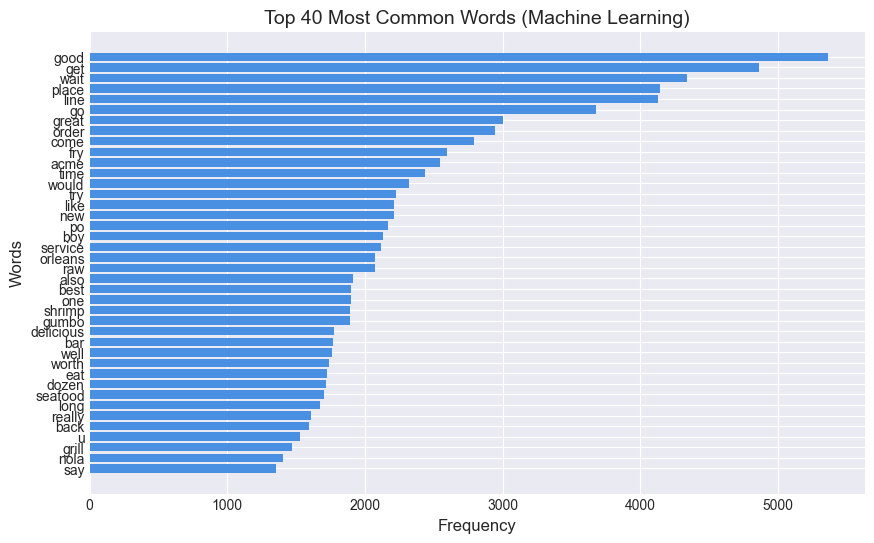


=== 📊 ANALISIS KATA PALING UMUM (Deep Learning)) ===
20 Kata Paling Umum:
not             9446
but             7077
good            5393
get             4845
so              4441
wait            4313
place           4140
line            4136
go              3676
great           3002
order           2898
come            2777
fry             2580
if              2575
acme            2548
time            2436
just            2430
would           2321
new             2214
like            2209
very            2204
try             2199
po              2165
boy             2129
service         2117
orleans         2071
raw             2071
also            1916
best            1900
one             1896
shrimp          1894
gumbo           1889
delicious       1774
bar             1769
worth           1743
well            1731
eat             1728
dozen           1719
seafood         1702
long            1665


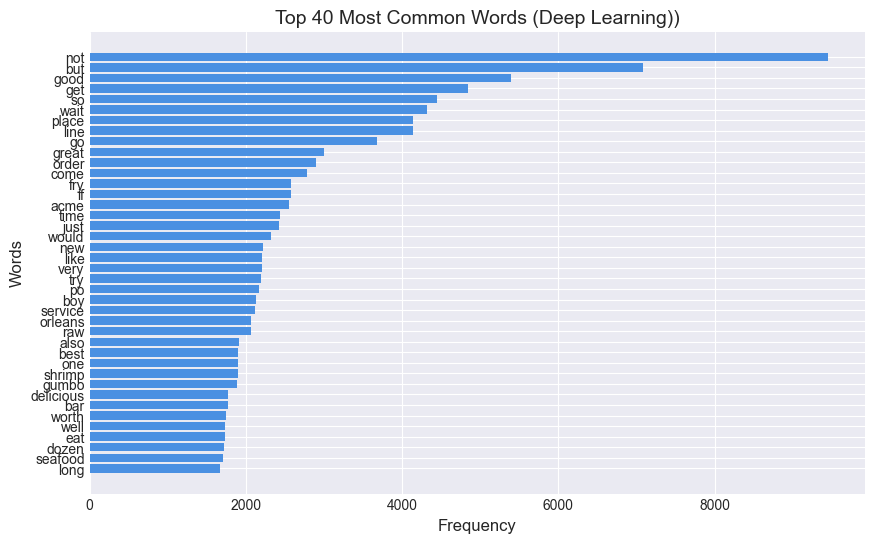


=== 📊 ANALISIS KATA PALING UMUM (Transformer) ===
20 Kata Paling Umum:
be              41792
the             38590
and             23283
a               18577
i               17359
oyster          15750
to              14402
have            10960
it              10608
of              9891
we              9732
not             9446
in              8995
but             7077
for             6852
you             6122
good            5585
with            5033
this            4937
get             4906
that            4889
my              4777
do              4766
they            4569
so              4441
wait            4412
on              4141
place           4140
line            4136
at              3982
go              3676
food            3546
chargrilled     3231
order           3128
there           3066
great           3003
come            2793
will            2768
here            2655
our             2587


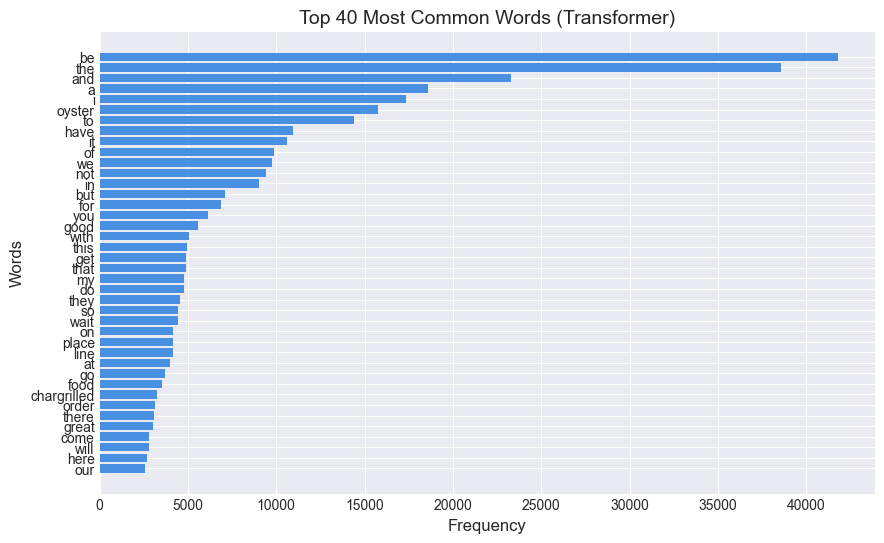

In [167]:
plt.style.use('seaborn-v0_8-darkgrid')

def analyze_common_words(df, column_name, title_suffix):
    print(f"\n=== 📊 ANALISIS KATA PALING UMUM ({title_suffix}) ===")

    # Gabungkan semua token dari kolom
    all_tokens = [token for tokens_list in df[column_name] for token in tokens_list]

    # Hitung frekuensi kata
    word_freq = Counter(all_tokens)
    common_words = word_freq.most_common(40)

    # Tampilkan di console
    print("20 Kata Paling Umum:")
    for word, freq in common_words:
        print(f"{word:<15} {freq}")

    # Visualisasi
    plt.figure(figsize=(10, 6))
    words, frequencies = zip(*common_words)
    plt.barh(words, frequencies, color="#4a90e2")
    plt.xlabel('Frequency', fontsize=12)
    plt.ylabel('Words', fontsize=12)
    plt.title(f"Top 40 Most Common Words ({title_suffix})", fontsize=14)
    plt.gca().invert_yaxis()
    plt.show()

# 🔹 Analisis per model
analyze_common_words(df, 'lemmatized_ml', 'Machine Learning')
analyze_common_words(df, 'lemmatized_dl', 'Deep Learning)')
analyze_common_words(df, 'lemmatized_bert', 'Transformer')

In [168]:
print(df.info())
df.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7673 entries, 0 to 7672
Data columns (total 19 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   business_name           7673 non-null   object 
 1   review_id               7673 non-null   object 
 2   user_id                 7673 non-null   object 
 3   date                    7673 non-null   object 
 4   text                    7673 non-null   object 
 5   stars_review            7673 non-null   float64
 6   stars_business_average  7673 non-null   float64
 7   cleaned_text            7673 non-null   object 
 8   original_length         7673 non-null   int64  
 9   cleaned_length          7673 non-null   int64  
 10  normalized_text         7673 non-null   object 
 11  case_folded_text        7673 non-null   object 
 12  tokens                  7673 non-null   object 
 13  tokens_ml               7673 non-null   object 
 14  tokens_dl               7673 non-null   

,business_name,review_id,user_id,date,text,stars_review,stars_business_average,cleaned_text,original_length,cleaned_length,normalized_text,case_folded_text,tokens,tokens_ml,tokens_dl,tokens_bert,lemmatized_ml,lemmatized_dl,lemmatized_bert
0,Acme Oyster House,vHLTOsdILT7xgTu7TAWTUQ,417HF4q8ynnWtuJrkNax_g,2016-07-25 04:34:34,This place has amazing oysters and the BEST bl...,5.0,4.0,This place has amazing oysters and the BEST bl...,556,546,This place has amazing oysters and the BEST bl...,this place has amazing oysters and the best bl...,"[this, place, has, amazing, oysters, and, the,...","[place, amazing, best, bloody, mary, stay, nol...","[place, amazing, best, bloody, mary, stay, nol...","[this, place, has, amazing, oysters, and, the,...","[place, amaze, best, bloody, mary, stay, nola,...","[place, amaze, best, bloody, mary, stay, nola,...","[this, place, have, amazing, oyster, and, the,..."
1,Acme Oyster House,I90lP6oPICTkrhCFGQt5tA,1UAb3zZQeGX6fzZax5DY1A,2016-12-19 20:27:16,OH MY!! A must try. We had no idea there would...,5.0,4.0,OH MY A must try We had no idea there would be...,425,407,OH MY A must try We had no idea there would be...,oh my a must try we had no idea there would be...,"[oh, my, a, must, try, we, had, no, idea, ther...","[oh, must, try, idea, would, line, definitely,...","[oh, must, try, no, idea, would, line, but, bu...","[oh, my, a, must, try, we, had, no, idea, ther...","[oh, must, try, idea, would, line, definitely,...","[oh, must, try, no, idea, would, line, but, bu...","[oh, my, a, must, try, we, have, no, idea, the..."
2,Acme Oyster House,469eAl2fB069YTF_B5zW7w,p2kXD3gNu3N776C0WrmBjA,2018-08-23 20:58:39,The fried seafood was extremely hot. Very nice...,5.0,4.0,The fried seafood was extremely hot Very nice ...,530,498,The fried seafood was extremely hot Very nice ...,the fried seafood was extremely hot very nice ...,"[the, fried, seafood, was, extremely, hot, ver...","[fried, seafood, extremely, hot, nice, taste, ...","[fried, seafood, extremely, hot, very, nice, t...","[the, fried, seafood, was, extremely, hot, ver...","[fry, seafood, extremely, hot, nice, taste, ad...","[fry, seafood, extremely, hot, very, nice, tas...","[the, fried, seafood, be, extremely, hot, very..."
3,Acme Oyster House,aPpHBDs7Jiiq0sb9YutOhQ,7cDhfvTSH1wTxEmXMj_ChQ,2013-06-24 18:07:12,I love this place. I wish my stay was longer s...,5.0,4.0,I love this place I wish my stay was longer so...,193,188,I love this place I wish my stay was longer so...,i love this place i wish my stay was longer so...,"[i, love, this, place, i, wish, my, stay, was,...","[love, place, wish, stay, longer, could, visit...","[love, place, wish, stay, longer, so, could, v...","[i, love, this, place, i, wish, my, stay, was,...","[love, place, wish, stay, longer, could, visit...","[love, place, wish, stay, longer, so, could, v...","[i, love, this, place, i, wish, my, stay, be, ..."
4,Acme Oyster House,k9OG5kA5ebruSx_f1T-P-A,7QTh-fkw9Nr2lO10-PV8yw,2010-10-06 08:03:20,"Loved the chargrilled oysters! I mean, seriou...",3.0,4.0,Loved the chargrilled oysters I mean seriously...,1286,1229,Loved the chargrilled oysters I mean seriously...,loved the chargrilled oysters i mean seriously...,"[loved, the, chargrilled, oysters, i, mean, se...","[loved, mean, seriously, never, tastier, cooke...","[loved, mean, seriously, never, tastier, cooke...","[loved, the, chargrilled, oysters, i, mean, se...","[love, mean, seriously, never, tasty, cooked, ...","[love, mean, seriously, never, tasty, cook, di...","[love, the, chargrilled, oyster, i, mean, seri..."


## Save Pre-processing

In [169]:
# Tentukan nama file output
output_filename = "yelp_review_preprocessed.csv"

# Simpan di folder kerja saat ini
output_path = os.path.join(os.getcwd(), output_filename)

# Simpan dataframe ke CSV
df.to_csv(output_path, index=False, encoding='utf-8-sig')